# Import

In [613]:
import os
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
import copy
import scipy
import torch
from scipy.stats import entropy
from sklearn import manifold, decomposition
import math
import csv
import pandas as pd
from tensorboard.backend.event_processing import event_accumulator
from matplotlib import cm
from scipy.interpolate import interp2d
from scipy.interpolate import RegularGridInterpolator as RGI
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from scipy.io import savemat
import scipy.io as scio

def normalization1(data):
    assert data.shape[0]==750 or data.shape[0]==600 or data.shape[0]==300 or data.shape[0]==120
    data = data - np.mean(data, axis=1)[:,np.newaxis]
    data = data/(np.max(np.abs(data), axis=1)[:,np.newaxis]+0.00001)
    data = data - np.min(data)
    data = data/np.max(data)
    return data

# def normalization1(data):
#     assert data.shape[0]==600 or data.shape[0]==300 or data.shape[0]==120
#     data = data - np.min(data)
#     data = data/(np.max(np.abs(data)))
#     return data

def normalization2(data):
    assert data.shape[0]==750 or data.shape[0]==600 or data.shape[0]==300 or data.shape[0]==120
    data = data - np.mean(data, axis=1)[:,np.newaxis]
    data = data/(np.max(np.abs(data), axis=1)[:,np.newaxis]+0.00001)
    return data


def mean_var(A):
    mean = np.mean(A)
    var = np.var(A)
    std = np.std(A)
    return mean, var, std

def c_mass(data):
    interval = 5
    mass_max = 0
    mass_loc = 0
    for i in range(len(data)-interval):
        if np.sum(data[i:i+interval]) > mass_max:
            mass_max = np.sum(data[i:i+interval])
            mass_loc = i + interval/2
    return (mass_loc, mass_max)

def sorting(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  

    return B

def relu(inX):
    return np.maximum(0,inX)

def cal_TI(h, start=20, end=80):
    hidden_act = h.T #600,90
    assert hidden_act.shape[0]==750 or hidden_act.shape[0]==600 or hidden_act.shape[0]==300 or hidden_act.shape[0]==120
    data = relu(normalization2(hidden_act).T) #90,600
    # data = relu(hidden_act.T[20:80,])
    ts = data.shape[0]  # number of time points
    entrpy_bins = end-start
    window_size = 4
    r_threshold = 0

    entrpy_max = entropy(np.ones(entrpy_bins)*data.shape[1]/entrpy_bins)
    # selected_indx = np.nonzero(np.mean(data, axis=0) > r_threshold)[0]
    selected_indx = np.where(np.max(data, axis=0) > r_threshold)[0] # 大于平均发放率的神经元下标
    # selected_indx = np.array(selected_indx).squeeze()
    data = data[:, selected_indx]

    peak_times = np.argmax(data, axis=0) # 峰值时刻
    delay_peak_times = np.argmax(data[start:end,:], axis=0) #延迟时间 最大的发放率的下标
    end_times = np.clip(delay_peak_times + window_size + 1, 0, ts)
    start_times = np.clip(delay_peak_times - window_size, 0, ts)
    # entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) 
    entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) # 延迟时间的能量
    entrpy_ori = entropy(np.histogram(delay_peak_times, entrpy_bins)[0], base=2)
    # entrpy = entropy(np.histogram(peak_times, entrpy_bins)[0] + 0.1 * np.ones(entrpy_bins))
    r2b_ratio = np.zeros(len(selected_indx)) # 大于平均发放率的神经元比例
    trans_index = 0
    for nind in range(len(selected_indx)):
        # mask = np.zeros(ts)
        # mask[int(start_times[nind]):int(end_times[nind])] = 1
        data0 = data[start:end, nind]
        # ridge = np.mean(data0[int(start_times[nind]):int(end_times[nind])])
        ridge = np.sum(data0[start_times[nind]:end_times[nind]])
        # backgr = np.mean(np.ma.MaskedArray(data0, mask))
        backgr = np.sum(data0)
        # r2b_ratio[nind] = np.log(ridge) - np.log(backgr)
        if backgr == 0:
            r2b_ratio[nind] = 0
        else:
            r2b_ratio[nind] = ridge/backgr #* (end-start)/(end_times[nind]-start_times[nind]) # 窗口期间发放率
        trace_sum = ridge/(end_times[nind]-start_times[nind])
        trans_index += trace_sum

    trans_index /= len(selected_indx)
    entrpy = entrpy / entrpy_max
    r2b_ratio = np.nanmean(r2b_ratio)

    index1 = np.where(peak_times>=start)
    index2 = np.where(peak_times<end)
    index_delay = np.intersect1d(index1[0], index2[0]) # 延迟期间的下标
    trans_len = len(index_delay)/len(selected_indx)
    # transient_index = np.sum(data)/(60*500)
    SI_trial_vec = r2b_ratio + entrpy
    Total = SI_trial_vec + trans_len
    return round(Total, 3), entrpy_ori, entrpy, r2b_ratio, round(SI_trial_vec, 3), trans_index, trans_len


def sumTI(*args, a=4, b=16):
    TIlist = []
    for i in range(len(args)):
        netdir  = args[i]
        results = np.load(netdir)
        hidden_act = results
        print(hidden_act.shape)
        data0 = hidden_act
        ti = cal_TI(data0,a,b)[0] 
        TIlist.append(ti)
        print(ti)
    return np.array(TIlist).mean(), np.array(TIlist).std()/np.sqrt(len(args))
    
def P_value(value1, value2, num=3):
    t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[0], value1[1], num, value2[0], value2[1], num, equal_var=False)
    print("t-value: ", t_stat)
    print("p-value: ", p_value)
    
dirs = os.path.abspath('.') + '/figure'
if not os.path.exists(dirs):
    os.makedirs(dirs)

class Bezier:
    # 输入控制点，Points是一个array,num是控制点间的插补个数
    def __init__(self,Points,InterpolationNum):
        self.demension=Points.shape[1]   # 点的维度
        self.order=Points.shape[0]-1     # 贝塞尔阶数=控制点个数-1
        self.num=InterpolationNum        # 相邻控制点的插补个数
        self.pointsNum=Points.shape[0]   # 控制点的个数
        self.Points=Points
        
    # 获取Bezeir所有插补点
    def getBezierPoints(self,method):
        if method==0:
            return self.DigitalAlgo()
        if method==1:
            return self.DeCasteljauAlgo()
    
    # 数值解法
    def DigitalAlgo(self):
        PB=np.zeros((self.pointsNum,self.demension)) # 求和前各项
        pis =[]                                      # 插补点
        for u in np.arange(0,1+1/self.num,1/self.num):
            for i in range(0,self.pointsNum):
                PB[i]=(math.factorial(self.order)/(math.factorial(i)*math.factorial(self.order-i)))*(u**i)*(1-u)**(self.order-i)*self.Points[i]
            pi=sum(PB).tolist()                      #求和得到一个插补点
            pis.append(pi)            
        return np.array(pis)

def get_files_in_folder(folder_path):
    file_list = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append(file_path)
    return file_list

cmap_list = scio.loadmat('/home/jiashuncheng/code/Trasient/Plot/MyColormaps.mat')
colors = list(cmap_list['mymap'])
cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors)

# Transform

In [485]:
a = '"--algo", "APPO", "--env", "MortarMayhem", "--experiment", "test_gru_relu", "--rnn_type", "gtrnn", "--use_rnn", "True", "--rollout", "70", "--recurrence", "70", "--num_workers", "32", "--num_envs_per_worker", "12", "--num_epochs", "1", "--async_rl", "True", "--train_for_env_steps", "200000000", "--device", "gpu", "--gpu_id", "1", "--rnn_size", "600", "--max_policy_lag", "35", "--alpha", "0.98", "--gate", "1", "--v", "0.1", "--m", "8.0", "--region", "1", "--learning_rate", "2e-4", "--learning_rate_final", "1e-5", "--nonlinearity", "relu", "--command_count", "6", "--batch_size", "1960", "--seed", "2"'
print(a.replace('", "', ' ')[1:-1])

--algo APPO --env MortarMayhem --experiment test_gru_relu --rnn_type gtrnn --use_rnn True --rollout 70 --recurrence 70 --num_workers 32 --num_envs_per_worker 12 --num_epochs 1 --async_rl True --train_for_env_steps 200000000 --device gpu --gpu_id 1 --rnn_size 600 --max_policy_lag 35 --alpha 0.98 --gate 1 --v 0.1 --m 8.0 --region 1 --learning_rate 2e-4 --learning_rate_final 1e-5 --nonlinearity relu --command_count 6 --batch_size 1960 --seed 2


In [638]:
a = '"--algo APPO --env Watermaze2d --experiment watermaze_may_final_vision2_normal/20240127_Watermaze2d_hard_v18_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_1e-3_seed3_size11_relusigm1_relugamma_xa_nor_300 --rnn_type gtrnn --use_rnn True --rollout 64 --recurrence 64 --num_workers 8 --num_envs_per_worker 12 --num_epochs 1 --async_rl True --train_for_env_steps 30000000 --device gpu --gpu_id 5 --rnn_size 300 --max_policy_lag 35 --learning_rate 1e-3 --learning_rate_final 1e-5 --nonlinearity relu --alpha 0.98 --gate 1 --v 0.1 --m 3.0 --region 1 --size 11 --agent_view_size 5 --seed 3 --watermaze2d_mode hard --sig_m 1"'
print(a.replace(' ', '", "'))

"--algo", "APPO", "--env", "Watermaze2d", "--experiment", "watermaze_may_final_vision2_normal/20240127_Watermaze2d_hard_v18_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_1e-3_seed3_size11_relusigm1_relugamma_xa_nor_300", "--rnn_type", "gtrnn", "--use_rnn", "True", "--rollout", "64", "--recurrence", "64", "--num_workers", "8", "--num_envs_per_worker", "12", "--num_epochs", "1", "--async_rl", "True", "--train_for_env_steps", "30000000", "--device", "gpu", "--gpu_id", "5", "--rnn_size", "300", "--max_policy_lag", "35", "--learning_rate", "1e-3", "--learning_rate_final", "1e-5", "--nonlinearity", "relu", "--alpha", "0.98", "--gate", "1", "--v", "0.1", "--m", "3.0", "--region", "1", "--size", "11", "--agent_view_size", "5", "--seed", "3", "--watermaze2d_mode", "hard", "--sig_m", "1"


In [487]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1, 1))  # 控制指数的显示范围
ax.xaxis.set_major_formatter(formatter)

# 添加标题和轴标签
ax.set_title('Line Plot with Scientific Notation')
ax.set_xlabel('X')
ax.set_ylabel('Y')

# 显示图形
plt.show()

# DF task

## 0 distraction

### Line

In [488]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 1e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=2.3e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward0_rnn, reward_std0_rnn = data2(
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed1/.summary/0/events.out.tfevents.1706088969.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed2/.summary/0/events.out.tfevents.1706088969.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed3/.summary/0/events.out.tfevents.1706088970.medical")
fig, ax = plt.subplots()
plt.plot(step,reward0_rnn, label='RNN',color='C0')
plt.fill_between(step, reward0_rnn+lambda_*reward_std0_rnn, reward0_rnn-lambda_*reward_std0_rnn, alpha=0.3,color='C0')

step, reward0_trnn, reward_std0_trnn = data2(
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed1_sigm1/.summary/0/events.out.tfevents.1706089166.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed5_sigm1/.summary/0/events.out.tfevents.1706089705.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed6_sigm1/.summary/0/events.out.tfevents.1706089706.amax")
plt.plot(step,reward0_trnn, label='TRNN',color='C1')
plt.fill_between(step, reward0_trnn+lambda_*reward_std0_trnn, reward0_trnn-lambda_*reward_std0_trnn, alpha=0.3,color='C1')

step, reward0_nn, reward_std0_nn = data2(
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution0_lr3e-4_seed1_no_history/.summary/0/events.out.tfevents.1705598078.snn-ESC4000-G3-Series",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution0_lr3e-4_seed2_no_history/.summary/0/events.out.tfevents.1705598079.snn-ESC4000-G3-Series",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution0_lr3e-4_seed3_no_history/.summary/0/events.out.tfevents.1705598079.snn-ESC4000-G3-Series")
plt.plot(step,reward0_nn, label='TRNN',color='C2')
plt.fill_between(step, reward0_nn+lambda_*reward_std0_nn, reward0_nn-lambda_*reward_std0_nn, alpha=0.3,color='C2')

plt.title("Direction following task\n (Number of distraction=0)",fontsize=16)
plt.yticks([0,0.1],fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/mortar2_0.svg')
# plt.xlim([0, 2e8])
plt.show()

P_value([reward0_rnn[-1], reward_std0_rnn[np.where(reward0_rnn==reward0_rnn[-1])[0][0]]], 
        [reward0_trnn[-1], reward_std0_trnn[np.where(reward0_trnn==reward0_trnn[-1])[0][0]]], 3)

KeyboardInterrupt: 

### TI

In [ ]:
dis0_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed1_sigm1/20240125_171507_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed5_sigm1/20240125_171620_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed6_sigm1/20240125_171625_sf_hidden_act_log.npy")
dis0_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed3/20240125_171423_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed2/20240125_171419_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed3/20240125_171709_sf_hidden_act_log.npy")
print(dis0_trnn, dis0_rnn)
P_value(dis0_trnn,dis0_rnn,3)

(22, 300)
0.923
(22, 300)
1.057
(22, 300)
0.719
(22, 600)
0.62
(22, 600)
0.628
(22, 600)
0.723
(0.8996666666666666, 0.08023484049731532) (0.657, 0.02701028610651052)
t-value:  4.964739191625387
p-value:  0.02498136899450924


(22, 300)


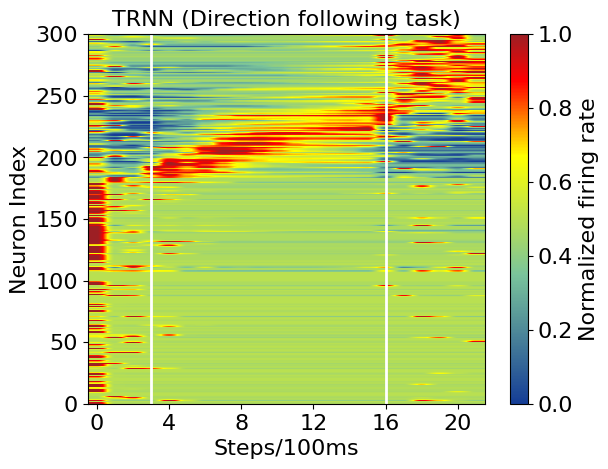

(22, 600)


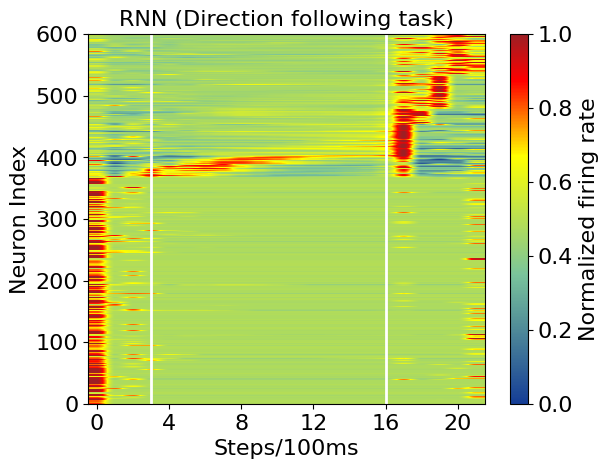

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution0_lr2e-4_seed5_sigm1/20240125_171620_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,300])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps/100ms',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('TRNN (Direction following task)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.savefig('figure/suppfig4b1.svg')
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution0_lr2e-4_seed3/20240125_171423_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps/100ms',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('RNN (Direction following task)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.savefig('figure/suppfig4b2.svg')
plt.show()

## 1 distraction

### Line

19976880
19989024
19980928
0.08829999963442485 0.002963481262610503
19972832
19968784
19956640
0.09303333361943562 0.0003344428969627537
19984976
19980928
19997120
0.02520000000173847 0.0006847545337449782


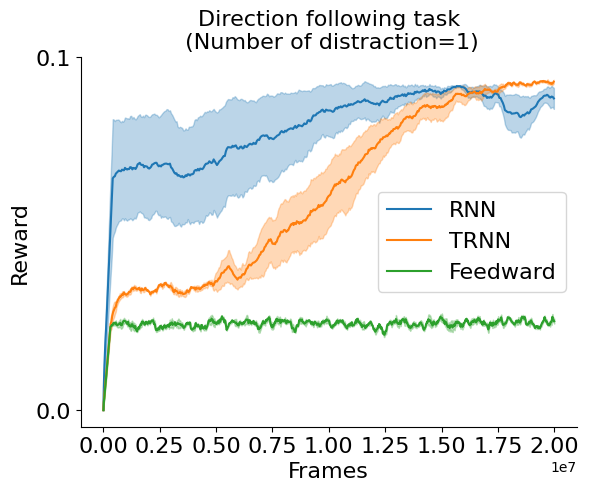

t-value:  -2.749017002803945
p-value:  0.10779122151509808


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 1e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=2e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward[-1], reward_std[np.where(reward==reward[-1])[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward1_rnn, reward_std1_rnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed1/.summary/0/events.out.tfevents.1706069510.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed2/.summary/0/events.out.tfevents.1706069511.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240116_MortarMayhemOA_v19_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed2/.summary/0/events.out.tfevents.1706189817.amax")
fig, ax = plt.subplots()
plt.plot(step,reward1_rnn, label='RNN',color='C0')
plt.fill_between(step, reward1_rnn+lambda_*reward_std1_rnn, reward1_rnn-lambda_*reward_std1_rnn, alpha=0.3,color='C0')

step, reward1_trnn, reward_std1_trnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed1_sigm1/.summary/0/events.out.tfevents.1706175757.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed3_sigm1/.summary/0/events.out.tfevents.1706175758.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed4_sigm1/.summary/0/events.out.tfevents.1706175755.amax")
plt.plot(step,reward1_trnn, label='TRNN',color='C1')
plt.fill_between(step, reward1_trnn+lambda_*reward_std1_trnn, reward1_trnn-lambda_*reward_std1_trnn, alpha=0.3,color='C1')

step, reward1_nn, reward_std1_nn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution1_lr3e-4_seed1_no_history/.summary/0/events.out.tfevents.1705629892.titanX",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution1_lr3e-4_seed2_no_history/.summary/0/events.out.tfevents.1705629893.titanX",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution1_lr3e-4_seed3_no_history/.summary/0/events.out.tfevents.1705629893.titanX")
plt.plot(step,reward1_nn, label='Feedward',color='C2')
plt.fill_between(step, reward1_nn+lambda_*reward_std1_nn, reward1_nn-lambda_*reward_std1_nn, alpha=0.3,color='C2')

plt.title("Direction following task\n (Number of distraction=1)",fontsize=16)
plt.yticks([0,0.1],fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/mortar2_1.svg')
# plt.xlim([0, 1.5e7])
plt.show()

P_value([reward1_rnn[-1], reward_std1_rnn[np.where(reward1_rnn==reward1_rnn[-1])[0][0]]], 
        [reward1_trnn[-1], reward_std1_trnn[np.where(reward1_trnn==reward1_trnn[-1])[0][0]]], 3)

### TI

In [ ]:
dis1_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed1_sigm1/20240125_214422_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed3_sigm1/20240125_214426_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution1_lr2e-4_seed4_sigm1/20240125_214430_sf_hidden_act_log.npy")
dis1_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed1/20240125_214435_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed2/20240125_214439_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera_163/20240116_MortarMayhemOA_v19_myrnn_alpha0.98_gate0_0.1_8.0_distribution1_lr2e-4_seed2/20240125_224156_sf_hidden_act_log.npy")
print(dis1_trnn, dis1_rnn)
P_value(dis1_trnn,dis1_rnn,3)

(22, 300)
0.955
(22, 300)
1.153
(22, 300)
1.049
(22, 600)
0.739
(22, 600)
0.415
(22, 600)
0.579
(1.0523333333333333, 0.046688883600401646) (0.5776666666666667, 0.07636947227980757)
t-value:  9.184909392922307
p-value:  0.0018144885822225898


(22, 600)


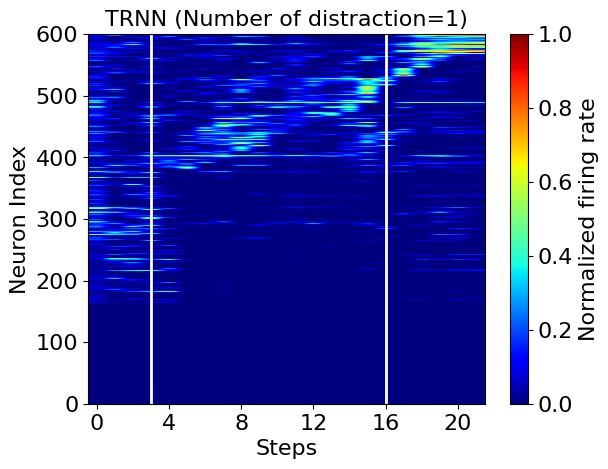

(22, 600)


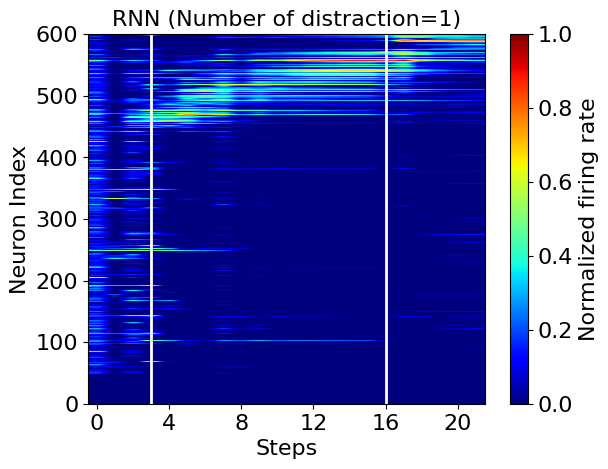

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_2.0_distribution1_lr3e-4_seed1_sigm1/20240121_192102_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('TRNN (Number of distraction=1)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/MortarMayhemOA_v13_myrnn_distribution1_1/20231105_183308_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('RNN (Number of distraction=1)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.show()

## 2 distractions

### Line

29987584
29995680
29979488
0.0828000009059906 0.006963236636573818
29995680
29999728
29991632
0.09100000038743018 0.0037249910669198763
29983536
29987584
29991632
0.02453333344310522 0.000819665680560421


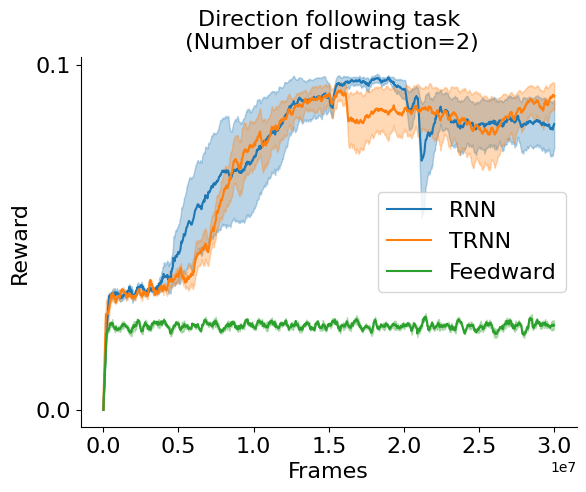

t-value:  -1.7985133202190193
p-value:  0.16818562223236233


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 1e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=3e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward[-1], reward_std[np.where(reward==reward[-1])[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward2_rnn, reward_std2_rnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed1/.summary/0/events.out.tfevents.1706055201.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed2/.summary/0/events.out.tfevents.1706055201.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed3/.summary/0/events.out.tfevents.1706055202.medical")
fig, ax = plt.subplots()
plt.plot(step,reward2_rnn, label='RNN',color='C0')
plt.fill_between(step, reward2_rnn+lambda_*reward_std2_rnn, reward2_rnn-lambda_*reward_std2_rnn, alpha=0.3,color='C0')

step, reward2_trnn, reward_std2_trnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed3_sigm1/.summary/0/events.out.tfevents.1706055200.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed4_sigm1/.summary/0/events.out.tfevents.1706069509.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed5_sigm1/.summary/0/events.out.tfevents.1706069509.medical")
plt.plot(step,reward2_trnn, label='TRNN',color='C1')
plt.fill_between(step, reward2_trnn+lambda_*reward_std2_trnn, reward2_trnn-lambda_*reward_std2_trnn, alpha=0.3,color='C1')

step, reward2_nn, reward_std2_nn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution2_lr3e-4_seed1_no_history/.summary/0/events.out.tfevents.1705630000.titanX",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution2_lr3e-4_seed2_no_history/.summary/0/events.out.tfevents.1705630000.titanX",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution2_lr3e-4_seed3_no_history/.summary/0/events.out.tfevents.1705630000.titanX")
plt.plot(step,reward2_nn, label='Feedward',color='C2')
plt.fill_between(step, reward2_nn+lambda_*reward_std2_nn, reward2_nn-lambda_*reward_std2_nn, alpha=0.3,color='C2')

plt.title("Direction following task\n (Number of distraction=2)",fontsize=16)
plt.yticks([0,0.1],fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/mortar2_2.svg')
# plt.xlim([0, 1.5e7])
plt.show()

P_value([reward2_rnn[-1], reward_std2_rnn[np.where(reward2_rnn==reward2_rnn[-1])[0][0]]], 
        [reward2_trnn[-1], reward_std2_trnn[np.where(reward2_trnn==reward2_trnn[-1])[0][0]]], 3)

### TI

In [ ]:
dis2_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed3_sigm1/20240125_225444_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed4_sigm1/20240125_225449_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution2_lr2e-4_seed5_sigm1/20240125_224723_sf_hidden_act_log.npy")
dis2_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed1/20240125_224728_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed2/20240125_224733_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution2_lr2e-4_seed3/20240125_224737_sf_hidden_act_log.npy")
print(dis2_trnn, dis2_rnn)
P_value(dis2_trnn,dis2_rnn,3)

(22, 300)
1.073
(22, 300)
1.329
(22, 300)
1.559
(22, 600)
0.336
(22, 600)
0.514
(22, 600)
0.761
(1.3203333333333334, 0.11460592706539448) (0.537, 0.10061256824516951)
t-value:  8.896651620946812
p-value:  0.0009516478406072725


(22, 600)


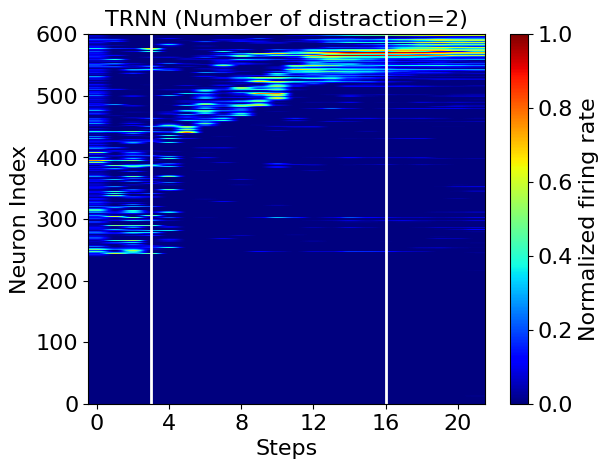

(22, 600)


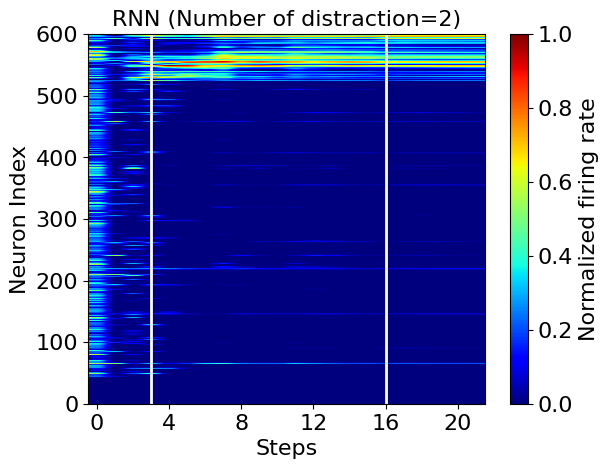

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_2.0_distribution2_lr3e-4_seed1_sigm1/20240121_192300_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('TRNN (Number of distraction=2)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/MortarMayhemOA_v13_myrnn_distribution2_1/20231105_183438_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('RNN (Number of distraction=2)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.show()

## 3 distractions

### Line

29991632
29987584
29987584
0.08136666739980379 0.004034389117693061
29991632
29987584
29995680
0.09440000082055727 0.0009568468471034366
29999728
29999728
29995680
0.02656666667511066 0.00035381524111371385


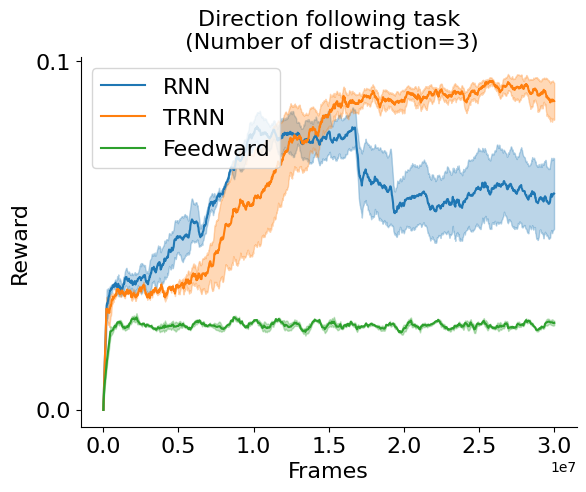

t-value:  -4.355199663241358
p-value:  0.03688778163509311


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 1e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=3e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward3_rnn, reward_std3_rnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed1/.summary/0/events.out.tfevents.1706038545.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed2/.summary/0/events.out.tfevents.1706038546.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed3/.summary/0/events.out.tfevents.1706038546.medical")
fig, ax = plt.subplots()
plt.plot(step,reward3_rnn, label='RNN',color='C0')
plt.fill_between(step, reward3_rnn+lambda_*reward_std3_rnn, reward3_rnn-lambda_*reward_std3_rnn, alpha=0.3,color='C0')

step, reward3_trnn, reward_std3_trnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed1_sigm1/.summary/0/events.out.tfevents.1706038544.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed2_sigm1/.summary/0/events.out.tfevents.1706038544.medical",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed3_sigm1/.summary/0/events.out.tfevents.1706038545.medical")
plt.plot(step,reward3_trnn, label='TRNN',color='C1')
plt.fill_between(step, reward3_trnn+lambda_*reward_std3_trnn, reward3_trnn-lambda_*reward_std3_trnn, alpha=0.3,color='C1')

step, reward3_nn, reward_std3_nn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution3_lr3e-4_seed1_no_history/.summary/0/events.out.tfevents.1705633285.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution3_lr3e-4_seed2_no_history/.summary/0/events.out.tfevents.1705633285.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df/df/20240115_MortarMayhemOA_v13_myrnn_alpha0.98_gate0_0.1_2.0_distribution3_lr3e-4_seed3_no_history/.summary/0/events.out.tfevents.1705633286.amax")
plt.plot(step,reward3_nn, label='Feedward',color='C2')
plt.fill_between(step, reward3_nn+lambda_*reward_std3_nn, reward3_nn-lambda_*reward_std3_nn, alpha=0.3,color='C2')

plt.title("Direction following task\n (Number of distraction=3)",fontsize=16)
plt.yticks([0,0.1],fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/mortar2_3.svg')
# plt.xlim([0, 2.5e7])
plt.show()

P_value([reward3_rnn[-1], reward_std3_rnn[np.where(reward3_rnn==reward3_rnn[-1])[0][0]]], 
        [reward3_trnn[-1], reward_std3_trnn[np.where(reward3_trnn==reward3_trnn[-1])[0][0]]], 3)

### TI

In [ ]:
dis3_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed1_sigm1/20240125_171205_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed2_sigm1/20240125_171210_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed3_sigm1/20240125_171214_sf_hidden_act_log.npy")
dis3_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed1/20240125_171103_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed2/20240125_171107_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed3/20240125_171112_sf_hidden_act_log.npy")
print(dis3_trnn, dis3_rnn)
P_value(dis3_trnn,dis3_rnn,3)

(22, 300)
1.249
(22, 300)
1.472
(22, 300)
0.882
(22, 600)
1.161
(22, 600)
0.501
(22, 600)
0.498
(1.201, 0.14043820309619776) (0.7200000000000001, 0.18003888468883605)
t-value:  3.648657916224444
p-value:  0.024072017925631736


(22, 300)


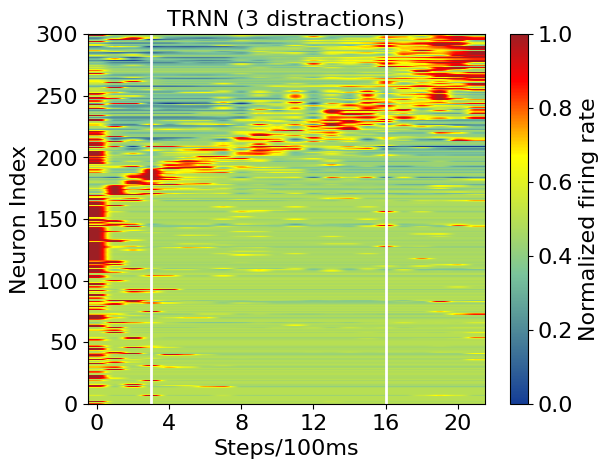

(22, 600)


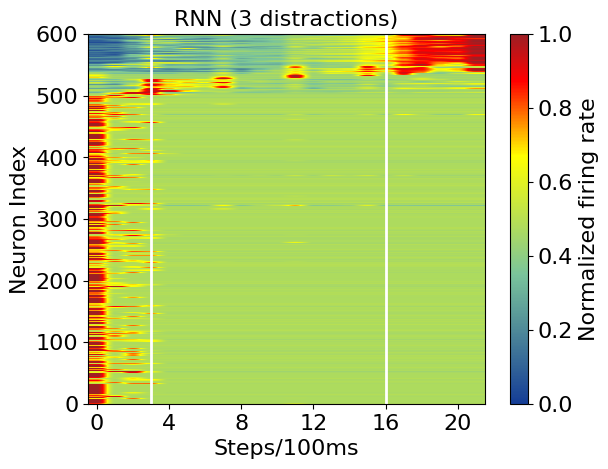

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240115_MortarMayhemOA_v13_gtrnn_alpha0.98_gate1_0.1_8.0_distribution3_lr2e-4_seed2_sigm1/20240125_171210_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,300])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps/100ms',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('TRNN (3 distractions)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.savefig('figure/suppfig4b3.svg')
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/df_dt_new_hiera/20240116_MortarMayhemOA_v14_myrnn_alpha0.98_gate0_0.1_8.0_distribution3_lr2e-4_seed3/20240125_171112_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
cal_TI(data0,4,19)[0] 
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.yticks(fontsize=16)
plt.xticks([0,4,8,12,16,20],fontsize=16)
plt.xlabel('Steps/100ms',fontsize=16)
plt.ylabel('Neuron Index',fontsize=16)
plt.title('RNN (3 distractions)',fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.savefig('figure/suppfig4b4.svg')
plt.show()

## Reward bar

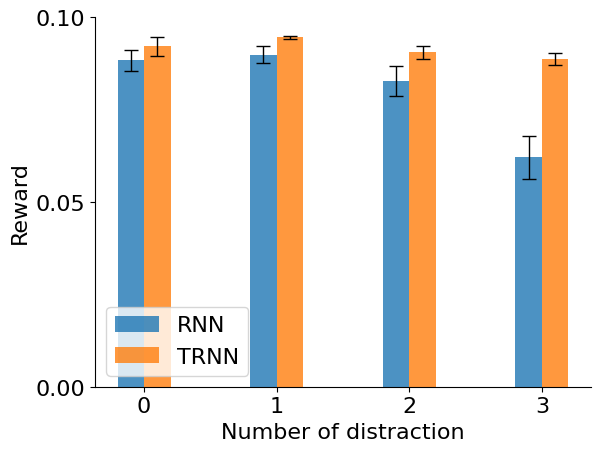

t-value:  -0.9928194678255428
p-value:  0.3770722063100439
t-value:  -2.0397957602804304
p-value:  0.17106022592507486
t-value:  -1.7202545415934178
p-value:  0.18922345388324782
t-value:  -4.355199663241358
p-value:  0.03688778163509311


In [ ]:
x = range(4)
error_params=dict(elinewidth=1,capsize=5)              

# value1 = [reward0_rnn.max(), reward1_rnn.max(), reward2_rnn.max(),reward3_rnn.max()]
# value1_std = [reward_std0_rnn[np.where(reward0_rnn==reward0_rnn.max())[0][0]],
#               reward_std1_rnn[np.where(reward1_rnn==reward1_rnn.max())[0][0]],
#               reward_std2_rnn[np.where(reward2_rnn==reward2_rnn.max())[0][0]],
#               reward_std3_rnn[np.where(reward3_rnn==reward3_rnn.max())[0][0]]]
# value2 = [reward0_trnn.max(), reward1_trnn.max(), reward2_trnn.max(),reward3_trnn.max()]
# value2_std = [reward_std0_trnn[np.where(reward0_trnn==reward0_trnn.max())[0][0]],
#               reward_std1_trnn[np.where(reward1_trnn==reward1_trnn.max())[0][0]],
#               reward_std2_trnn[np.where(reward2_trnn==reward2_trnn.max())[0][0]],
#               reward_std3_trnn[np.where(reward3_trnn==reward3_trnn.max())[0][0]]]

value1 = [reward0_rnn[-1], reward1_rnn[-1], reward2_rnn[-1], reward3_rnn[-1]]
value1_std = [reward_std0_rnn[np.where(reward0_rnn==reward0_rnn[-1])[0][0]],
              reward_std1_rnn[np.where(reward1_rnn==reward1_rnn[-1])[0][0]],
              reward_std2_rnn[np.where(reward2_rnn==reward2_rnn[-1])[0][0]],
              reward_std3_rnn[np.where(reward3_rnn==reward3_rnn[-1])[0][0]]]
value2 = [reward0_trnn[-1], reward1_trnn[-1], reward2_trnn[-1],reward3_trnn[-1]]
value2_std = [reward_std0_trnn[np.where(reward0_trnn==reward0_trnn[-1])[0][0]],
              reward_std1_trnn[np.where(reward1_trnn==reward1_trnn[-1])[0][0]],
              reward_std2_trnn[np.where(reward2_trnn==reward2_trnn[-1])[0][0]],
              reward_std3_trnn[np.where(reward3_trnn==reward3_trnn[-1])[0][0]]]
fig, ax = plt.subplots()
bar1 = plt.bar([i - 0.1 for i in x],value1,yerr=value1_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'RNN')

bar2 = plt.bar([i + 0.1 for i in x],value2,yerr=value2_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'TRNN')

plt.ylabel('Reward',fontsize=16)       #y轴的标签
plt.xlabel('Number of distraction', fontsize=16)  
plt.yticks([0,0.05,0.1],fontsize=16)
plt.xticks([0, 1, 2, 3], [0, 1, 2, 3], fontsize=16)
plt.legend(fontsize=16)            #设置图例
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/distraction.svg')
plt.show()

P_value([reward0_rnn[-1], reward_std0_rnn[np.where(reward0_rnn==reward0_rnn[-1])[0][0]]], 
        [reward0_trnn[-1], reward_std0_trnn[np.where(reward0_trnn==reward0_trnn[-1])[0][0]]], 3)
P_value([reward1_rnn[-1], reward_std1_rnn[np.where(reward1_rnn==reward1_rnn[-1])[0][0]]], 
        [reward1_trnn[-1], reward_std1_trnn[np.where(reward1_trnn==reward1_trnn[-1])[0][0]]], 3)
P_value([reward2_rnn[-1], reward_std2_rnn[np.where(reward2_rnn==reward2_rnn[-1])[0][0]]], 
        [reward2_trnn[-1], reward_std2_trnn[np.where(reward2_trnn==reward2_trnn[-1])[0][0]]], 3)
P_value([reward3_rnn[-1], reward_std3_rnn[np.where(reward3_rnn==reward3_rnn[-1])[0][0]]], 
        [reward3_trnn[-1], reward_std3_trnn[np.where(reward3_trnn==reward3_trnn[-1])[0][0]]], 3)

## TI bar

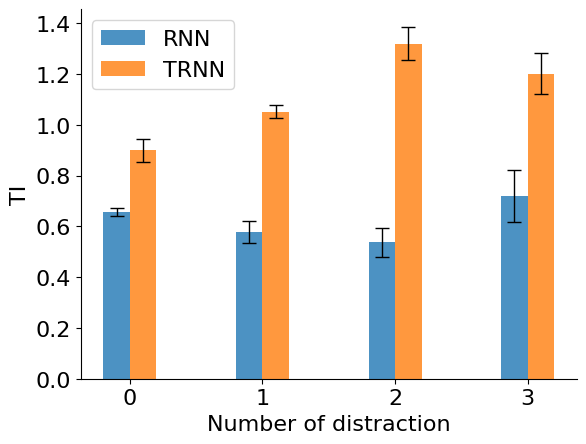

t-value:  -4.964739191625387
p-value:  0.02498136899450924
t-value:  -9.184909392922307
p-value:  0.0018144885822225898
t-value:  -8.896651620946812
p-value:  0.0009516478406072725
t-value:  -3.648657916224444
p-value:  0.024072017925631736


In [ ]:
x = range(4)
error_params=dict(elinewidth=1,capsize=5)              

value1 = [dis0_rnn[0], dis1_rnn[0], dis2_rnn[0], dis3_rnn[0]]
value1_std = [dis0_rnn[1],
              dis1_rnn[1],
              dis2_rnn[1],
              dis3_rnn[1]]
value2 = [dis0_trnn[0], dis1_trnn[0], dis2_trnn[0], dis3_trnn[0]]
value2_std = [dis0_trnn[1],
              dis1_trnn[1],
              dis2_trnn[1],
              dis3_trnn[1]]
fig, ax = plt.subplots()
bar1 = plt.bar([i - 0.1 for i in x],value1,yerr=value1_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'RNN')

bar2 = plt.bar([i + 0.1 for i in x],value2,yerr=value2_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'TRNN')

plt.ylabel('TI',fontsize=16)       #y轴的标签
plt.xlabel('Number of distraction', fontsize=16)  
plt.yticks(fontsize=16)
plt.xticks([0, 1, 2, 3], [0, 1, 2, 3], fontsize=16)
plt.legend(fontsize=16)            #设置图例
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/supp_distraction_ti1.svg')
plt.show()

t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[0], value1_std[0], 3, value2[0], value2_std[0], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[1], value1_std[1], 3, value2[1], value2_std[1], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[2], value1_std[2], 3, value2[2], value2_std[2], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[3], value1_std[3], 3, value2[3], value2_std[3], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)

# MDF task

## Comment=2

### Line

19997120
19980928
19989024
0.16726666539907456 0.0013794795912862548
19976880
19984976
19976880
0.18613333255052567 0.002744826499497589
19960688
19956640
19972832
0.051566666737198834 0.0011778826439079856


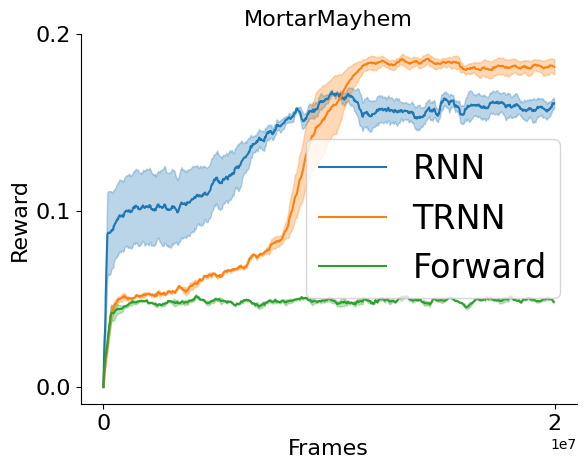

t-value:  -7.036351462726042
p-value:  0.003797108504722676


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 2e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=2e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward_rnn_2, reward_std_rnn_2 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed1/.summary/0/events.out.tfevents.1706029690.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed3/.summary/0/events.out.tfevents.1706029691.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed5/.summary/0/events.out.tfevents.1706029692.amax")
fig, ax = plt.subplots()
plt.plot(step,reward_rnn_2, label='RNN',color='C0')
plt.fill_between(step, reward_rnn_2+lambda_*reward_std_rnn_2, reward_rnn_2-lambda_*reward_std_rnn_2, alpha=0.3,color='C0')

step, reward_trnn_2, reward_std_trnn_2 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002571.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed2_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002571.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed3_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002572.amax")
plt.plot(step,reward_trnn_2, label='TRNN',color='C1')
plt.fill_between(step, reward_trnn_2+lambda_*reward_std_trnn_2, reward_trnn_2-lambda_*reward_std_trnn_2, alpha=0.3,color='C1')

step, reward_nn_2, reward_std_nn_2 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm2_lr2e-4_seed1_no_history/.summary/0/events.out.tfevents.1705597648.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm2_lr2e-4_seed2_no_history/.summary/0/events.out.tfevents.1705597649.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm2_lr2e-4_seed3_no_history/.summary/0/events.out.tfevents.1705597649.amax")
plt.plot(step,reward_nn_2, label='Forward',color='C2')
plt.fill_between(step, reward_nn_2+lambda_*reward_std_nn_2, reward_nn_2-lambda_*reward_std_nn_2, alpha=0.3,color='C2')

plt.title("MortarMayhem",fontsize=16)
plt.yticks([0,0.1,0.2],fontsize=16)
plt.xticks([0,2e7],fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=24)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
# plt.savefig('figure/MortarMayhem.svg')
# plt.xlim([0, 2e8])
plt.show()

P_value([reward_rnn_2[-1], reward_std_rnn_2[np.where(reward_rnn_2==reward_rnn_2[-1])[0][0]]], 
        [reward_trnn_2[-1], reward_std_trnn_2[np.where(reward_trnn_2==reward_trnn_2[-1])[0][0]]], 3)

### TI

In [ ]:
comm2_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/20240125_230125_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed2_relusigm1_relugamma3.0_uniform/20240125_230130_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed3_relusigm1_relugamma3.0_uniform/20240125_230135_sf_hidden_act_log.npy",a=4,b=8)
comm2_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed1/20240125_230140_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed3/20240125_230144_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed5/20240125_230149_sf_hidden_act_log.npy",a=4,b=8)
print(comm2_trnn, comm2_rnn)
P_value(comm2_trnn,comm2_rnn,3)

(22, 300)
1.171
(22, 300)
0.888
(22, 300)
1.177
(22, 600)
0.946
(22, 600)
0.925
(22, 600)
0.841
(1.0786666666666667, 0.07785218662929747) (0.9039999999999999, 0.026191601707417595)
t-value:  3.6831253232857994
p-value:  0.04848095592442161


(22, 600)
(1.995, 3.6574881359521587, 0.6969395302398504, 0.6456230839237499, 1.343, 0.15465029742542732, 0.6521739130434783)


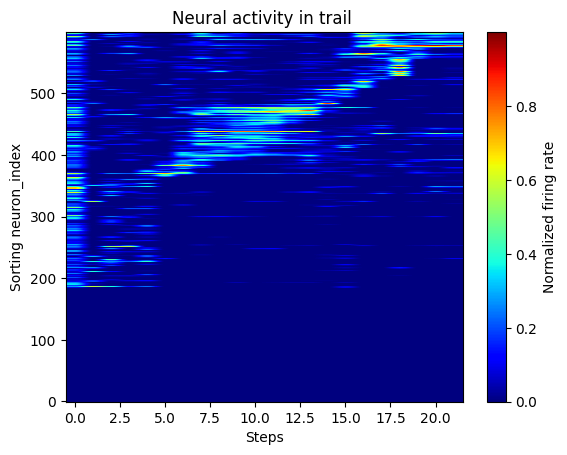

(22, 600)
(1.635, 3.164245869404814, 0.6029515196806708, 0.5997020960056862, 1.203, 0.1300162270717526, 0.43197278911564624)


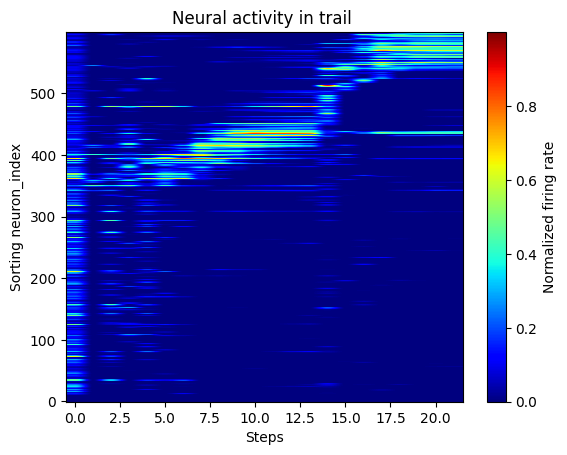

(22, 600)
1.234
(22, 600)
1.46
(22, 600)
1.228
(22, 600)
0.806
(22, 600)
0.751
(22, 600)
0.751
(1.3073333333333332, 0.06234194830544292) (0.7693333333333333, 0.014969103983674991)
t-value:  14.534185050924473
p-value:  0.002971221663478905


In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm2_lr2e-4_seed1_sigm1/20240121_192925_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,2,40))
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.xlabel('Steps')
plt.gca().invert_yaxis()
plt.ylabel('Sorting neuron_index')
plt.title('Neural activity in trail ')#+ str(epoch) +'\n' +'ACC:' + str(acc))
plt.colorbar(fig, label="Normalized firing rate")
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_8.0_region0_comm2_lr2e-4_seed1/20240117_205609_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,2,40))
data0 = normalization1(data0).T
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap='jet')
plt.xlabel('Steps')
plt.gca().invert_yaxis()
plt.ylabel('Sorting neuron_index')
plt.title('Neural activity in trail ')#+ str(epoch) +'\n' +'ACC:' + str(acc))
plt.colorbar(fig, label="Normalized firing rate")
plt.show()

## Comment=4

### Line

139971744
139983888
139996032
0.20076666697859766 0.027885891814523864
139975792
139987936
139987936
0.39030000070730847 0.004229265583241537
139975792
139983888
139983888
0.08323333337903023 0.00013608293787811075


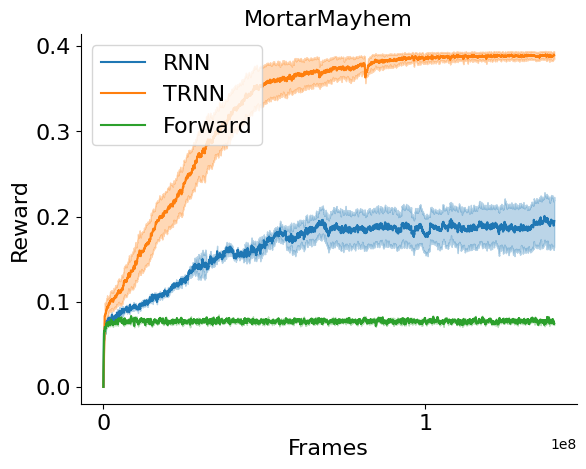

t-value:  -11.639209969452105
p-value:  0.006187959463726895


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 2e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=1.4e8:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward_rnn_4, reward_std_rnn_4 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed1/.summary/0/events.out.tfevents.1706029624.amax","/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed2/.summary/0/events.out.tfevents.1706029624.amax","/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed3/.summary/0/events.out.tfevents.1706029625.amax")
fig, ax = plt.subplots()
plt.plot(step,reward_rnn_4, label='RNN',color='C0')
plt.fill_between(step, reward_rnn_4+lambda_*reward_std_rnn_4, reward_rnn_4-lambda_*reward_std_rnn_4, alpha=0.3,color='C0')

step, reward_trnn_4, reward_std_trnn_4 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002537.amax",
                                               "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed4_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706005818.amax",
                                               "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed5_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706005819.amax")
plt.plot(step,reward_trnn_4, label='TRNN',color='C1')
plt.fill_between(step, reward_trnn_4+lambda_*reward_std_trnn_4, reward_trnn_4-lambda_*reward_std_trnn_4, alpha=0.3,color='C1')

step, reward_nn_4, reward_std_nn_4 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm4_lr2e-4_seed1_no_history/.summary/0/events.out.tfevents.1705592999.titanX",
                                               "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm4_lr2e-4_seed2_no_history/.summary/0/events.out.tfevents.1705593000.titanX",
                                               "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm4_lr2e-4_seed3_no_history/.summary/0/events.out.tfevents.1705593000.titanX")
plt.plot(step,reward_nn_4, label='Forward',color='C2')
plt.fill_between(step, reward_nn_4+lambda_*reward_std_nn_4, reward_nn_4-lambda_*reward_std_nn_4, alpha=0.3,color='C2')

plt.title("MortarMayhem",fontsize=16)
plt.yticks([0,0.1,0.2,0.3,0.4],fontsize=16)
plt.xticks([0,1e8],fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/MortarMayhem.svg')
# plt.xlim([0, 2e8])
plt.show()

P_value([reward_rnn_4.max(), reward_std_rnn_4[np.where(reward_rnn_4==reward_rnn_4.max())[0][0]]], 
        [reward_trnn_4.max(), reward_std_trnn_4[np.where(reward_trnn_4==reward_trnn_4.max())[0][0]]], 3)

### TI

In [ ]:
comm4_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed5_relusigm1_relugamma3.0_uniform/20240125_165843_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed4_relusigm1_relugamma3.0_uniform/20240125_170331_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/20240125_165834_sf_hidden_act_log.npy")
comm4_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed1/20240125_170423_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed2/20240125_170531_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed3/20240125_170431_sf_hidden_act_log.npy")
print(comm4_trnn, comm4_rnn)
P_value(comm4_trnn,comm4_rnn,3)

(46, 300)
1.724
(46, 300)
1.725
(46, 300)
1.804
(46, 600)
1.624
(46, 600)
1.647
(46, 600)
1.516
(1.7510000000000001, 0.02163844315615665) (1.5956666666666666, 0.03297249134028525)
t-value:  6.8218663684246135
p-value:  0.0040509616904388975


(46, 300)


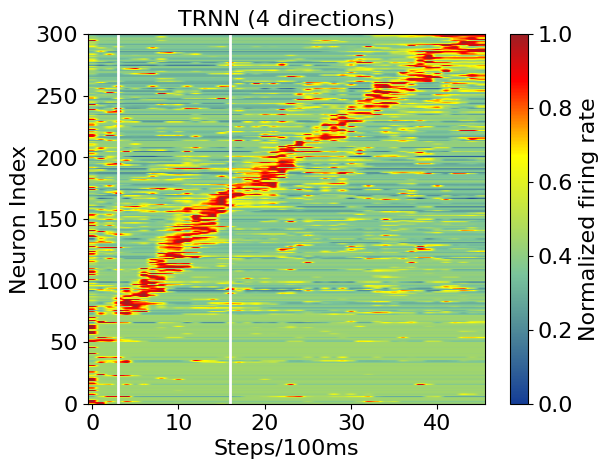

(46, 600)


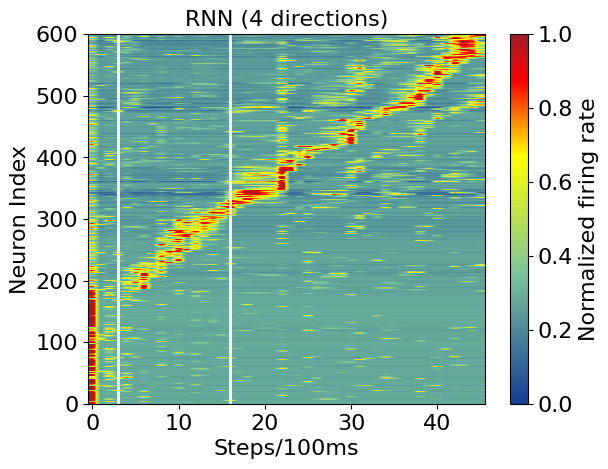

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm4_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/20240125_165834_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=300,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=300,linewidth=2,color='white')
plt.ylim([0,300])
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('figure/suppfig4b5.svg')
plt.show()

netdir  = "/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm4_lr2e-4_seed3/20240125_170431_sf_hidden_act_log.npy"
results = np.load(netdir)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
data0 = normalization1(data0.T)
B_mylstm = sorting(data0)
data0 = data0[B_mylstm,:]
num = len(data0)
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=3,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=16,ymin=0,ymax=600,linewidth=2,color='white')
plt.ylim([0,600])
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
plt.title('RNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('figure/suppfig4b6.svg')
plt.show()

## Comment=6

### Line

199998400
199998400
199990560
0.19963333259026209 0.005824534316292188
199998400
199974880
199990560
0.42900000015894574 0.02413080008904473
199990560
199974880
199990560
0.11263333385189374 0.006788934281320435


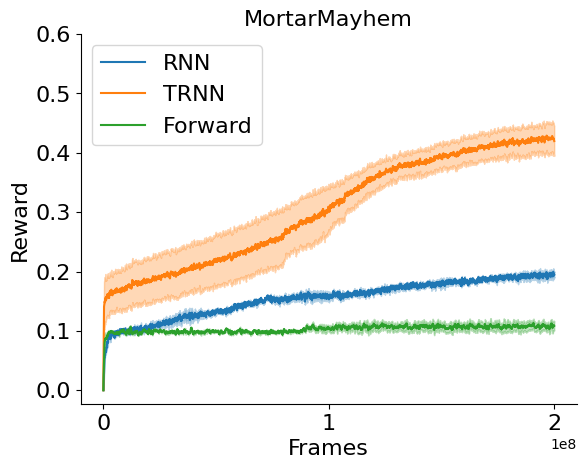

t-value:  -16.003787868697344
p-value:  0.0023888392206449023


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 2e8
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=2e8:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std


lambda_ = 1
step, reward_rnn_6, reward_std_rnn_6 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed1/.summary/0/events.out.tfevents.1706029557.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed2/.summary/0/events.out.tfevents.1706029558.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed4/.summary/0/events.out.tfevents.1706029559.amax")
fig, ax = plt.subplots()
plt.plot(step,reward_rnn_6, label='RNN',color='C0')
plt.fill_between(step, reward_rnn_6+lambda_*reward_std_rnn_6, reward_rnn_6-lambda_*reward_std_rnn_6, alpha=0.3,color='C0')

step, reward_trnn_6, reward_std_trnn_6 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed3_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002526.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed4_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706005829.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/.summary/0/events.out.tfevents.1706002524.amax")
plt.plot(step,reward_trnn_6, label='TRNN',color='C1')
plt.fill_between(step, reward_trnn_6+lambda_*reward_std_trnn_6, reward_trnn_6-lambda_*reward_std_trnn_6, alpha=0.3,color='C1')

step, reward_nn_6, reward_std_nn_6 = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm6_lr2e-4_seed1_no_history/.summary/0/events.out.tfevents.1705804551.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm6_lr2e-4_seed2_no_history/.summary/0/events.out.tfevents.1705804552.amax",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf/20240116_MortarMayhem_v20_myrnn_alpha0.98_gate0_0.1_2.0_region0_comm6_lr2e-4_seed3_no_history/.summary/0/events.out.tfevents.1705804552.amax")
plt.plot(step,reward_nn_6, label='Forward',color='C2')
plt.fill_between(step, reward_nn_6+lambda_*reward_std_nn_6, reward_nn_6-lambda_*reward_std_nn_6, alpha=0.3,color='C2')

plt.title("MortarMayhem",fontsize=16)
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6],fontsize=16)
plt.xticks([0,1e8,2e8],fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xlabel('Frames', fontsize=16)
plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
# plt.savefig('figure/MortarMayhem2.svg')
# plt.xlim([0, 2e8])
plt.show()

P_value([reward_rnn_6.max(), reward_std_rnn_6[np.where(reward_rnn_6==reward_rnn_6.max())[0][0]]], 
        [reward_trnn_6.max(), reward_std_trnn_6[np.where(reward_trnn_6==reward_trnn_6.max())[0][0]]], 3)

### TI

In [ ]:
comm6_trnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed3_relusigm1_relugamma3.0_uniform/20240125_230402_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed4_relusigm1_relugamma3.0_uniform/20240125_230407_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed1_relusigm1_relugamma3.0_uniform/20240125_230412_sf_hidden_act_log.npy",a=4,b=24)
comm6_rnn = sumTI("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed1/20240125_230416_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed2/20240125_230421_sf_hidden_act_log.npy",
"/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed4/20240125_230425_sf_hidden_act_log.npy",a=4,b=24)
print(comm6_trnn, comm6_rnn)
P_value(comm6_trnn,comm6_rnn,3)

(70, 300)
1.795
(70, 300)
1.817
(70, 300)
1.659
(70, 600)
1.462
(70, 600)
1.115
(70, 600)
1.455
(1.757, 0.04034297405441936) (1.344, 0.0935034164557044)
t-value:  7.024444643618985
p-value:  0.008107589917003642


### Success bar

[0.37 0.36 0.3  0.32 0.29 0.2 ] [0.48280431 0.48       0.45825757 0.46647615 0.45376205 0.4       ]
[0.76 0.79 0.76 0.62 0.64 0.62] [0.42708313 0.40730824 0.42708313 0.48538644 0.48       0.48538644]


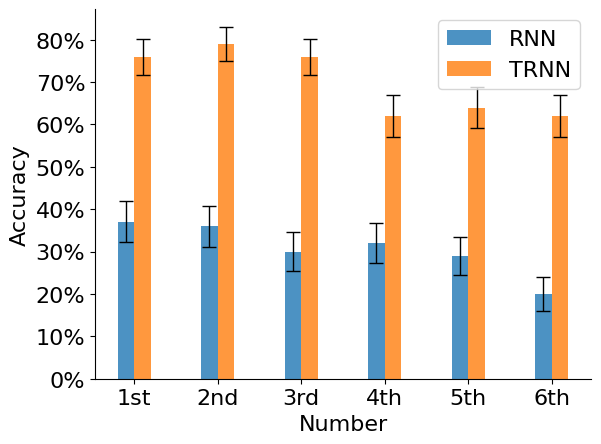

0 :
t-value:  -60.503304203114226
p-value:  2.286806138602995e-128
1 :
t-value:  -68.30561712118062
p-value:  4.2538618537218694e-137
2 :
t-value:  -73.4333485336216
p-value:  4.3430341221894126e-145
3 :
t-value:  -44.563193326673016
p-value:  4.5820533335438896e-105
4 :
t-value:  -52.98774502732165
p-value:  1.1563946234837932e-118
5 :
t-value:  -66.77611507863384
p-value:  2.263510720785773e-134


In [ ]:
error_params=dict(elinewidth=1,capsize=5)   
from matplotlib import ticker
def data(*args):
    ACC = []
    for j in range(len(args)):
        filepath = args[j]
        file = open(filepath, 'r')
        string = file.readlines()
        file.close()
        y = []
        for i in range(len(string)):
            x = string[i].split('\n')[0]
            x = x.split('[')[1].split(']')[0].split(', ')
            x1 = []
            for k in range(6):
                x1.append(float(x[k]))
            y.append(x1)
        ACC = y[:100]
    mean_ = np.mean(ACC, axis=0)
    std_ = np.std(ACC, axis=0)
    print(mean_, std_)
    return mean_, std_/np.sqrt(100)
value1, value1_std = data("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate0_0.1_8.0_region0_comm6_lr2e-4_seed1/20240125_222636_sf_success_list_log.txt")

value2, value2_std = data("/home/jiashuncheng/code/Trasient/RL/train_dir/mdf_dt_new_hiera/20240116_MortarMayhem_v20_gtrnn_alpha0.98_gate1_0.1_8.0_region1_comm6_lr2e-4_seed3_relusigm1_relugamma3.0_uniform/20240125_222602_sf_success_list_log.txt")

x = range(6)
fig, ax = plt.subplots()
bar1 = plt.bar([i - 0.1 for i in x],value1,yerr=value1_std,error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'RNN')

bar3 = plt.bar([i + 0.1 for i in x],value2,yerr=value2_std,error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'TRNN')
plt.ylabel('Accuracy',fontsize=16)       #y轴的标签
plt.xlabel('Number', fontsize=16)  
plt.gca().yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=0))
plt.yticks(fontsize=16)
plt.xticks(range(6), ['1st','2nd','3rd','4th','5th','6th'], fontsize=16)
plt.legend(fontsize=16)            #设置图例
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/6accuracy.svg')
plt.show()
for i in range(6):
    print(i,':')
    P_value([value1[i], value1_std[i]], [value2[i], value2_std[i]], 100)

## Reward bar

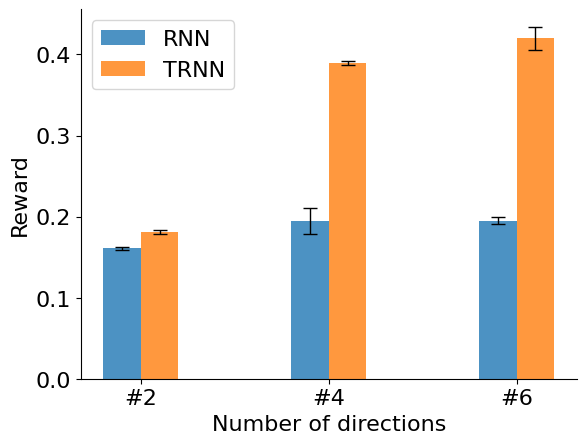

t-value:  -7.036351462726042
p-value:  0.003797108504722676
t-value:  -11.77723568688812
p-value:  0.0059385405339997775
t-value:  -14.9360816358492
p-value:  0.0022322739489886168


In [ ]:
x = range(3) 
error_params=dict(elinewidth=1,capsize=5)              

value1 = [reward_rnn_2[-1], reward_rnn_4[-1], reward_rnn_6[-1]]
value1_std = [reward_std_rnn_2[np.where(reward_rnn_2==reward_rnn_2[-1])[0][0]],
              reward_std_rnn_4[np.where(reward_rnn_4==reward_rnn_4[-1])[0][0]],
              reward_std_rnn_6[np.where(reward_rnn_6==reward_rnn_6[-1])[0][0]]]
value3 = [reward_trnn_2[-1], reward_trnn_4[-1], reward_trnn_6[-1]]
value3_std = [reward_std_trnn_2[np.where(reward_trnn_2==reward_trnn_2[-1])[0][0]],
              reward_std_trnn_4[np.where(reward_trnn_4==reward_trnn_4[-1])[0][0]],
              reward_std_trnn_6[np.where(reward_trnn_6==reward_trnn_6[-1])[0][0]]]
fig, ax = plt.subplots()
bar1 = plt.bar([i - 0.1 for i in x],value1,yerr=value1_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'RNN')

bar3 = plt.bar([i + 0.1 for i in x],value3,yerr=value3_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'TRNN')

plt.ylabel('Reward',fontsize=16)       #y轴的标签
plt.xlabel('Number of directions', fontsize=16)  
plt.yticks([0,0.1,0.2,0.3,0.4],fontsize=16)
plt.xticks([0, 1, 2], ['#2', '#4', '#6'], fontsize=16)
plt.legend(fontsize=16)            #设置图例
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/direction.svg')
plt.show()

t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[0], value1_std[0], 3, value3[0], value3_std[0], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[1], value1_std[1], 3, value3[1], value3_std[1], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[2], value1_std[2], 3, value3[2], value3_std[2], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)

## TI bar

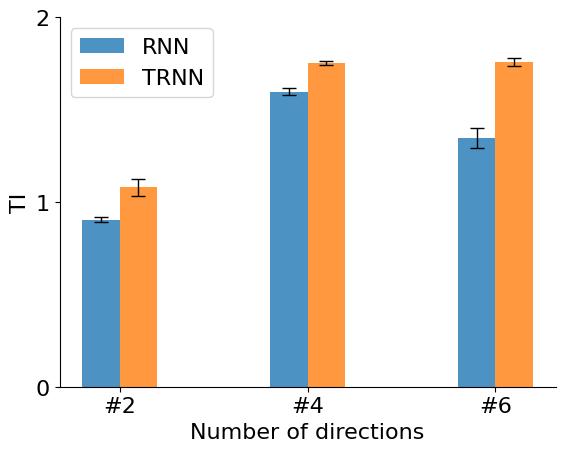

t-value:  -3.6831253232857994
p-value:  0.04848095592442161
t-value:  -6.8218663684246135
p-value:  0.0040509616904388975
t-value:  -7.024444643618985
p-value:  0.008107589917003642


In [ ]:
x = range(3) 
error_params=dict(elinewidth=1,capsize=5)              

value1 = [comm2_rnn[0], comm4_rnn[0], comm6_rnn[0]]
value1_std = [comm2_rnn[1],
              comm4_rnn[1],
              comm6_rnn[1]]
value3 = [comm2_trnn[0].max(), comm4_trnn[0].max(), comm6_trnn[0].max()]
value3_std = [comm2_trnn[1],
              comm4_trnn[1],
              comm6_trnn[1]]
fig, ax = plt.subplots()
bar1 = plt.bar([i - 0.1 for i in x],value1,yerr=value1_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'RNN')

# bar2 = plt.bar([i + 0 for i in x],value2,yerr=value2_std/np.sqrt(3),error_kw=error_params,width = 0.2,
#                alpha = 0.8,color = 'C1',label = 'RNN with transient neuron')

bar3 = plt.bar([i + 0.1 for i in x],value3,yerr=value3_std/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'TRNN')

plt.ylabel('TI',fontsize=16)       #y轴的标签
plt.xlabel('Number of directions', fontsize=16)  
plt.yticks([0,1,2],fontsize=16)
plt.xticks([0, 1, 2], ['#2', '#4', '#6'], fontsize=16)
plt.legend(fontsize=16)            #设置图例
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/supp_direction_ti2.svg')
plt.show()

t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[0], value1_std[0], 3, value3[0], value3_std[0], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[1], value1_std[1], 3, value3[1], value3_std[1], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)
t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[2], value1_std[2], 3, value3[2], value3_std[2], 3, equal_var=False)
print("t-value: ", t_stat)
print("p-value: ", p_value)

# Watermaze2d

In [ ]:
for kk in range(14, 12, -1):
    size=kk
    y = []
    for i in range(size):
        x = (np.random.randint(1,size-1), np.random.randint(1,size-1))
        y.append(x)
    print(kk, y)

14 [(1, 9), (1, 11), (6, 6), (3, 7), (4, 5), (4, 4), (6, 7), (8, 3), (2, 9), (6, 11), (7, 5), (7, 8), (12, 1), (3, 7)]
13 [(7, 8), (6, 3), (6, 3), (1, 2), (7, 3), (1, 6), (10, 6), (9, 3), (9, 10), (4, 3), (10, 2), (9, 2), (4, 6)]


## Line

18997248
18993152
18997248
92.47366612752279 8.150642107551274
18993152
18997248
18993152
194.44699961344404 12.032940846256393
18993152
18997248
18997248
30.71200014750163 0.6362788456015378


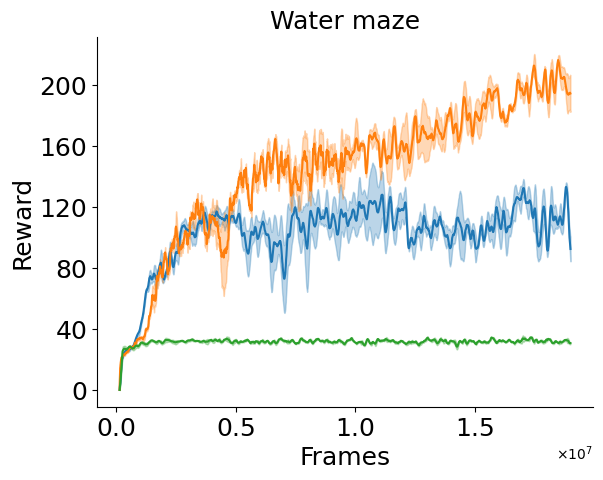

t-value:  -12.152761157165195
p-value:  0.000536869874739429


In [ ]:
def smooth(x, length):
    a = [0]*len(x)
    a[:length] = x[:length]
    for i in range(length):
        a[i] = sum(x[0:i])/length
    for i in range(length, len(x)):
        a[i] = sum(x[i-length:i])/length
    return a

def data(*args):
    path = args
    ACC = []
    length = 100000
    for i in range(len(path)):
        df = pd.read_csv(path[i])
        step = df["Step"].values.tolist()
        reward = df["Value"].values.tolist()
        if len(reward)<length :
            length = len(reward)
        ACC.append(reward)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][:length]
        ACC[i] = smooth(ACC[i], 10)
    step = step[:length]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward.max(), reward_std[np.where(reward==reward.max())[0][0]])
    return step, reward, reward_std

def data2(*args):
    path = args
    ACC = []
    STEP = []
    length = 1.2e7
    for i in range(len(path)):
        ea = event_accumulator.EventAccumulator(path[i])
        ea.Reload()
        val = ea.scalars.Items("reward/reward")
        k = 0
        step = []
        reward = []
        for j in val:
            if j.step<=1.9e7:
                step.append(j.step)
                reward.append(j.value)
            else:
                break
        ACC.append(reward)
        print(step[-1])
        if len(step)<= length:
            STEP = step
            length = len(STEP)
    for i in range(len(ACC)):
        ACC[i] = ACC[i][-1*length:]
        ACC[i] = smooth(ACC[i], 10)
    step = STEP[-1*length:]
    reward = np.stack(ACC, axis=0).mean(0)
    reward_std = np.stack(ACC, axis=0).std(0) / np.sqrt(3)
    print(reward[-1], reward_std[np.where(reward==reward[-1])[0][0]])
    return step, reward, reward_std

lambda_ = 1
step, reward_wat_rnn, reward_std_wat_rnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed2_size11_sigm1/.summary/0/events.out.tfevents.1706030389.titanX",
                    "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed3_size11_sigm1/.summary/0/events.out.tfevents.1706030390.titanX",
                    "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed4_size11_sigm1/.summary/0/events.out.tfevents.1706030390.titanX")
reward = reward_wat_rnn
reward_std = reward_std_wat_rnn
fig, ax = plt.subplots()
plt.plot(step,reward, label='RNN',color='C0')
plt.fill_between(step, reward+lambda_*reward_std, reward-lambda_*reward_std, alpha=0.3,color='C0')

step, reward_wat_trnn, reward_std_wat_trnn = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed6_size11_relusigm1_relugamma_xa_uni/.summary/0/events.out.tfevents.1706163649.medical",
                                "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed7_size11_relusigm1_relugamma_xa_uni/.summary/0/events.out.tfevents.1706163649.medical",
                                "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed8_size11_relusigm1_relugamma_xa_uni/.summary/0/events.out.tfevents.1706163650.medical")
reward = reward_wat_trnn
reward_std = reward_std_wat_trnn
plt.plot(step,reward, label='TRNN',color='C1')
plt.fill_between(step, reward+lambda_*reward_std, reward-lambda_*reward_std, alpha=0.3,color='C1')

step, reward, reward_std = data2("/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze/20240116_Watermaze2d_hard_v8_myrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed2_size11_no_history/.summary/0/events.out.tfevents.1705805283.titanX",
                                "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze/20240116_Watermaze2d_hard_v8_myrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed1_size11_no_history/.summary/0/events.out.tfevents.1705805282.titanX",
                                "/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze/20240116_Watermaze2d_hard_v8_myrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed3_size11_1_no_history/.summary/0/events.out.tfevents.1705806733.titanX")
plt.plot(step,reward, label='Feedword',color='C2')
plt.fill_between(step, reward+lambda_*reward_std, reward-lambda_*reward_std, alpha=0.3,color='C2')

plt.title("Water maze",fontsize=18)
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1, 1))  # 控制指数的显示范围
ax.xaxis.set_major_formatter(formatter)
plt.yticks([0,40,80,120,160,200],fontsize=18)
plt.xticks([0,0.5e7,1e7,1.5e7],fontsize=18)
plt.ylabel('Reward', fontsize=18)
plt.xlabel('Frames', fontsize=18)
# plt.legend(fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/Watermaze.svg')
# plt.xlim([0, 2e7])
plt.show()

P_value([reward_wat_rnn[-1], reward_std_wat_rnn[np.where(reward_wat_rnn==reward_wat_rnn[-1])[0][0]]], 
        [reward_wat_trnn[-1], reward_std_wat_trnn[np.where(reward_wat_trnn==reward_wat_trnn[-1])[0][0]]], 3)

## Bar

(100, 3)
(100, 3)
(100, 3)
(100, 3)
(100, 3)
(100, 3)
[81.7        44.72333333 45.11666667] [20.29340944  9.32428887 10.21661428]
[71.84666667 32.47       37.03      ] [ 6.8560911   3.31341046 10.35712423]


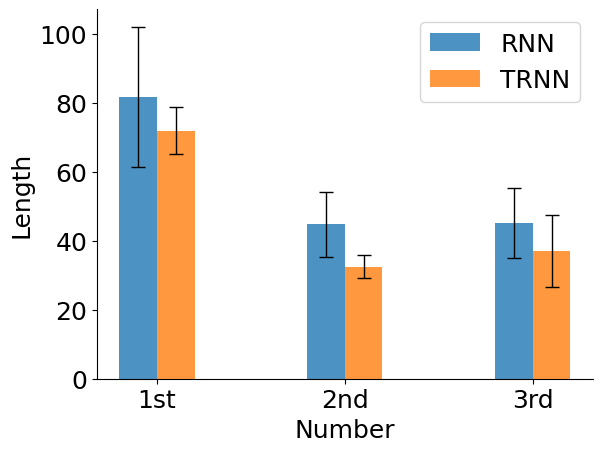

trnn
t-value:  8.956595612849696
p-value:  0.003416493996681171
t-value:  4.855104941276356
p-value:  0.011810328872250288
rnn
t-value:  2.8677446274464193
p-value:  0.06939990428343912
t-value:  2.7889080587835413
p-value:  0.06973534042805268


In [ ]:
def Value(*filepath, index1=350, index2=450):
    Y = []
    ll = 1e8
    for i in range(len(filepath)):
        file = open(filepath[i], 'r')
        string = file.readlines()
        file.close()
        y = []
        l = 0
        for i in range(len(string)):
            if "DeltaFirstR" in string[i]:
                x = string[i].split('[')[1].split(']')[0]
                if x != '':
                    x = x.split(", ")
                    x = [int(j) for j in x]
                    if len(x) >= NUMBER :
                        y.append(x[:NUMBER])
                        l+=1
                    # elif len(x) == 1:
                    #     y.append([x[0],x[0],x[0]])
                    #     l+=1
                    # elif len(x) == 2:
                    #     y.append([x[0],x[1],x[1]])
                    #     l+=1
        if l<=ll:
            ll=l
        y = np.array(y)
        Y.append(y)
    for i in range(len(Y)):
        print(np.array(Y[i][index1:index2,:]).shape)
        Y[i] = np.array(Y[i][index1:index2,:]).mean(0)
        # print(Y[i].shape)
    Y = np.array(Y).reshape(-1, NUMBER)
    # print(Y.shape)
    return Y

NUMBER = 3

value2 = Value(
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed2_size11_sigm1/20240125_215714_sf_test_log.txt',
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed3_size11_sigm1/20240125_215714_sf_test_log.txt',
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed4_size11_sigm1/20240125_215714_sf_test_log.txt')
value4 = Value(
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed6_size11_relusigm1_relugamma_xa_uni/20240125_215524_sf_test_log.txt',
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed7_size11_relusigm1_relugamma_xa_uni/20240125_215524_sf_test_log.txt',
        '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed8_size11_relusigm1_relugamma_xa_uni/20240125_215523_sf_test_log.txt')

x = range(NUMBER)
error_params=dict(elinewidth=1,capsize=5)
fig, ax = plt.subplots()             

bar2 = plt.bar([i - 0.1 for i in x],value2.mean(0),yerr=value2.std(0)/np.sqrt(value2.shape[0]),error_kw=error_params,width = 0.2, alpha = 0.8,color = 'C0',label = 'RNN')
bar4 = plt.bar([i + 0.1 for i in x],value4.mean(0),yerr=value4.std(0)/np.sqrt(value4.shape[0]),error_kw=error_params,width = 0.2, alpha = 0.8,color = 'C1',label = 'TRNN')

print(value2.mean(0), value2.std(0)/np.sqrt(value2.shape[0]))
print(value4.mean(0), value4.std(0)/np.sqrt(value4.shape[0]))
plt.yticks(fontsize=18)
plt.xticks([0,1,2],['1st','2nd','3rd'],fontsize=18)
plt.ylabel('Length', fontsize=18)
plt.xlabel('Number', fontsize=18)
plt.legend(fontsize=18)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.savefig('figure/Watermazebar.svg',bbox_inches='tight', dpi=600)
plt.show()

print('trnn')
P_value([value4.mean(0)[0], (value4.std(0)/np.sqrt(value4.shape[0]))[0]], 
        [value4.mean(0)[1], (value4.std(0)/np.sqrt(value4.shape[0]))[1]], 3)
P_value([value4.mean(0)[0], (value4.std(0)/np.sqrt(value4.shape[0]))[0]], 
        [value4.mean(0)[2], (value4.std(0)/np.sqrt(value4.shape[0]))[2]], 3)
print('rnn')
P_value([value2.mean(0)[0], (value2.std(0)/np.sqrt(value2.shape[0]))[0]], 
        [value2.mean(0)[1], (value2.std(0)/np.sqrt(value2.shape[0]))[1]], 3)
P_value([value2.mean(0)[0], (value2.std(0)/np.sqrt(value2.shape[0]))[0]], 
        [value2.mean(0)[2], (value2.std(0)/np.sqrt(value2.shape[0]))[2]], 3)

In [ ]:
def Value(*filepath, index1=0, index2=15000):
    Y = []
    ll = 1e8
    for i in range(len(filepath)):
        file = open(filepath[i], 'r')
        string = file.readlines()
        file.close()
        y = []
        l = 0
        for i in range(len(string)):
            if "DeltaFirstR" in string[i]:
                x = string[i].split('[')[1].split(']')[0]
                if x != '':
                    x = x.split(", ")
                    x = [int(j) for j in x]
                    if len(x) >= NUMBER :
                        y.append(x[:NUMBER])
                        l+=1
                    # elif len(x) == 1:
                    #     y.append([x[0],x[0],x[0]])
                    #     l+=1
                    # elif len(x) == 2:
                    #     y.append([x[0],x[1],x[1]])
                    #     l+=1
        if l<=ll:
            ll=l
        y = np.array(y)
        Y.append(y)
    for i in range(len(Y)):
        # print(np.array(Y[i][index1:index2,:]).shape)
        Y[i] = np.array(Y[i][index1:index2,:]).mean(0)
        # print(Y[i].shape)
    Y = np.array(Y).reshape(-1, NUMBER)
    # print(Y.shape)
    return Y

def P_value_1(value1, value2, num=3):
        t_stat, p_value = scipy.stats.ttest_ind_from_stats(value1[0], value1[1], num, value2[0], value2[1], num, equal_var=False)
        return p_value

for index1 in range(0,1000):
        index2 = index1+100
        value2 = Value(
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed2_size11_sigm1/20240125_215714_sf_test_log.txt',
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed3_size11_sigm1/20240125_215714_sf_test_log.txt',
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_104/20240117_Watermaze2d_hard_v10_gtrnn_alpha0.98_gate0_0.1_3.0_region0_lr_8e-4_seed4_size11_sigm1/20240125_215714_sf_test_log.txt', index1=index1, index2=index2)
        value4 = Value(
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed6_size11_relusigm1_relugamma_xa_uni/20240125_215524_sf_test_log.txt',
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed7_size11_relusigm1_relugamma_xa_uni/20240125_215524_sf_test_log.txt',
                '/home/jiashuncheng/code/Trasient/RL/train_dir/watermaze_dt_new_hiera_0125/20240125_Watermaze2d_hard_v8_gtrnn_alpha0.98_gate1_0.1_3.0_region1_lr_8e-4_seed8_size11_relusigm1_relugamma_xa_uni/20240125_215523_sf_test_log.txt', index1=index1, index2=index2)

        # print('trnn')
        a = P_value_1([value4.mean(0)[0], (value4.std(0)/np.sqrt(value4.shape[0]))[0]], 
                [value4.mean(0)[1], (value4.std(0)/np.sqrt(value4.shape[0]))[1]], 3)
        b = P_value_1([value4.mean(0)[0], (value4.std(0)/np.sqrt(value4.shape[0]))[0]], 
                [value4.mean(0)[2], (value4.std(0)/np.sqrt(value4.shape[0]))[2]], 3)
        # print('rnn')
        c = P_value_1([value2.mean(0)[0], (value2.std(0)/np.sqrt(value2.shape[0]))[0]], 
                [value2.mean(0)[1], (value2.std(0)/np.sqrt(value2.shape[0]))[1]], 3)
        d = P_value_1([value2.mean(0)[0], (value2.std(0)/np.sqrt(value2.shape[0]))[0]], 
                [value2.mean(0)[2], (value2.std(0)/np.sqrt(value2.shape[0]))[2]], 3)

        if a<0.01 and b<0.01 and c>0.06 and d>0.06 and value4.mean(0)[0] < value2.mean(0)[0]:
                print(index1)

309
324
325
326
327
351
352
353
354
355
356
357
358
359
360
362
363
555


/tmp/ipykernel_249337/3847900214.py:31: RuntimeWarning: Mean of empty slice.
  Y[i] = np.array(Y[i][index1:index2,:]).mean(0)


# ODPA

In [ ]:
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144542_model_1000.pt" # trasient
results = torch.load(netdir)
results.keys()
results['m'].max()

tensor(20.1396, device='cuda:1', grad_fn=<MaxBackward1>)

In [ ]:
(100/60)**3

4.629629629629631

In [ ]:
(np.log(100)/np.log(600))

0.7199032089141345

/tmp/ipykernel_4123647/233381946.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('rainbow', 10)


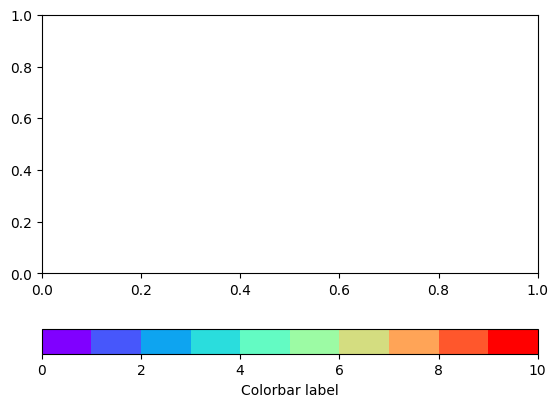

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and axes
fig, ax = plt.subplots()

# Create a colormap
cmap = plt.cm.get_cmap('rainbow', 10)

# Create a norm
norm = plt.Normalize(0, 10)

# Create a colorbar
colorbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap),
                        ax=ax,
                        orientation='horizontal')

# Set the colorbar label
colorbar.set_label('Colorbar label')

# Show the figure
plt.show()

## Trace

### Hidden num = 120

#### 1

1.512 57


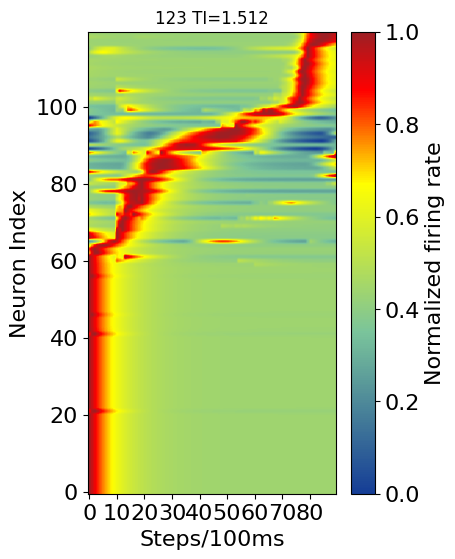

1.112 57


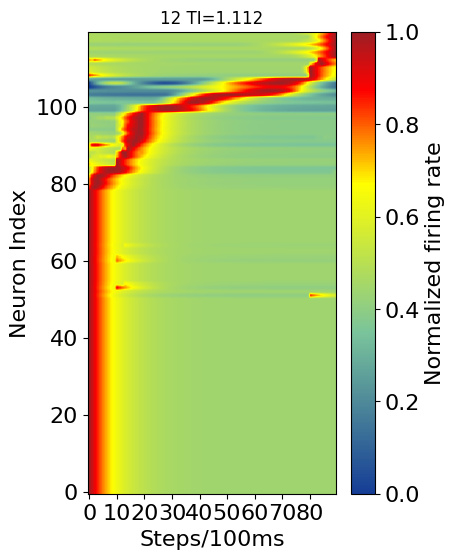

1.061 57


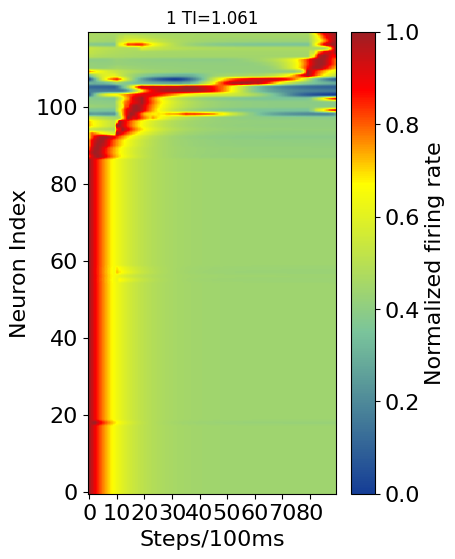

0.967 57


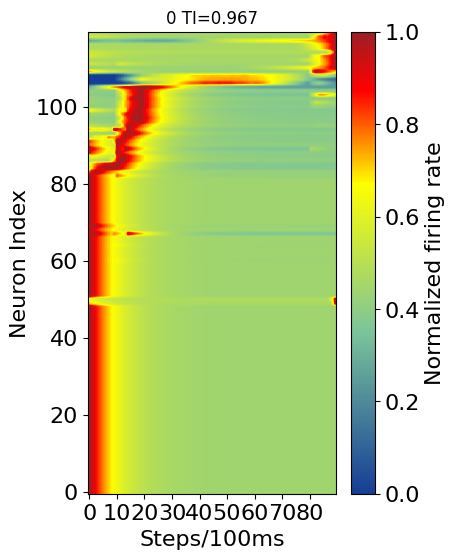

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 57
n2 = 58
width = 4
height = 6

#ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144542_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_0.8_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125135450_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144555_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144602_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 2

1.465 45


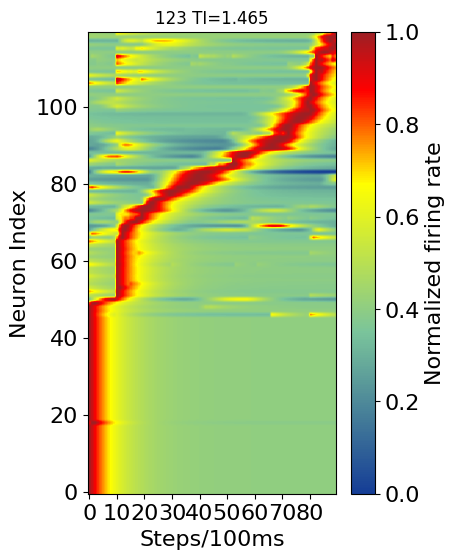

0.999 45


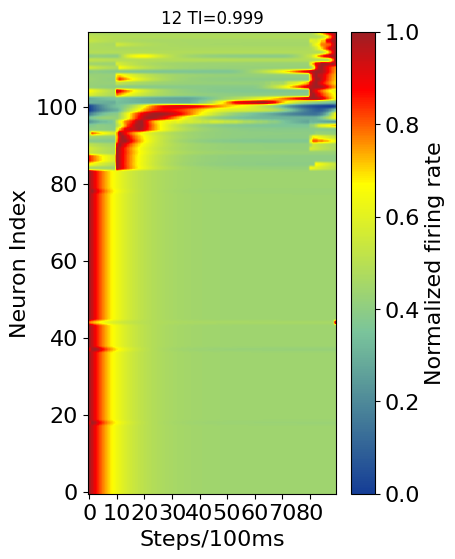

1.026 45


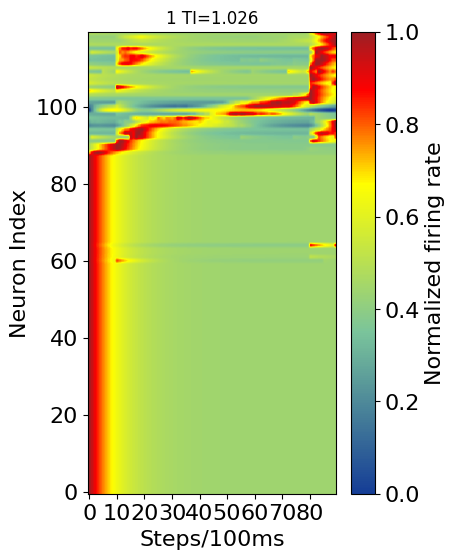

1.145 45


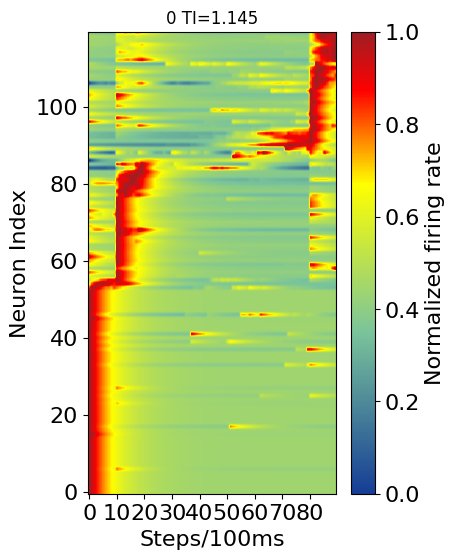

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 45
n2 = 46
width = 4
height = 6

#ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v12_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126061233_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v12_tansient_True_connection_0.8_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126061318_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v12_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126061351_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v10_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126060138_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 3

1.678 38


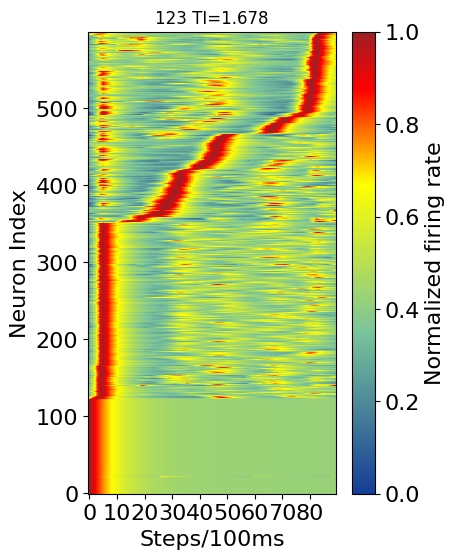

FileNotFoundError: [Errno 2] No such file or directory: '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v20_tansient_True_connection_0.8_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126180956_model_1000.pt'

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 38
n2 = 39
width = 4
height = 6

#ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v2_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126204126_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v20_tansient_True_connection_0.8_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126180956_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v20_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126181002_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v20_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240126181033_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

### 600

#### 1

1.665 35


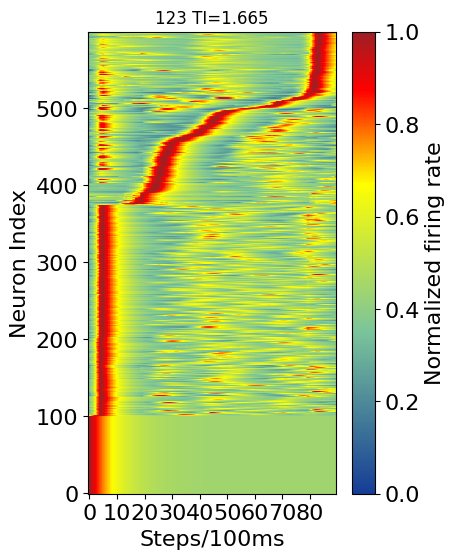

1.536 35


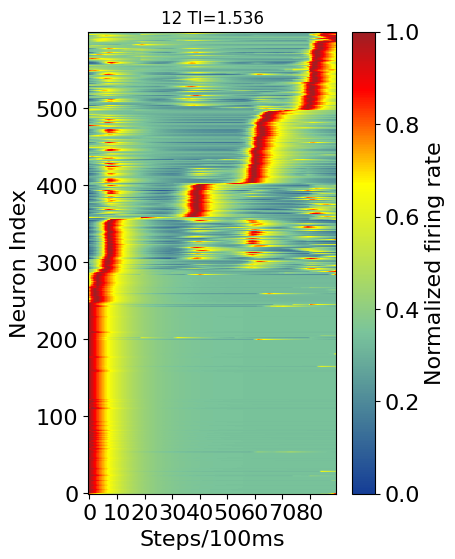

1.28 35


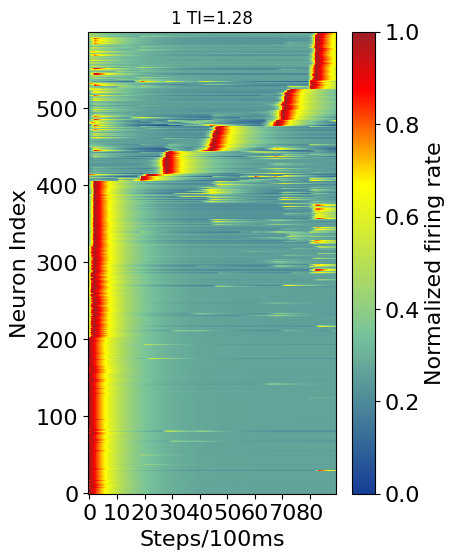

0.923 35


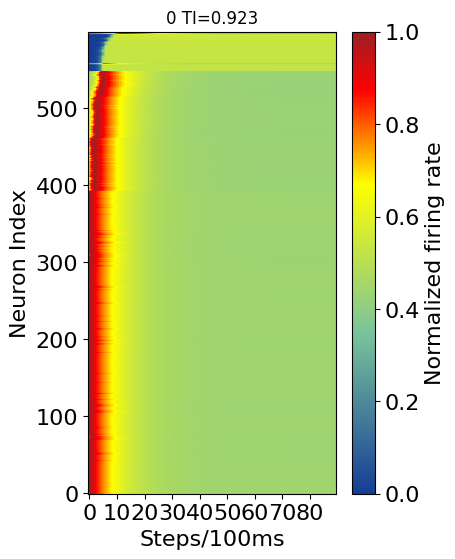

In [547]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 35
n2 = 36
width = 4
height = 6

#ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223427_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_0.4_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223436_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223444_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223451_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 2

1.682 28


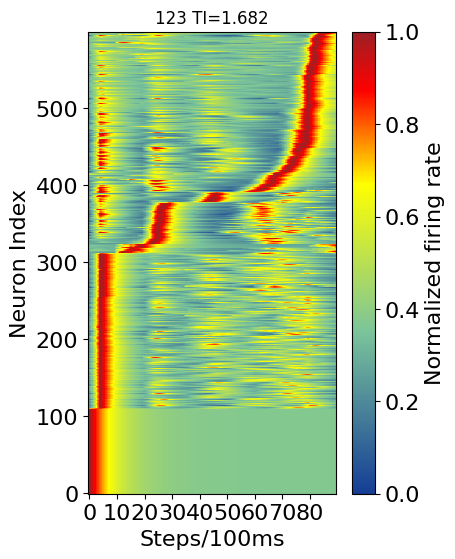

1.568 28


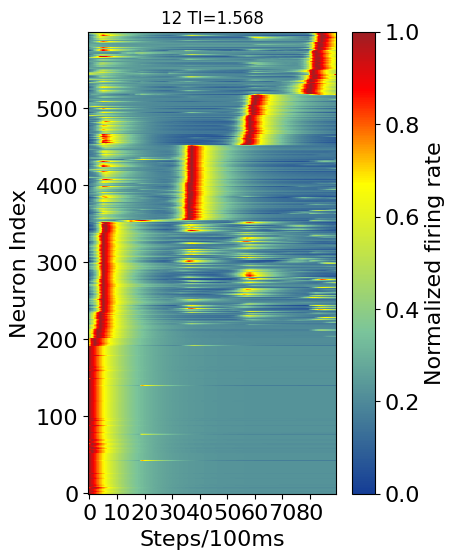

1.369 28


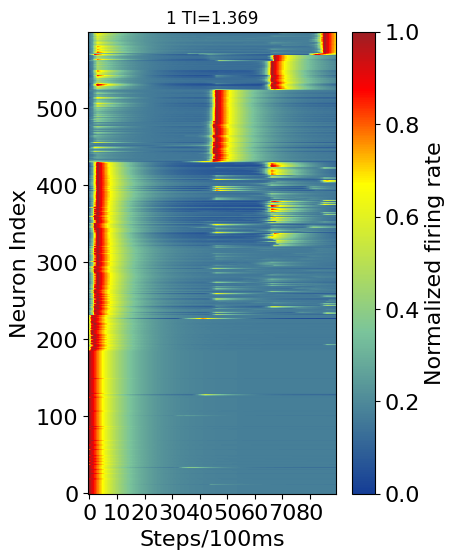

0.928 28


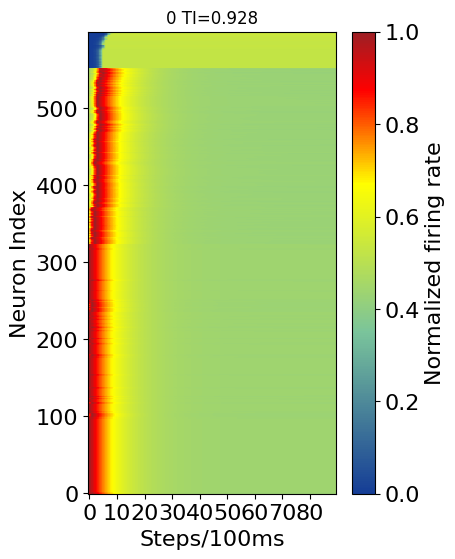

In [564]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 28
n2 = 29
width = 4
height = 6

#ANCHOR 123
#LINK - /home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030642_model_1000.pt
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030642_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_False_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030654_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030703_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030712_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 3

1.915 16


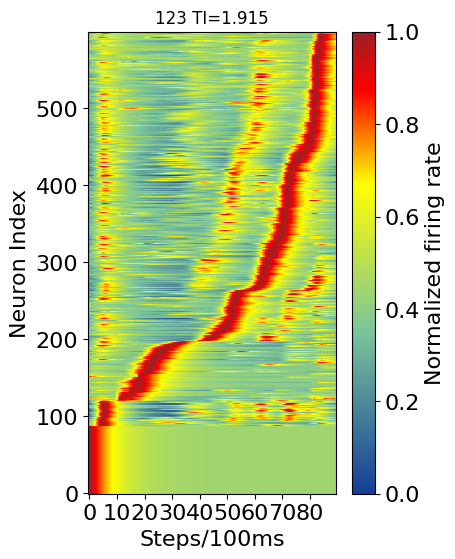

1.907 16


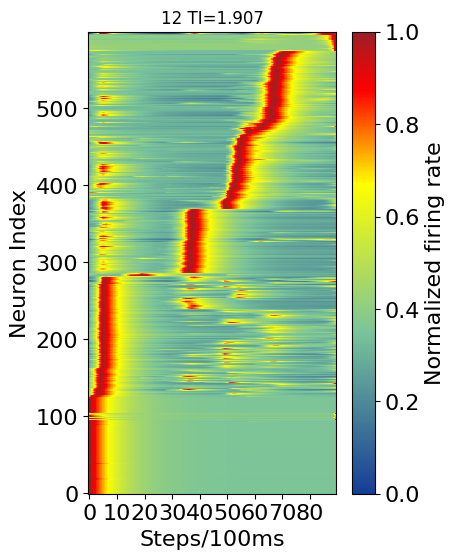

FileNotFoundError: [Errno 2] No such file or directory: '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_1_test_tansient_True_connection_1.0_region_False_mode_test_delay_6_hidd_600_seed_1_lr0.001/20240127235455_model_1_sample_0_match_0_theta_180_noiseh_False.pt'

In [615]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

#TODO - 用random训练的
n1 = 16
n2 = 17
width = 4
height = 6

#ANCHOR 123
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240129/exp_v5_vision2_123_test_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_1_lr0.001/20240127235622_model_1_sample_0_match_0_theta_180_noiseh_False.pt' # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v6_tansient_True_connection_0.4_region_False_mode_train_delay_random_hidd_600_seed_0_lr0.001/20240129113150_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_1_test_tansient_True_connection_1.0_region_False_mode_test_delay_6_hidd_600_seed_1_lr0.001/20240127235455_model_1_sample_0_match_0_theta_180_noiseh_False.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_0_test_tansient_False_connection_1.0_region_False_mode_test_delay_6_hidd_600_seed_1_lr0.001/20240127235429_model_1_sample_0_match_0_theta_180_noiseh_False.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 4

1.258 46


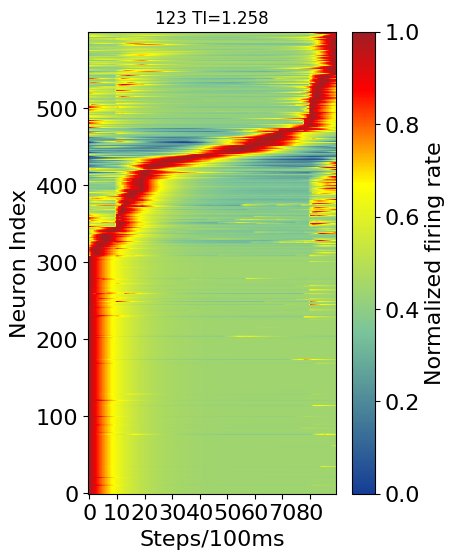

1.212 11


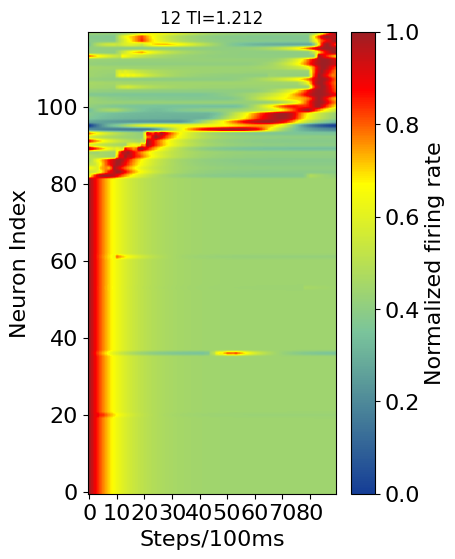

1.107 62


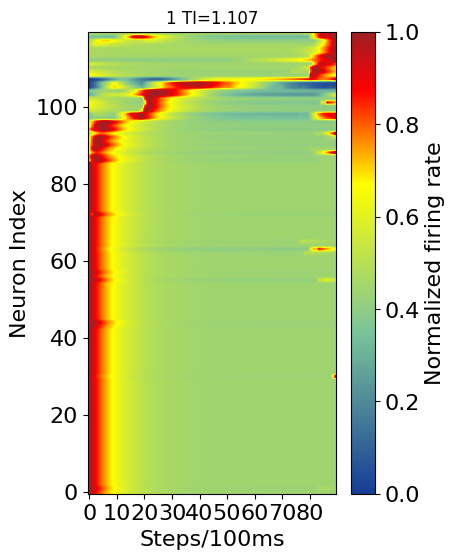

1.185 54


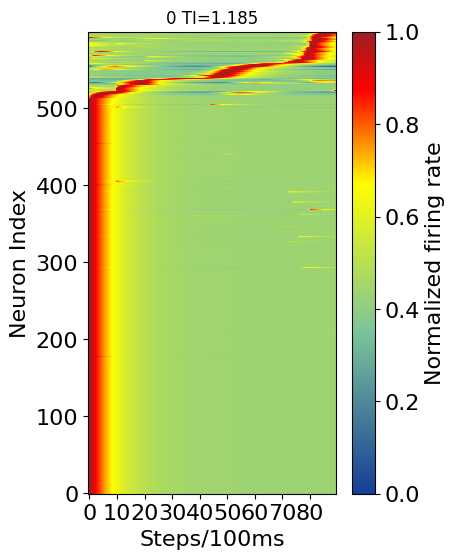

In [637]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

#TODO - 用random训练的
n1 = 0
n2 = 64
width = 4
height = 6

#ANCHOR 123
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v10_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_3_lr0.001/20240129153457_model_1000.pt' # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v9_tansient_True_connection_0.4_region_False_mode_train_delay_6_hidd_120_seed_3_lr0.008/20240129151734_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v9_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_3_lr0.008/20240129152325_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v10_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_3_lr0.01/20240129153916_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

1.485 35


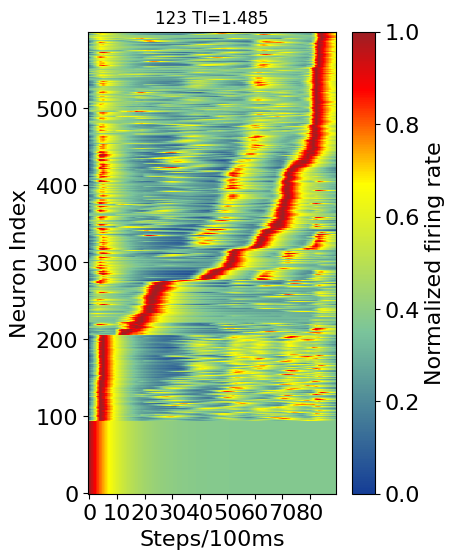

In [521]:
#ANCHOR 123
#LINK - /home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v2_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126204126_model_1000.pt
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_0_lr0.001/20240126230757_model_1_sample_0_match_0_theta_180_noiseh_False.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

### 300

#### 1

1.665 35


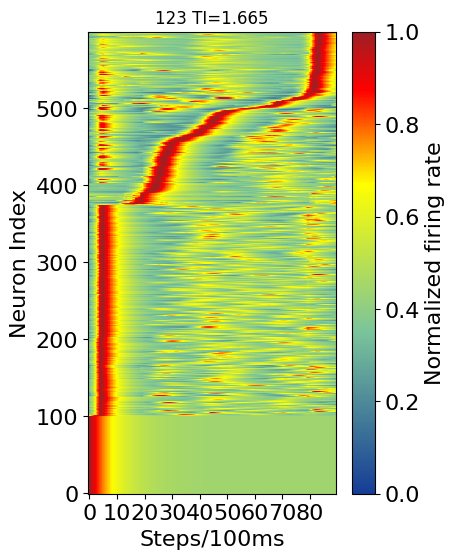

1.536 35


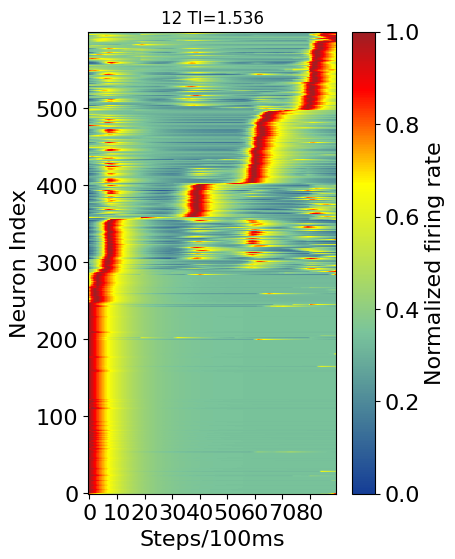

1.28 35


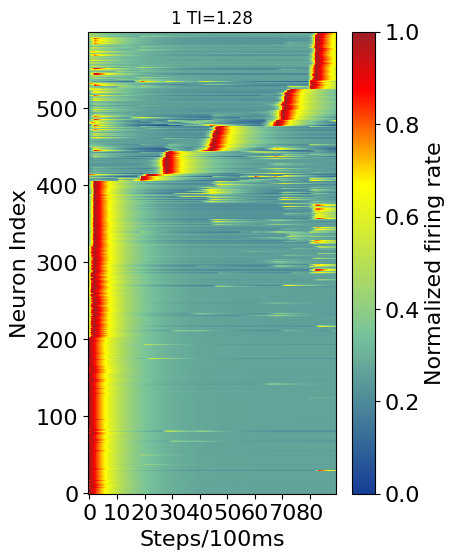

0.923 35


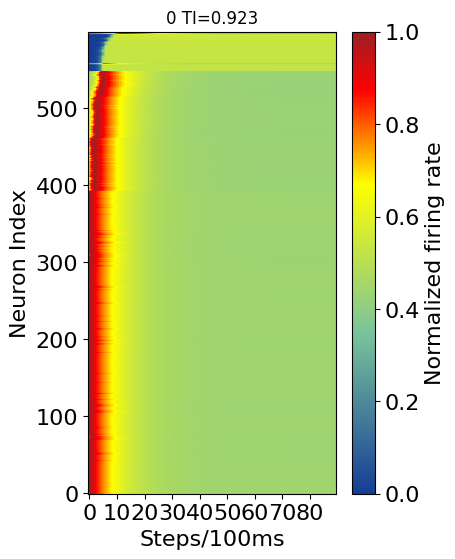

In [500]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 35
n2 = 36
width = 4
height = 6

#ANCHOR 123
#LINK - /home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v3_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_300_seed_0_lr0.001/20240126221859_model_1000.pt
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223427_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    # data0 = data0.T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
# cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_0.4_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223436_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223444_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126223451_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

### 90

#### 1

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 0
n2 = 64
width = 4
height = 6

#ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144542_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    # data0 = normalization1(data0.T)
    B_mylstm = sorting(data0.T)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
savemat('data.mat', {'tran':da})
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_0.8_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125135450_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_True_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144555_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test5_tansient_False_connection_1.0_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01/20240125144602_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0.T)
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(da, aspect='auto',cmap=cmap,vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

IndexError: index 118 is out of bounds for axis 0 with size 90

#### 2

1.54 53


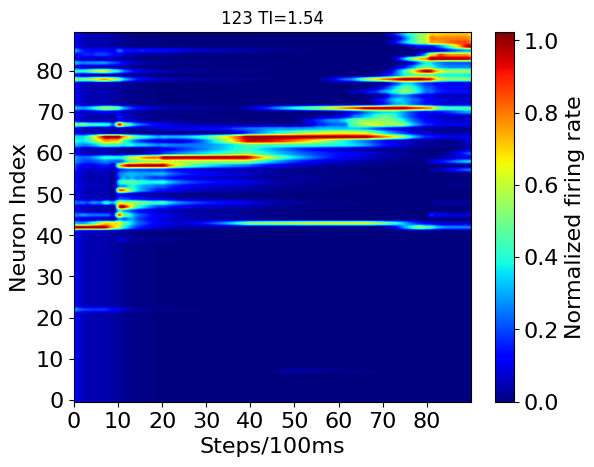

1.17 53


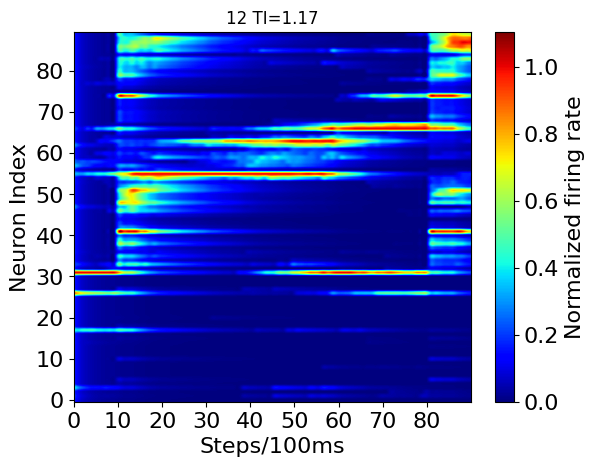

1.165 53


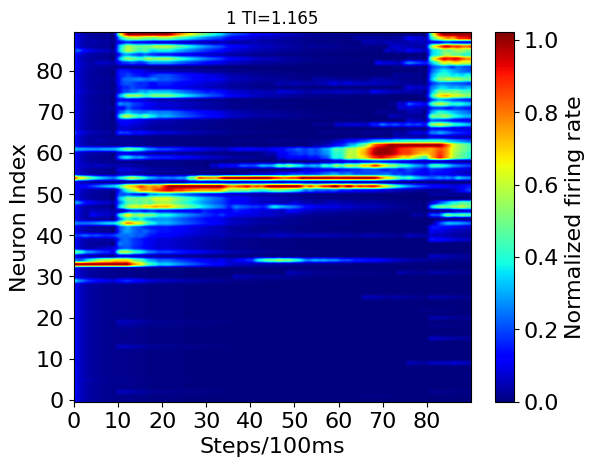

1.134 53


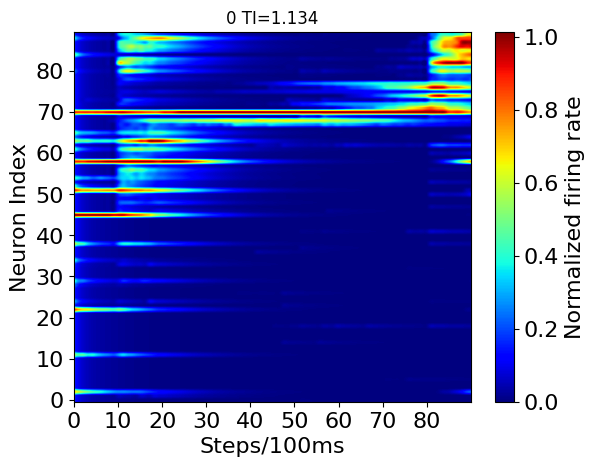

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1,n2=53,54

# ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_trnn_v1_tan_True_region_True_conn_0.8_mode_train_delay_6_hidd_90_seed_0/20240125004553_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][-1][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots()
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_trnn_v1_tan_True_region_False_conn_0.8_mode_train_delay_6_hidd_90_seed_0/20240125005347_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][-1][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots()
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_trnn_v1_tan_True_region_False_conn_1.0_mode_train_delay_6_hidd_90_seed_0/20240125005358_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][-1][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots()
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_trnn_v1_tan_False_region_False_conn_1.0_mode_train_delay_6_hidd_90_seed_0/20240125005530_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][-1][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots()
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

#### 3

1.406 1


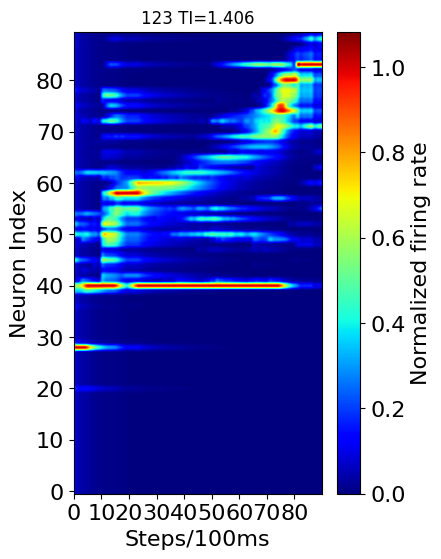

0.981 1


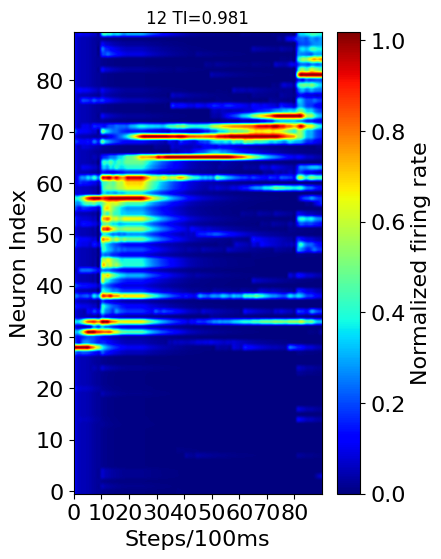

0.867 1


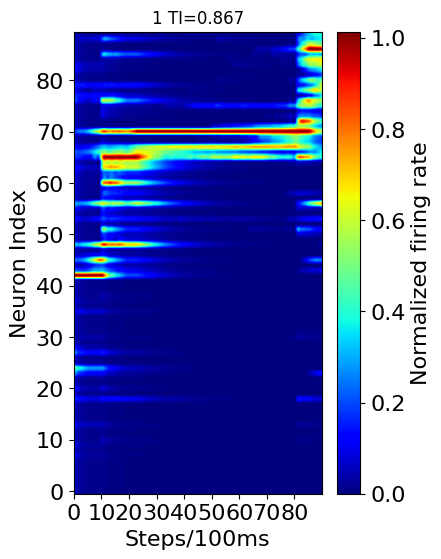

0.774 1


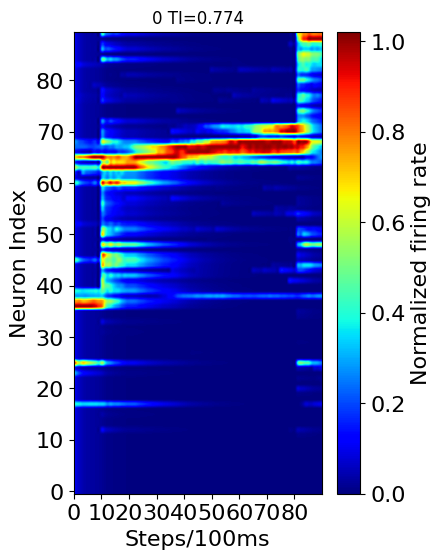

In [ ]:
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from scipy import interpolate
import torch

n1 = 1
n2 = 2
width = 4
height = 6

# ANCHOR 123
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test4_tansient_True_region_True_connection_0.7_mode_train_delay_6_hidd_90_seed_0/20240125025400_model_1000.pt" # trasient
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"123 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 12
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test4_tansient_True_region_False_connection_0.7_mode_train_delay_6_hidd_90_seed_0/20240125025353_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"12 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 1
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test4_tansient_True_region_False_connection_1.0_mode_train_delay_6_hidd_90_seed_0/20240125025122_model_1000.pt" # trasient_w_regi_conn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"1 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
# plt.title('TRNN (4 directions)', fontsize=16)#+ str(epoch) +'\n' +'ACC:' + str(acc))
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

# ANCHOR 0
netdir  = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_test4_tansient_False_region_False_connection_1.0_mode_train_delay_6_hidd_90_seed_0/20240125025339_model_1000.pt" # rnn
results = torch.load(netdir)
ti_max = 0
da = 0
index = 0
for i in range(n1,n2):
    hidden_act = results['hidden_act'][:,i,:]
    # print(hidden_act.shape)
    data0 = hidden_act
    ti = cal_TI(data0,20,80)
    data0 = normalization1(data0).T
    B_mylstm = sorting(data0)
    data0 = data0[B_mylstm,:]
    num = len(data0)
    if ti[0] > ti_max:
        da = data0.copy()
        ti_max = ti[0]
        index = i
print(ti_max, index)
x_new = np.linspace(0, 89, 900)
x = np.arange(0, 90)
datax = np.zeros((da.shape[0], 900))
for i in range(da.shape[0]):
    f = interpolate.interp1d(x, da[i], kind='cubic')
    ynew = f(x_new)
    datax[i] = ynew
fig, ax = plt.subplots(figsize=(width, height))
fig = plt.imshow(datax, aspect='auto',cmap='jet',vmin=0.)
ax.invert_yaxis()
plt.title(f"0 TI={ti_max}")
plt.xlabel('Steps/100ms', fontsize=16)
plt.ylabel('Neuron Index', fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate",fontdict={'size':16})
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=16)
plt.xticks(np.arange(0, 900, 100), np.arange(0, 90, 10), fontsize=16)
plt.yticks(fontsize=16)
plt.show()

## Proportion

### Bar

In [578]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
import copy

def sorting_2(base, a=20.5, b=50.5, c=80.5):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  
    a = np.where(np.array(loc_all_0)[B]>=a)[0]
    b = np.where(np.array(loc_all_0)[B]>=b)[0]
    c = np.where(np.array(loc_all_0)[B]>=c)[0]

    return B, np.sort(loc_all_0), (a,b,c)

from scipy.stats import entropy

def relu(inX):
    return np.maximum(0,inX)

def cal_TI(h, start=20, end=80):
    hidden_act = h
    hidden_act = hidden_act.T #600,90
    data = relu(normalization2(hidden_act).T) #90,600
    # data = relu(hidden_act.T[20:80,])
    ts = data.shape[0]  # number of time points
    entrpy_bins = end-start
    window_size = 4
    r_threshold = 0

    # selected_indx = np.nonzero(np.mean(data, axis=0) > r_threshold)[0]
    selected_indx = np.where(np.max(data, axis=0) > r_threshold)[0] # 大于平均发放率的神经元下标
    # selected_indx = np.array(selected_indx).squeeze()
    data = data[:, selected_indx]

    peak_times = np.argmax(data, axis=0) # 峰值时刻
    delay_peak_times = np.argmax(data[start:end,:], axis=0) #延迟时间 最大的发放率的下标
    index1 = np.where(data[start:end,:]>0.4) # 大于0.4的下标
    end_times = np.clip(delay_peak_times + window_size + 1, 0, ts)
    start_times = np.clip(delay_peak_times - window_size, 0, ts)
    # entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) 
    entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) # 延迟时间的能量
    entrpy_ori = entropy(np.histogram(delay_peak_times, entrpy_bins)[0], base=2)
    entrpy_max = entropy(np.ones(entrpy_bins)*data.shape[1]/entrpy_bins)
    # entrpy = entropy(np.histogram(peak_times, entrpy_bins)[0] + 0.1 * np.ones(entrpy_bins))
    r2b_ratio = np.zeros(len(selected_indx)) # 大于平均发放率的神经元比例
    trans_index = 0
    for nind in range(len(selected_indx)):
        # mask = np.zeros(ts)
        # mask[int(start_times[nind]):int(end_times[nind])] = 1
        data0 = data[start:end, nind]
        # ridge = np.mean(data0[int(start_times[nind]):int(end_times[nind])])
        ridge = np.sum(data0[start_times[nind]:end_times[nind]])
        # backgr = np.mean(np.ma.MaskedArray(data0, mask))
        backgr = np.sum(data0)
        # r2b_ratio[nind] = np.log(ridge) - np.log(backgr)
        if backgr == 0:
            r2b_ratio[nind] = 0
        else:
            r2b_ratio[nind] = ridge/backgr #* (end-start)/(end_times[nind]-start_times[nind]) # 窗口期间发放率
        trace_sum = ridge/(end_times[nind]-start_times[nind])
        trans_index += trace_sum

    trans_index /= len(selected_indx)
    entrpy = entrpy / entrpy_max
    r2b_ratio = np.nanmean(r2b_ratio)

    index1 = np.where(peak_times>=start)
    index2 = np.where(peak_times<end)
    index_delay = np.intersect1d(index1[0], index2[0]) # 延迟期间的下标
    trans_len = len(index_delay)/len(selected_indx)
    # transient_index = np.sum(data)/(60*500)
    SI_trial_vec = r2b_ratio + entrpy
    Total = SI_trial_vec + trans_len
    return round(Total, 3), entrpy_ori, entrpy, r2b_ratio, round(SI_trial_vec, 3), trans_index, trans_len

value1 = np.zeros((5, 4))
value2 = np.zeros((5, 4))
for ind in range(5):
    netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_3_hidd_600_seed_1_lr0.001/20240127042727_model_1_sample_0_match_0_theta_180_noiseh_False.pt'
    model3 = netdir
    results = torch.load(netdir)['hidden_act'][:,ind,:]
    results[60:] = 0
    hidden_act = results.T
    data0 = hidden_act
    newdata0 = data0.copy()
    data0 = normalization1(data0)
    B_mylstm, local_3, _ = sorting_2(data0)
    data0 = data0[B_mylstm,:]
    matrix1 = data0.copy()
    num = len(data0)
    B3 = B_mylstm

    netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_1_lr0.001/20240127042806_model_1_sample_0_match_0_theta_180_noiseh_False.pt'
    model6 = netdir
    results = torch.load(netdir)['hidden_act'][:,ind,:]
    results[90:] = 0
    hidden_act = results.T
    data0 = hidden_act
    newdata0 = data0.copy()
    data0 = normalization1(data0)
    B_mylstm, local_6, loc = sorting_2(data0)
    data0 = data0[B_mylstm,:]
    matrix1 = data0.copy()
    num = len(data0)
    B6 = B_mylstm

    x = np.ones((results.shape[1],10))
    # print(B3)
    BB = []
    for i in range(loc[0][0], loc[1][0]):
    #     print(np.where(B3 == B3[i]))
        BB.append(np.where(B3 == B6[i])[0])
    x[np.array(BB).T[0]] = 0

    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=0 and local_3[np.array(BB).T[0]][i]<10:
            ii+=1
    value2[ind, 0] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=10 and local_3[np.array(BB).T[0]][i]<20:
            ii+=1
    value2[ind, 1] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=20 and local_3[np.array(BB).T[0]][i]<50:
            ii+=1
    value2[ind, 2] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=50 and local_3[np.array(BB).T[0]][i]<60:
            ii+=1
    value2[ind, 3] = ii/len(local_3[np.array(BB).T[0]])

    BB = []
    for i in range(loc[1][0], loc[2][0]):
        BB.append(np.where(B3 == B6[i])[0])
    x[np.array(BB).T[0]] = 2
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=0 and local_3[np.array(BB).T[0]][i]<10:
            ii+=1
    value1[ind, 0] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=10 and local_3[np.array(BB).T[0]][i]<20:
            ii+=1
    value1[ind, 1] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=20 and local_3[np.array(BB).T[0]][i]<50:
            ii+=1
    value1[ind, 2] = ii/len(local_3[np.array(BB).T[0]])
    ii = 0
    for i in range(len(local_3[np.array(BB).T[0]])):
        if local_3[np.array(BB).T[0]][i]>=50 and local_3[np.array(BB).T[0]][i]<60:
            ii+=1
    value1[ind, 3] = ii/len(local_3[np.array(BB).T[0]])

print(value1)
print(value2)

[[0.28138528 0.04761905 0.27272727 0.3982684 ]
 [0.24358974 0.05128205 0.33760684 0.36752137]
 [0.24017467 0.05240175 0.31004367 0.39737991]
 [0.27826087 0.04347826 0.3        0.37826087]
 [0.25306122 0.05306122 0.33877551 0.35510204]]
[[0.         0.         0.953125   0.046875  ]
 [0.         0.         0.9375     0.0625    ]
 [0.         0.         0.95384615 0.04615385]
 [0.         0.         0.94827586 0.05172414]
 [0.         0.         0.94339623 0.05660377]]


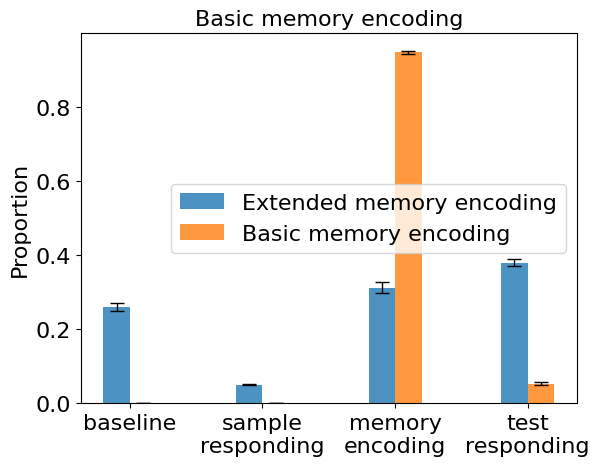

In [579]:
x = range(4)
error_params=dict(elinewidth=1,capsize=5)              

bar1 = plt.bar([i-0.1 for i in x],value1.mean(0),yerr=value1.std(0)/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C0',label = 'Extended memory encoding')

bar2 = plt.bar([i+0.1 for i in x],value2.mean(0),yerr=value2.std(0)/np.sqrt(3),error_kw=error_params,width = 0.2,
               alpha = 0.8,color = 'C1',label = 'Basic memory encoding')

# plt.ylabel('Reward',fontsize=16)       #y轴的标签
# plt.xlabel('Number of distraction', fontsize=16)  
plt.yticks(fontsize=16)
plt.xticks([0, 1, 2, 3], ['baseline', 'sample\nresponding', 'memory\nencoding', 'test\nresponding'], fontsize=16)
plt.title("Basic memory encoding", fontsize=16)
plt.ylabel("Proportion", fontsize=16)
plt.legend(fontsize=16, loc='best')            #设置图例
plt.savefig('figure/fig3b1.svg')
plt.show()

### TI

(90, 600)
(1.602, 2.7784349929359973, 0.6946087482339993, 0.8022905042270819, 1.497, 0.27860265469917744, 0.105)


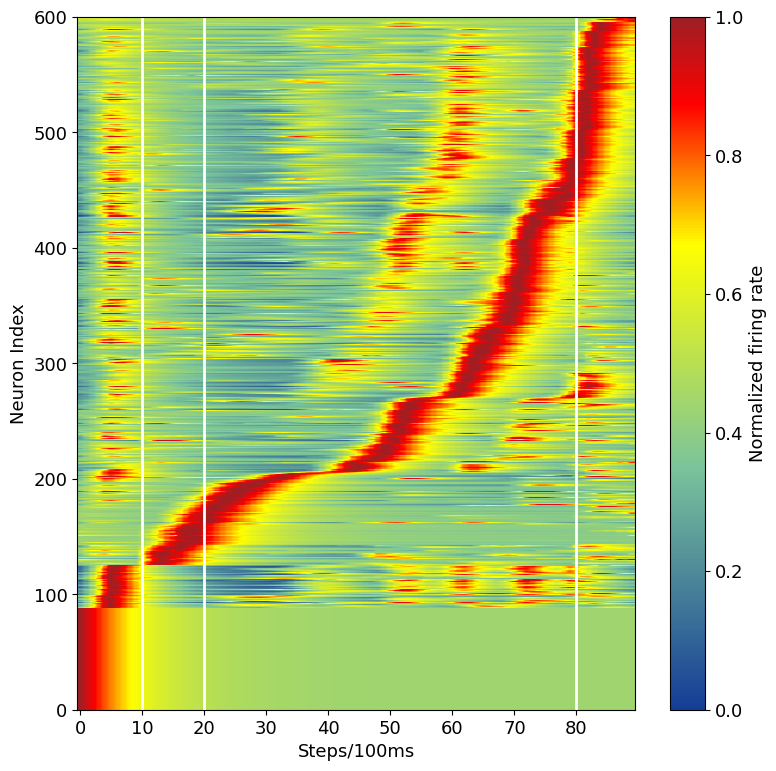

(60, 600)
(1.81, 2.7559842967363757, 0.6889960741840939, 0.7975265875458717, 1.487, 0.3775860441425317, 0.3233333333333333)


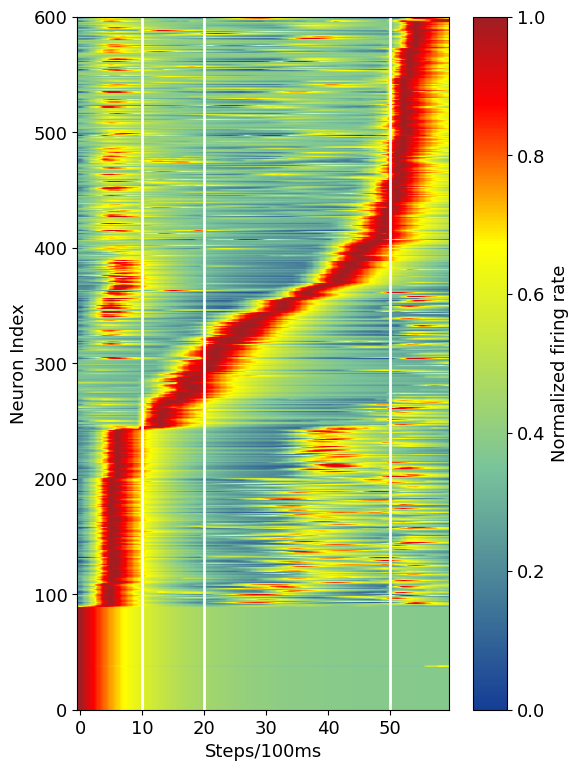

(70, 600)
(1.689, 2.751516114458759, 0.6878790286146897, 0.8090991760293643, 1.497, 0.3268961383059533, 0.19166666666666668)


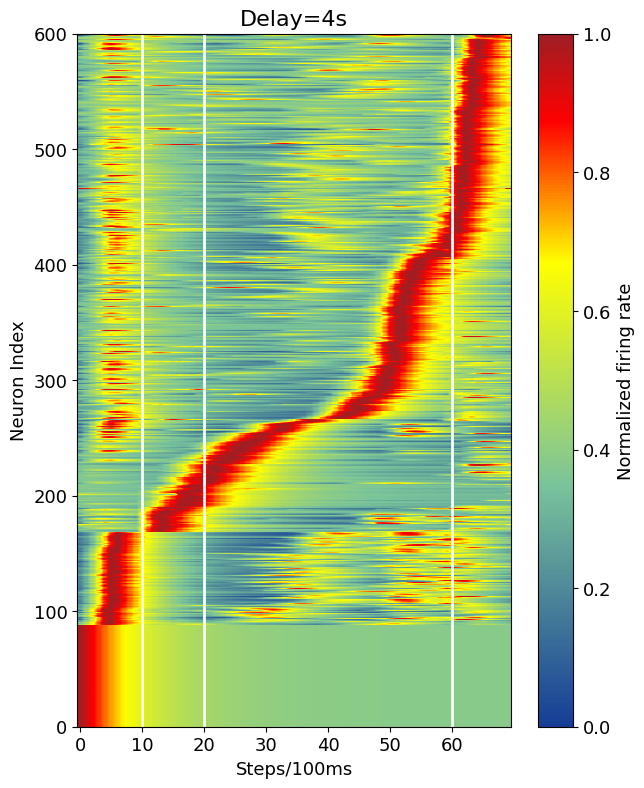

(80, 600)
(1.65, 2.7295726214752865, 0.6823931553688216, 0.7895429611206055, 1.472, 0.3099726609623425, 0.17833333333333334)


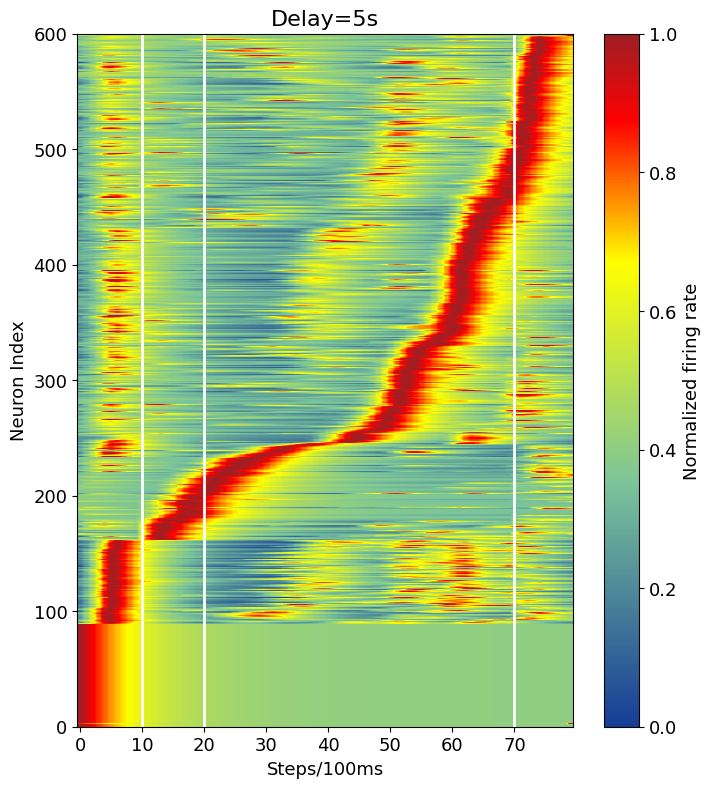

[162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225]
[226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243
 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261
 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279
 280 281 282 283 284 285 286 287 288 289 290 291 292 293 294 295 296 297
 298 299 300 301 302 303 304 305 306 307 308 309 310 311 312 313 314 315
 316 317 318 319 320 321 322 323 324 325 326 327 328 329 330 331 332 333
 334 335 336 337 338 339 340 341 342 343 344 345 346 347 348 349 350 351
 352 353 354 355 356 357 358 359 360 361 362 363 364 365 366 367 368 369
 370 371 372 373 374 375 376 377 378 379 380 381 382 383 384 385 386 387
 388 389 390 391 392 393 394 395 396 397 398 399 400 401 402 403 404 405
 406 407 

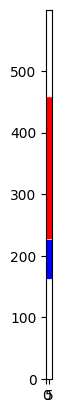

[294 293 295 297 296 298 299 302 301 300 306 309 310 303 585 311 312 315
 313 317 321 322 320 318 575 324 323 328 326 330 329 334 333 331 335 338
 342 343 347 346 350 351 355 360 376 384 386 396 390 391 395 394 393 401
 404 405 419 447 408 426 420 425 417 409]
0-10: 0.0
10-20: 0.0
20-50: 0.953125
50-60: 0.046875
[421 439 423 416 442 470 446 543 432 451 429 477 434 438 463 444 467 493
 441 458 517 533 475 519 472 507 552 139 361 520 503 440 483 511 110 549
 548 565 551 508 473 325 316 120 304 218 143 220 354 279 241 232 378 236
 229 362 592 437 375 161 385 377 392 225 206 372 374 243 387 370 369 383
 368 388 221 234 379 371 291 160 319 407 270 402 332 314 381 399 599 308
 403 305 159 199  90 183 307 389 400 337 200 189 398 196 261 115 412 197
 274 264 122 427 132 476 450 422 406 142 424 397 181 129 418 486 191 415
  92 231 133 201 410 460 454 172 251 428 457 515  97 480 413 466 452 449
 542 453 468 258 411 445 513 465 495 490 506 130 363 510 186 512 240 179
 137 485 345 217 524 464 491 

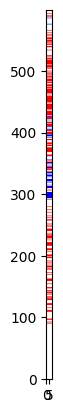

In [580]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
import copy

def sorting_2(base, a=20.5, b=50.5, c=80.5):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  
    a = np.where(np.array(loc_all_0)[B]>=a)[0]
    b = np.where(np.array(loc_all_0)[B]>=b)[0]
    c = np.where(np.array(loc_all_0)[B]>=c)[0]

    return B, np.sort(loc_all_0), (a,b,c)

netdir  = model6
results = torch.load(netdir)['hidden_act'][:,0,:]
results[90:] = 0
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_6, loc = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)
B6 = B_mylstm
fig, ax = plt.subplots(1, 1, figsize=(9,9))
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=80,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
# plt.title('Neural activity in trail TI={}'.format(TI))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,results.shape[1])
plt.savefig('figure/fig3a2.svg')
plt.show()

netdir  = model3
results = torch.load(netdir)['hidden_act'][:,0,:]
results[60:] = 0
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_3, _ = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)
B3 = B_mylstm
fig, ax = plt.subplots(1, 1, figsize=(6,9))
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
# plt.title('Neural activity in trail TI={}'.format(TI))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,results.shape[1])
plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_4_hidd_600_seed_1_lr0.001/20240127040955_model_1_sample_0_match_0_theta_180_noiseh_False.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
results[70:] = 0
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_4, _ = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)
fig, ax = plt.subplots(1, 1, figsize=(7,9))
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=60,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
# plt.title('Neural activity in trail TI={}'.format(TI))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,results.shape[1])
plt.title("Delay=4s",fontsize=16)
plt.savefig('figure/suppfig2a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_5_hidd_600_seed_1_lr0.001/20240127041008_model_1_sample_0_match_0_theta_180_noiseh_False.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
results[80:] = 0
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_5, _ = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)
fig, ax = plt.subplots(1, 1, figsize=(8,9))
fig=plt.imshow(data0, aspect='auto',cmap=cmap)
plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
plt.vlines(x=70,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
# plt.title('Neural activity in trail TI={}'.format(TI))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.title("Delay=5s",fontsize=16)
plt.ylim(0,results.shape[1])
plt.savefig('figure/suppfig2a2.svg')
plt.show()


fig, ax = plt.subplots(1, 1)
x = np.ones((results.shape[1],10))
# print(B3)
BB = []
for i in range(loc[0][0], loc[1][0]):
#     print(np.where(B3 == B3[i]))
    BB.append(np.where(B6 == B6[i])[0])
print(np.array(BB).T[0])
x[np.array(BB).T[0]] = 0
BB = []
for i in range(loc[1][0], loc[2][0]):
#     print(np.where(B3 == B3[i]))
    BB.append(np.where(B6 == B6[i])[0])
print(np.array(BB).T[0])
x[np.array(BB).T[0]] = 2
print(local_6[np.array(BB).T[0]])
plt.imshow(x,cmap='bwr')
ax.invert_yaxis()
plt.xticks()
plt.show()

fig, ax = plt.subplots(1, 1)
x = np.ones((results.shape[1],10))
# print(B3)
BB = []
for i in range(loc[0][0], loc[1][0]):
#     print(np.where(B3 == B3[i]))
    BB.append(np.where(B3 == B6[i])[0])
print(np.array(BB).T[0])
x[np.array(BB).T[0]] = 0

ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=0 and local_3[np.array(BB).T[0]][i]<10:
        ii+=1
print('0-10:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=10 and local_3[np.array(BB).T[0]][i]<20:
        ii+=1
print('10-20:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=20 and local_3[np.array(BB).T[0]][i]<50:
        ii+=1
print('20-50:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=50 and local_3[np.array(BB).T[0]][i]<60:
        ii+=1
print('50-60:', ii/len(local_3[np.array(BB).T[0]]))

BB = []
for i in range(loc[1][0], loc[2][0]):
#     print(np.where(B3 == B3[i]))
    BB.append(np.where(B3 == B6[i])[0])
print(np.array(BB).T[0])
x[np.array(BB).T[0]] = 2
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=0 and local_3[np.array(BB).T[0]][i]<10:
        ii+=1
print('0-10:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=10 and local_3[np.array(BB).T[0]][i]<20:
        ii+=1
print('10-20:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=20 and local_3[np.array(BB).T[0]][i]<50:
        ii+=1
print('20-50:', ii/len(local_3[np.array(BB).T[0]]))
ii = 0
for i in range(len(local_3[np.array(BB).T[0]])):
    if local_3[np.array(BB).T[0]][i]>=50 and local_3[np.array(BB).T[0]][i]<60:
        ii+=1
print('50-60:', ii/len(local_3[np.array(BB).T[0]]))
plt.imshow(x,cmap='bwr')
ax.invert_yaxis()
plt.xticks()
plt.show()

### Number of neurons

(600, 90)
(600, 90)
(600, 90)
(600, 90)


(600, 90)
(600, 90)
(600, 90)
(600, 90)
(600, 90)
(600, 90)


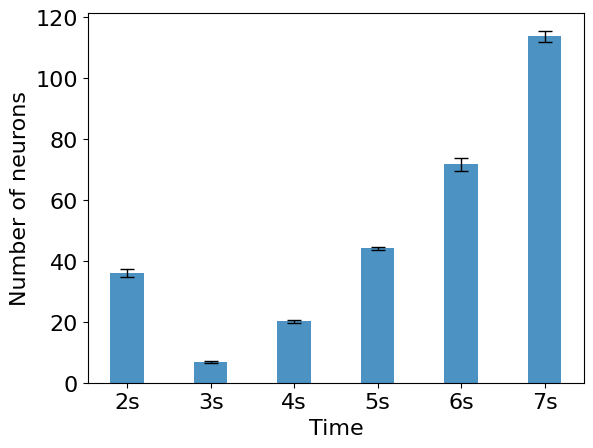

In [585]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
import copy

def sorting_3(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  
#     print(np.where(np.array(loc_all_0)[B]==20.5))
#     print(np.where(np.array(loc_all_0)[B]==50.5))
#     print(np.where(np.array(loc_all_0)[B]==80.5))
    global AA, KK
    for i in KK:
        AA.append(np.where(np.array(loc_all_0)[B]>=i)[0][0])
    return B, np.sort(loc_all_0)

Value = np.zeros((10,6))
for cc in range(10,20):
    AA = []
    KK = [20,30,40,50,60,70,80]
    netdir  = model6
    results = torch.load(netdir)['hidden_act'][:,cc,:]
    results[90:] = 0
    hidden_act = results.T
    print(hidden_act.shape)
    data0 = hidden_act
    # print(cal_TI(data0,1,17))
    # TI = cal_TI(data0,1,17)[0]
    newdata0 = data0.copy()
    data0 = normalization1(data0)
    B_mylstm, local_6 = sorting_3(data0)
    data0 = data0[B_mylstm,:]
    matrix1 = data0.copy()
    num = len(data0)
    B6 = B_mylstm

    # print(B3)
    value = []
    for s in range(6):
        BB = []
        for i in range(AA[s],AA[s+1]):
        #     print(np.where(B3 == B3[i]))
            BB.append(np.where(B6 == B6[i])[0])
        # print(np.array(BB).T[0],local_6,AA)
        ii = 0
        for i in range(len(local_6[np.array(BB).T[0]])):
            if local_6[np.array(BB).T[0]][i]>=KK[s] and local_6[np.array(BB).T[0]][i]<KK[s+1]:
                ii+=1
        value.append(ii)
    Value[cc-10] = value

error_params=dict(elinewidth=1,capsize=5)
plt.bar([i for i in range(len(value))],Value.mean(0),yerr=Value.std(0)/np.sqrt(Value.shape[0]),error_kw=error_params,width = 0.4, alpha = 0.8,color = 'C0')
# plt.ylabel('Reward',fontsize=16)       #y轴的标签
# plt.xlabel('Number of distraction', fontsize=16)  
plt.yticks(fontsize=16)
plt.xticks(range(len(value)), ['2s', '3s', '4s', '5s', '6s', '7s'], fontsize=16)
# plt.title("Extended memory encoding", fontsize=18)
plt.ylabel("Number of neurons",fontsize=16)
plt.xlabel("Time",fontsize=16)
# # plt.legend(fontsize=16)            #设置图例
plt.savefig('figure/suppfig2b.svg')
plt.show()

### Log likehood

[1.000000e-05 1.000000e-05 1.000000e-05 1.000000e-05 1.562500e-03
 9.093750e-01 9.562500e-01 9.953125e-01 9.999900e-01 9.999900e-01]
 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 44.988138164578736
       x: [ 9.331e+01  4.413e+00]
     nit: 4
   direc: [[ 0.000e+00  1.000e+00]
           [ 1.898e-02 -2.206e-03]]
    nfev: 96
L: -60.64473483445959


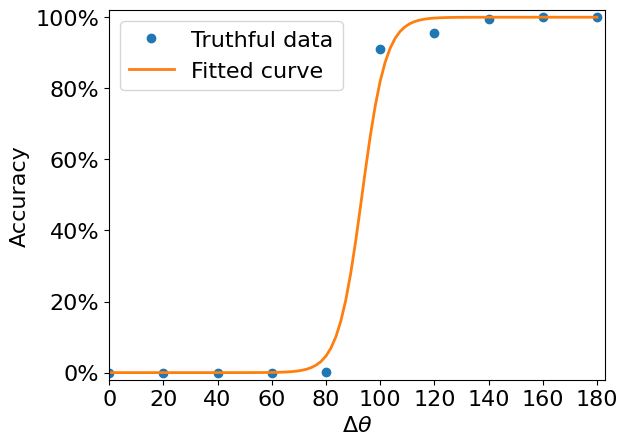

In [587]:
# delay=6s
from matplotlib import ticker
from scipy.optimize import minimize
from scipy.optimize import fmin
import scipy.optimize as opt
from matplotlib.ticker import FuncFormatter

y = np.zeros(10)
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_loglikehood_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_1_lr0.001'
files = get_files_in_folder(netdir)
for file in files:
    if file[-3:] == '.pt':
        index = int(file.split('_theta_')[1].split('_')[0]) // 20
        y[index] = torch.load(file)['accuracy'][0] 
        if torch.load(file)['accuracy'][0] == 0:
            y[index] = 1e-5
        if torch.load(file)['accuracy'][0] == 1:
            y[index] = 1 - 1e-5

print(y)

fig, ax = plt.subplots()
x = [0,20,40,60,80,100,120,140,160,180]
plt.plot(x, y, marker='o',linestyle=' ',label="Truthful data")
plt.ylim([0,1])

n = 64
I = np.array([0,20,40,60,80,100,120,140,160,180])
R = y * n
def fun(x):
    m=x[0]
    s=x[1]
    L=0
    for num in range(I.shape[0]):
        r=R[num]
        i=I[num]
        P_I = np.exp((i-m)/s)/(1+np.exp((i-m)/s))
        L+=r*np.log(P_I+1e-5)+(n-r)*np.log(1-P_I+2e-5)
    return -1 * L

def fun2(x):
    m=x[0]
    s=x[1]
    L=1
    for num in range(I.shape[0]):
        r=R[num]
        i=I[num]
        P_I = np.exp((i-m)/s)/(1+np.exp((i-m)/s))
        L=L*P_I
    return np.log(L)

def funI(I,m=1,s=1):
    P_I = np.exp((I-m)/s)/(1+np.exp((I-m)/s))
    return P_I

res = minimize(fun, np.array([180, 180]),method = 'Powell')
# res = opt.fmin(fun,np.array([1,1]))
print(res)
print("L:",fun2(res.x))
x = np.linspace(0,180,100)
y = funI(x,res.x[0],res.x[1])
plt.plot(x,y,linewidth=2,label='Fitted curve')
plt.xlim([0,183])
plt.ylim([-0.02, 1.02])
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
ax.yaxis.set_major_formatter(FuncFormatter(lambda x,_:'{:.0f}%'.format(x*100)))
plt.xticks([0,20,40,60,80,100,120,140,160,180],fontsize=16)
plt.ylabel('Accuracy',fontsize=16)
plt.xlabel('$\Delta \\theta$', fontsize=16)
plt.savefig('figure/suppfig1c.svg')
plt.show()

## $\Delta \theta$

In [593]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
import copy

def sorting_4(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0) 
    global A1,B1,C1
    A1 = np.where(np.array(loc_all_0)[B]>=10.5)
    B1 = np.where(np.array(loc_all_0)[B]>=20.5)
    C1 = np.where(np.array(loc_all_0)[B]>=80.5)
    return B, np.sort(loc_all_0)

def relu(inX):
    return np.maximum(0,inX)

y = {}
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_loglikehood_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_1_lr0.001'
files = get_files_in_folder(netdir)
for file in files:
    if file[-3:] == '.pt':
        index = int(file.split('_theta_')[1].split('_')[0]) // 20
        y[index] = torch.load(file)['hidden_act'][:,ind,:]

x = np.zeros((5,10))
for ind in range(0,5):
    oo = {}
    netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_loglikehood_tansient_True_connection_0.4_region_True_mode_test_delay_6_hidd_600_seed_1_lr0.001'
    files = get_files_in_folder(netdir)
    for file in files:
        if file[-3:] == '.pt':
            index = int(file.split('_theta_')[1].split('_')[0]) // 20
            oo[index] = torch.load(file)['hidden_act'][:,ind,:]
    for theta in range(10):
        A1,B1,C1=0,0,0
        results = oo[0]
        results[90:] = 0
        hidden_act = results
        data0 = hidden_act
        # print(cal_TI(data0,1,17))
        TI = cal_TI(data0,1,17)[0]
        newdata0 = data0.copy()
        data0 = normalization1(data0.T)
        B_mylstm, local_3 = sorting_4(data0)
        data0 = data0[B_mylstm,:]
        matrix1 = data0.copy()
        num = len(data0)
        B3 = B_mylstm

        results = oo[theta]
        results[90:] = 0
        hidden_act = results
        data0 = hidden_act
        # print(cal_TI(data0,1,17))
        TI = cal_TI(data0,1,17)[0]
        newdata0 = data0.copy()
        data0 = normalization1(data0.T)
        B_mylstm, local_6 = sorting_4(data0)
        data0 = data0[B_mylstm,:]
        matrix1 = data0.copy()
        num = len(data0)
        B6 = B_mylstm

        a = A1[0][0]
        b = B1[0][0]
        c = C1[0][0]

        y = []
        BB = []
        for i in range(0,a):
        #     print(np.where(B3 == B3[i]))
            BB.append(np.where(B3 == B6[i])[0])
        ii = 0
        for i in range(len(local_3[np.array(BB).T[0]])):
            if local_3[np.array(BB).T[0]][i]>=0 and local_3[np.array(BB).T[0]][i]<10:
                ii+=1
        y.append(ii/len(local_3[np.array(BB).T[0]]))

        BB = []
        for i in range(a,b):
        #     print(np.where(B3 == B3[i]))
            BB.append(np.where(B3 == B6[i])[0])
        ii = 0
        for i in range(len(local_3[np.array(BB).T[0]])):
            if local_3[np.array(BB).T[0]][i]>=10 and local_3[np.array(BB).T[0]][i]<20:
                ii+=1
        y.append(ii/len(local_3[np.array(BB).T[0]]))

        BB = []
        for i in range(b,c):
        #     print(np.where(B3 == B3[i]))
            BB.append(np.where(B3 == B6[i])[0])
        ii = 0
        for i in range(len(local_3[np.array(BB).T[0]])):
            if local_3[np.array(BB).T[0]][i]>=20 and local_3[np.array(BB).T[0]][i]<80:
                ii+=1
        y.append(ii/len(local_3[np.array(BB).T[0]]))

        BB = []
        for i in range(c,600):
        #     print(np.where(B3 == B3[i]))
            BB.append(np.where(B3 == B6[i])[0])
        ii = 0
        for i in range(len(local_3[np.array(BB).T[0]])):
            if local_3[np.array(BB).T[0]][i]>=80 and local_3[np.array(BB).T[0]][i]<90:
                ii+=1
        y.append(ii/len(local_3[np.array(BB).T[0]]))

        x[ind, theta] = np.array(y).mean()
print(x)

[[1.         0.95382898 0.90363797 0.86070017 0.83508169 0.8061395
  0.8014997  0.75631957 0.73242328 0.70672304]
 [1.         0.93515178 0.86595396 0.83229787 0.77162277 0.73552033
  0.72417595 0.68177149 0.66146372 0.64429252]
 [1.         0.89544689 0.84748508 0.82800665 0.7960222  0.75346421
  0.75220609 0.72085297 0.69445903 0.6868852 ]
 [1.         0.9646679  0.91230845 0.87728428 0.84294609 0.82184594
  0.79798107 0.78935365 0.77911437 0.76517032]
 [1.         0.93222265 0.8878878  0.88769695 0.86039226 0.81027144
  0.79980674 0.79501523 0.76912256 0.76065727]]


(5, 10) [0 1 2 3 4 5 6 7 8 9]
[-0.03032626  0.96121173]


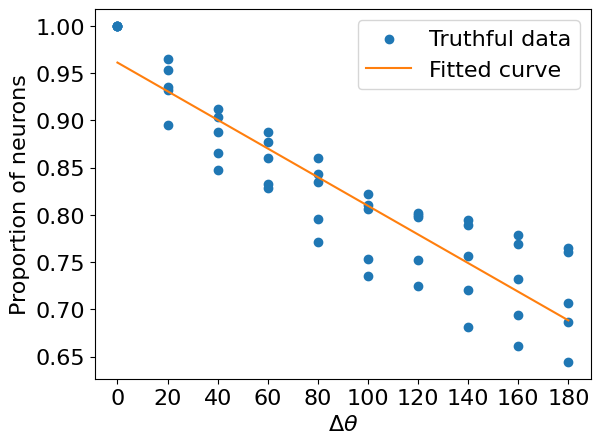

In [601]:
from scipy.interpolate import interp1d

cubic_interploation_model=interp1d(np.arange(10),x.mean(0),kind="cubic")
xs=np.linspace(0,9,500)
ys=cubic_interploation_model(xs)

print(x.shape, np.arange(10))
poly = np.polyfit(np.arange(10),x.mean(0),deg=1)
print(poly)
y_value = np.polyval(poly,np.arange(10))

for i in range(4):
    plt.scatter(np.arange(10), x[i], color='C0')
plt.scatter(np.arange(10), x[4],color='C0',label="Truthful data")
# plt.plot(xs,ys,color='C1')
plt.plot(np.arange(10),y_value,color='C1',label='Fitted curve')
plt.xticks(np.arange(10),[0,20,40,60,80,100,120,140,160,180],fontsize=16)
plt.yticks(fontsize=16)
# plt.ylim([0.9,1.01])
plt.legend(fontsize=16)
plt.xlabel('$\Delta \\theta$',fontsize=16)
plt.ylabel('Proportion of neurons',fontsize=16)
plt.savefig('figure/suppfig2c.svg')
plt.show()

## Acc

In [ ]:
def acc(netdir):
    results = pickle.load(open(netdir, 'rb'))
    accuracy = np.array(results['accuracy']).max()
    print(accuracy)
netdir = "/home/jiashuncheng/code/Trasient/ODPA/savedir/6new_delay3s.pkl.pkl"
acc1 = acc(netdir)
netdir = "/home/jiashuncheng/code/Trasient/ODPA/savedir/6new_delay3s.pkl.pkl"
acc2 = acc(netdir)
netdir = "/home/jiashuncheng/code/Trasient/ODPA/savedir/6new_delay3s.pkl.pkl"
acc3 = acc(netdir)

acc1 = 0.9859
acc2 = 0.9828
acc3 = 0.9953
ACC = np.array([acc1,acc2,acc3]).mean()
STD = np.array([acc1,acc2,acc3]).std()
print(ACC, STD)

1.0
1.0
1.0
0.988 0.0053147593234940055


## Hidden weight

### Weight

In [566]:
def sorting_2(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  

    return B, np.sort(loc_all_0)

(60, 600)
(1.659, 2.0237137845339497, 0.5059284461334874, 0.7596015414595604, 1.266, 0.4247812850132027, 0.3933333333333333)
比例: 0.9258027777777778
-2.6120672


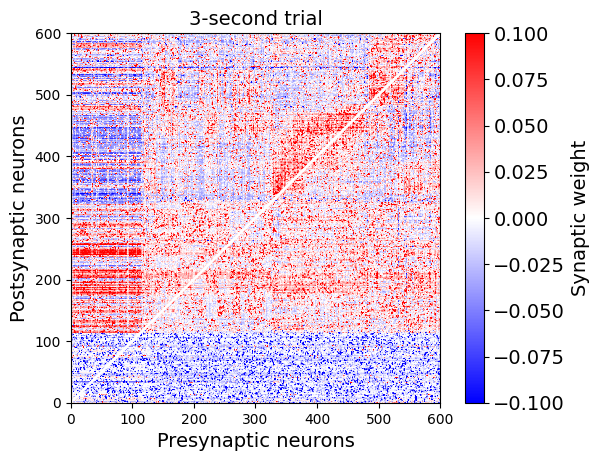

(1000, 500)
(1000, 500)


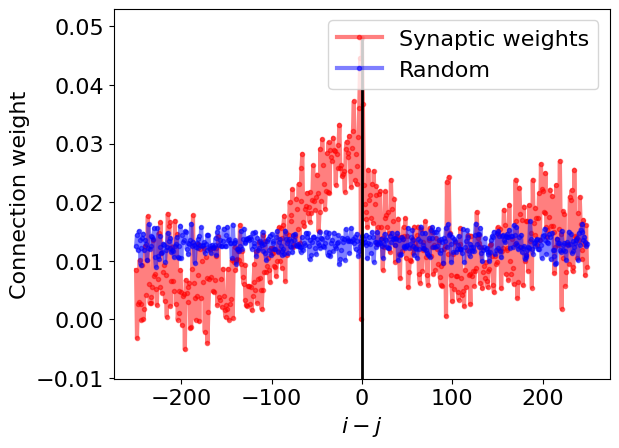

In [567]:
path = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_3_hidd_600_seed_1_lr0.001/20240127031738_model_params_step1000.pth"
model_param = torch.load(path)
w_out = model_param["w_out"].detach().cpu().numpy()
b_out = model_param["b_out"].detach().cpu().numpy()
w_hidden = model_param["w_rnn"].detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_3_hidd_600_seed_1_lr0.001/20240127031738_model_1000.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
temp = np.zeros((90,3))
for i in range(results.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out + b_out)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_3 = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)

new_matrix = w_hidden[B_mylstm, :]
new_matrix = new_matrix[:, B_mylstm]
# print(new_matrix)
aaa = np.zeros_like(new_matrix)
aaa[np.logical_and(new_matrix<=0.1, new_matrix>=-0.1)] = 1
print("比例:",sum(sum(aaa))/aaa.shape[0]/aaa.shape[1])
data0 = new_matrix.T
# data0[np.where(data0>=0)] = 1 * data0[np.where(data0>=0)]/data0[np.where(data0>=0)].max()
# data0[np.where(data0<0)] = -1 * data0[np.where(data0<0)]/data0[np.where(data0<0)].min()
# plt.imshow(data0,cmap='bwr')#,vmin=-0.1,vmax=0.1,cmap='YlOrRd')
savemat('data.mat', {'tran':data0})
print(data0.min())
# data0 = (data0 - data0.min())/(data0.max() - data0.min())
plt.imshow(data0,cmap='bwr',vmin=-0.1, vmax=0.1)
cb = plt.colorbar()
# cb.set_ticks([-0.1,0,0.1])
cb.ax.tick_params(labelsize=14)
cb.set_label('Synaptic weight', font={'size':14})
plt.plot([0,600],[0,600],color='white',linewidth=2)
# plt.yticks([0,200,400,600],fontsize=14)
# plt.xticks([0,200,400,600],fontsize=14)
plt.ylabel('Postsynaptic neurons', fontsize=14)
plt.xlabel('Presynaptic neurons',fontsize=14)
plt.gca().invert_yaxis()
plt.title('3-second trial', fontsize=14)
plt.ylim([0,600])
plt.xlim([0,600])
plt.savefig('figure/fige2.svg')
plt.show()

full = 600
sub = 100
new_full = full - sub

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = new_matrix.T[sub:,sub:]
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1], color='r', alpha=0.5, marker='.', label='Synaptic weights', linewidth=3)
old = x.copy()

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = 0.1 * (np.random.rand(new_full,new_full) -0.5) + np.nanmean(old, axis=0)[::-1].mean()
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1],color='b', alpha=0.5, marker='.', label='Random', linewidth=3)
plt.vlines(x=0,ymin=-1,ymax=np.nanmean(old, axis=0)[::-1][new_full//2], color='k', linewidth=2)
plt.ylim([np.nanmean(old, axis=0)[::-1].min()-0.005,np.nanmean(old, axis=0)[::-1].max()+0.005])
plt.ylabel('Connection weight',fontsize=16)
plt.xlabel('$i-j$',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/suppfig2e.svg')
plt.show()

(90, 600)
(1.468, 1.53983033340672, 0.38495758335168, 0.764997199823459, 1.15, 0.40906682512845466, 0.31833333333333336)
比例: 0.9294444444444444
-2.590498


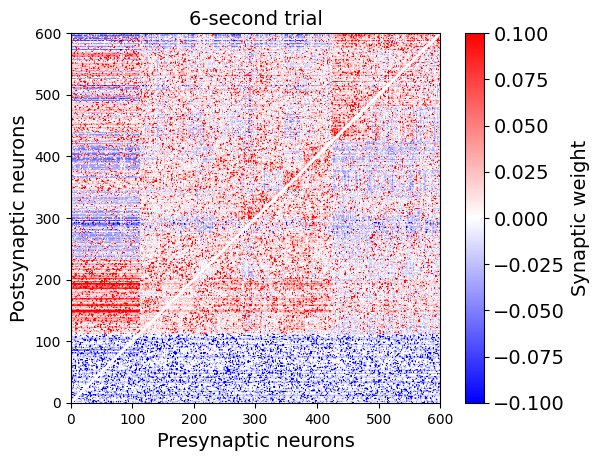

(1000, 500)
(1000, 500)


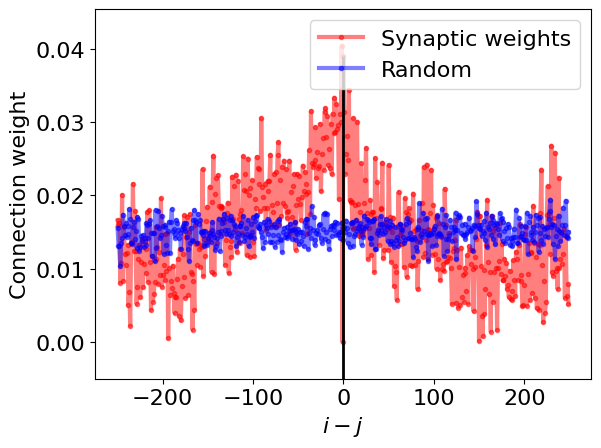

In [568]:
path = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030642_model_params_step1000.pth"
model_param = torch.load(path)
w_out = model_param["w_out"].detach().cpu().numpy()
b_out = model_param["b_out"].detach().cpu().numpy()
w_hidden = model_param["w_rnn"].detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_train_delay_6_hidd_600_seed_1_lr0.001/20240127030642_model_1000.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
temp = np.zeros((90,3))
for i in range(results.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out + b_out)
hidden_act = results
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0.T)
B_mylstm, local_3 = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)

new_matrix = w_hidden[B_mylstm, :]
new_matrix = new_matrix[:, B_mylstm]
# print(new_matrix)
aaa = np.zeros_like(new_matrix)
aaa[np.logical_and(new_matrix<=0.1, new_matrix>=-0.1)] = 1
print("比例:",sum(sum(aaa))/aaa.shape[0]/aaa.shape[1])
data0 = new_matrix.T
# data0[np.where(data0>=0)] = 1 * data0[np.where(data0>=0)]/data0[np.where(data0>=0)].max()
# data0[np.where(data0<0)] = -1 * data0[np.where(data0<0)]/data0[np.where(data0<0)].min()
# plt.imshow(data0,cmap='bwr')#,vmin=-0.1,vmax=0.1,cmap='YlOrRd')
savemat('data.mat', {'tran':data0})
print(data0.min())
# data0 = (data0 - data0.min())/(data0.max() - data0.min())
plt.imshow(data0,cmap='bwr',vmin=-0.1, vmax=0.1)
cb = plt.colorbar()
# cb.set_ticks([-0.1,0,0.1])
cb.ax.tick_params(labelsize=14)
cb.set_label('Synaptic weight', font={'size':14})
plt.plot([0,600],[0,600],color='white',linewidth=2)
# plt.yticks([0,200,400,600],fontsize=14)
# plt.xticks([0,200,400,600],fontsize=14)
plt.ylabel('Postsynaptic neurons', fontsize=14)
plt.xlabel('Presynaptic neurons',fontsize=14)
plt.gca().invert_yaxis()
plt.title('6-second trial', fontsize=14)
plt.ylim([0,600])
plt.xlim([0,600])
plt.savefig('figure/fige2.svg')
plt.show()

full = 600
sub = 100
new_full = full - sub

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = new_matrix.T[sub:,sub:]
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1], color='r', alpha=0.5, marker='.', label='Synaptic weights', linewidth=3)
old = x.copy()

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = 0.1 * (np.random.rand(new_full,new_full) -0.5) + np.nanmean(old, axis=0)[::-1].mean()
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1],color='b', alpha=0.5, marker='.', label='Random', linewidth=3)
plt.vlines(x=0,ymin=-1,ymax=np.nanmean(old, axis=0)[::-1][new_full//2], color='k', linewidth=2)
plt.ylim([np.nanmean(old, axis=0)[::-1].min()-0.005,np.nanmean(old, axis=0)[::-1].max()+0.005])
plt.ylabel('Connection weight',fontsize=16)
plt.xlabel('$i-j$',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/suppfig2e.svg')
plt.show()

(120, 60)
(1.195, 2.1217334075813383, 0.5304333518953346, 0.6648457705974579, 1.195, 0.07981817471380863, 0.0)
6.8160477 0.00017970077
比例: 0.583125


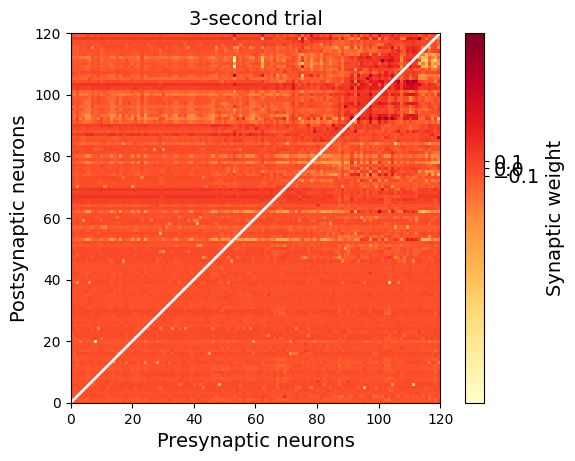

FileNotFoundError: [Errno 2] No such file or directory: '/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240126/exp_v2_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126204126_model_params_step1001.pth'

In [ ]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def normalization1(data):
#     data = data - np.mean(data, axis=1)[:,np.newaxis]
    print(data.max(), data.min())
    data = data - np.min(data)#, axis=1)[:,np.newaxis]
    data = data/(np.max(np.abs(data), axis=1)[:,np.newaxis]+0.00001)
    return data

def normalization2(data):
    data = data - np.mean(data, axis=1)[:,np.newaxis]
    data = data/(np.max(np.abs(data), axis=1)[:,np.newaxis]+0.00001)
    return data


def mean_var(A):
    mean = np.mean(A)
    var = np.var(A)
    std = np.std(A)
    return mean, var, std

def c_mass(data):
    interval = 5
    mass_max = 0
    mass_loc = 0
    for i in range(len(data)-interval):
        if np.sum(data[i:i+interval]) > mass_max:
            mass_max = np.sum(data[i:i+interval])
            mass_loc = i + interval/2
    return (mass_loc, mass_max)

def sorting_2(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  

    return B, np.sort(loc_all_0)

from scipy.stats import entropy

def relu(inX):
    return np.maximum(0,inX)

def cal_TI(h, start=20, end=80):
    hidden_act = h
    hidden_act = hidden_act.T #600,90
    data = relu(normalization2(hidden_act).T) #90,600
    # data = relu(hidden_act.T[20:80,])
    ts = data.shape[0]  # number of time points
    entrpy_bins = end-start
    window_size = 1
    r_threshold = 0

    # selected_indx = np.nonzero(np.mean(data, axis=0) > r_threshold)[0]
    selected_indx = np.where(np.max(data, axis=0) > r_threshold)[0] # 大于平均发放率的神经元下标
    # selected_indx = np.array(selected_indx).squeeze()
    data = data[:, selected_indx]

    peak_times = np.argmax(data, axis=0) # 峰值时刻
    delay_peak_times = np.argmax(data[start:end,:], axis=0) #延迟时间 最大的发放率的下标
    index1 = np.where(data[start:end,:]>0.4) # 大于0.4的下标
    end_times = np.clip(delay_peak_times + window_size + 1, 0, ts)
    start_times = np.clip(delay_peak_times - window_size, 0, ts)
    # entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) 
    entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) # 延迟时间的能量
    entrpy_ori = entropy(np.histogram(delay_peak_times, entrpy_bins)[0], base=2)
    entrpy_max = entropy(np.ones(entrpy_bins)*data.shape[1]/entrpy_bins)
    # entrpy = entropy(np.histogram(peak_times, entrpy_bins)[0] + 0.1 * np.ones(entrpy_bins))
    r2b_ratio = np.zeros(len(selected_indx)) # 大于平均发放率的神经元比例
    trans_index = 0
    for nind in range(len(selected_indx)):
        # mask = np.zeros(ts)
        # mask[int(start_times[nind]):int(end_times[nind])] = 1
        data0 = data[start:end, nind]
        # ridge = np.mean(data0[int(start_times[nind]):int(end_times[nind])])
        ridge = np.sum(data0[start_times[nind]:end_times[nind]])
        # backgr = np.mean(np.ma.MaskedArray(data0, mask))
        backgr = np.sum(data0)
        # r2b_ratio[nind] = np.log(ridge) - np.log(backgr)
        if backgr == 0:
            r2b_ratio[nind] = 0
        else:
            r2b_ratio[nind] = ridge/backgr #* (end-start)/(end_times[nind]-start_times[nind]) # 窗口期间发放率
        trace_sum = ridge/(end_times[nind]-start_times[nind])
        trans_index += trace_sum

    trans_index /= len(selected_indx)
    entrpy = entrpy / entrpy_max
    r2b_ratio = np.nanmean(r2b_ratio)

    index1 = np.where(peak_times>=start)
    index2 = np.where(peak_times<end)
    index_delay = np.intersect1d(index1[0], index2[0]) # 延迟期间的下标
    trans_len = len(index_delay)/len(selected_indx)
    # transient_index = np.sum(data)/(60*500)
    SI_trial_vec = r2b_ratio + entrpy
    Total = SI_trial_vec + trans_len
    return round(Total, 3), entrpy_ori, entrpy, r2b_ratio, round(SI_trial_vec, 3), trans_index, trans_len

path = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240126/exp_test7_tansient_True_connection_0.8_region_True_mode_train_delay_3_hidd_120_seed_0_lr0.01/20240126015725_model_params.pth"
model_param = torch.load(path)
w_out = model_param["w_out"].detach().cpu().numpy()
b_out = model_param["b_out"].detach().cpu().numpy()
w_hidden = model_param["w_rnn"].detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240126/exp_test7_tansient_True_connection_0.8_region_True_mode_train_delay_3_hidd_120_seed_0_lr0.01/20240126015725_model_1000.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
hidden_act = results.T
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm, local_3 = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)

new_matrix = w_hidden[B_mylstm, :]
new_matrix = new_matrix[:, B_mylstm]
# print(new_matrix[100:200, 500:600])
aaa = np.zeros_like(new_matrix)
aaa[np.logical_and(new_matrix<=0.1, new_matrix>=-0.1)] = 1
print("比例:",sum(sum(aaa))/aaa.shape[0]/aaa.shape[1])
data0 = new_matrix.T
# data0[np.where(data0>=0)] = 1 * data0[np.where(data0>=0)]/data0[np.where(data0>=0)].max()
# data0[np.where(data0<0)] = -1 * data0[np.where(data0<0)]/data0[np.where(data0<0)].min()
plt.imshow(data0,cmap='YlOrRd')
cb = plt.colorbar()
cb.set_ticks([-0.1,0,0.1])
cb.set_label('Synaptic weight', font={'size':14})
cb.ax.tick_params(labelsize=14)
plt.plot([0,120],[0,120],color='white',linewidth=2)
# plt.yticks([0,200,400,600],fontsize=14)
# plt.xticks([0,200,400,600],fontsize=14)
plt.ylabel('Postsynaptic neurons', fontsize=14)
plt.xlabel('Presynaptic neurons',fontsize=14)
plt.gca().invert_yaxis()
plt.title('3-second trial', fontsize=14)
plt.ylim([0,120])
plt.xlim([0,120])
plt.savefig('figure/fige1.svg')
plt.show()
matrix_3 = new_matrix.T


path = "/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240126/exp_v2_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126204126_model_params_step1001.pth"
model_param = torch.load(path)
w_out = model_param["w_out"].detach().cpu().numpy()
b_out = model_param["b_out"].detach().cpu().numpy()
w_hidden = model_param["w_rnn"].detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir_copy_20240126/exp_v2_tansient_True_connection_0.8_region_True_mode_train_delay_6_hidd_600_seed_0_lr0.001/20240126204126_model_1000.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
temp = np.zeros((90,3))
for i in range(results.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out + b_out)
hidden_act = results.T
print(hidden_act.shape)
data0 = hidden_act
print(cal_TI(data0,1,17))
TI = cal_TI(data0,1,17)[0]
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm, local_3 = sorting_2(data0)
data0 = data0[B_mylstm,:]
matrix1 = data0.copy()
num = len(data0)

new_matrix = w_hidden[B_mylstm, :]
new_matrix = new_matrix[:, B_mylstm]
# print(new_matrix)
aaa = np.zeros_like(new_matrix)
aaa[np.logical_and(new_matrix<=0.1, new_matrix>=-0.1)] = 1
print("比例:",sum(sum(aaa))/aaa.shape[0]/aaa.shape[1])
plt.imshow(new_matrix.T,vmin=-0.1,vmax=0.1,cmap='bwr')
cb = plt.colorbar()
cb.set_ticks([-0.1,0,0.1])
cb.ax.tick_params(labelsize=14)
cb.set_label('Synaptic weight', font={'size':14})
plt.plot([0,600],[0,600],color='white',linewidth=2)
# plt.yticks([0,200,400,600],fontsize=14)
# plt.xticks([0,200,400,600],fontsize=14)
plt.ylabel('Postsynaptic neurons', fontsize=14)
plt.xlabel('Presynaptic neurons',fontsize=14)
plt.gca().invert_yaxis()
plt.title('6-second trial', fontsize=14)
plt.ylim([0,120])
plt.xlim([0,120])
plt.savefig('figure/fige2.svg')
plt.show()
matrix_6 = new_matrix.T

### $i-j$

(200, 100)
(200, 100)


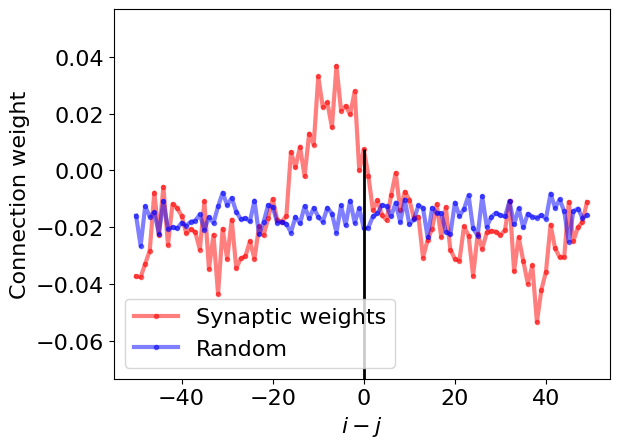

In [ ]:
full = 120
sub = 20
new_full = full - sub

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = matrix_3[sub:,sub:]
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1], color='r', alpha=0.5, marker='.', label='Synaptic weights', linewidth=3)
old = x.copy()

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = 0.1 * (np.random.rand(new_full,new_full) -0.5) + np.nanmean(old, axis=0)[::-1].mean()
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1],color='b', alpha=0.5, marker='.', label='Random', linewidth=3)
plt.vlines(x=0,ymin=-1,ymax=np.nanmean(old, axis=0)[::-1][new_full//2], color='k', linewidth=2)
plt.ylim([np.nanmean(old, axis=0)[::-1].min()-0.02,np.nanmean(old, axis=0)[::-1].max()+0.02])
plt.ylabel('Connection weight',fontsize=16)
plt.xlabel('$i-j$',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/suppfig2e.svg')
plt.show()

(200, 100)
(200, 100)


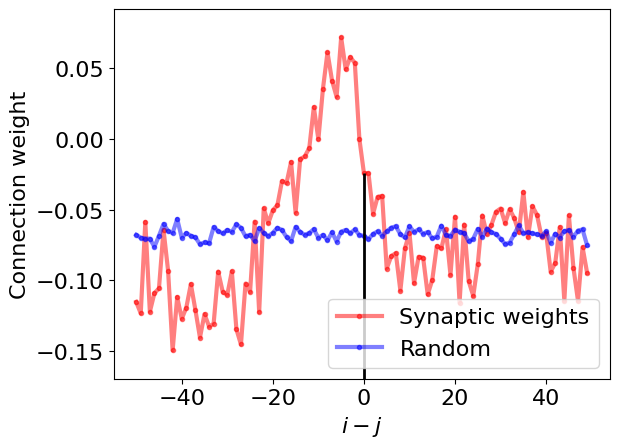

In [ ]:
full = 120
sub = 20
new_full = full - sub

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = matrix_6[sub:,sub:]
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1], color='r', alpha=0.5, marker='.', label='Synaptic weights', linewidth=3)
old = x.copy()

x = np.zeros((new_full,new_full))
y = np.zeros((new_full//2,new_full))
y[:,:] = np.nan
matrix_3_1 = 0.1 * (np.random.rand(new_full,new_full) -0.5) + np.nanmean(old, axis=0)[::-1].mean()
matrix_3_new = np.vstack((y,matrix_3_1))
matrix_3_new = np.vstack((matrix_3_new,y))
print(matrix_3_new.shape)
for i in range(0,new_full):
    for j in range(-new_full//2,new_full//2,1):
        x[i][j+new_full//2] = matrix_3_new[j+i+new_full//2][i]
plt.plot(np.arange(-new_full//2,new_full//2,1),np.nanmean(x, axis=0)[::-1],color='b', alpha=0.5, marker='.', label='Random', linewidth=3)
plt.vlines(x=0,ymin=-1,ymax=np.nanmean(old, axis=0)[::-1][new_full//2], color='k', linewidth=2)
plt.ylim([np.nanmean(old, axis=0)[::-1].min()-0.02,np.nanmean(old, axis=0)[::-1].max()+0.02])
plt.ylabel('Connection weight',fontsize=16)
plt.xlabel('$i-j$',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/suppfig2e.svg')
plt.show()

## $\Delta$ hidden_act

4.0 -4.0


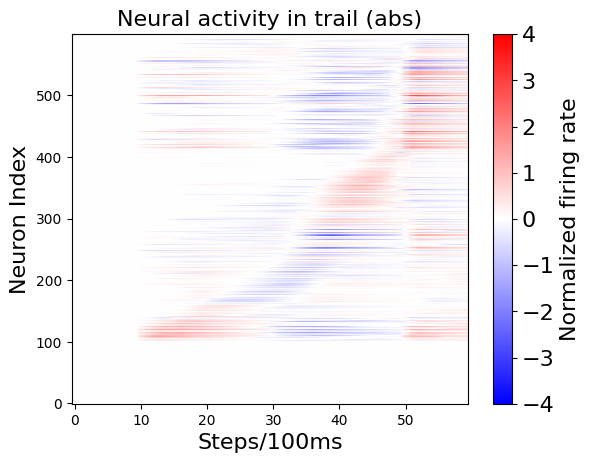

  0%|          | 0/4 [00:00<?, ?it/s]

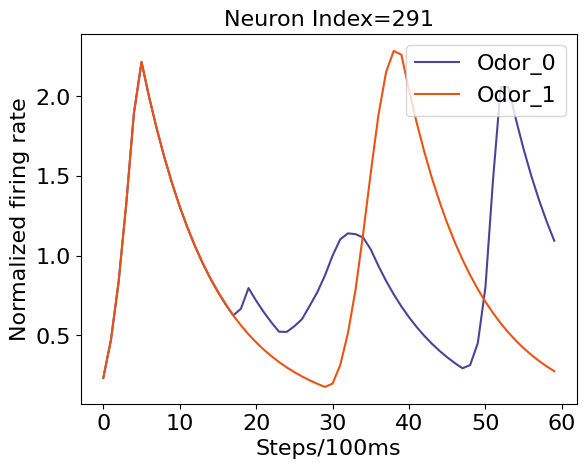

 25%|██▌       | 1/4 [00:00<00:01,  2.13it/s]

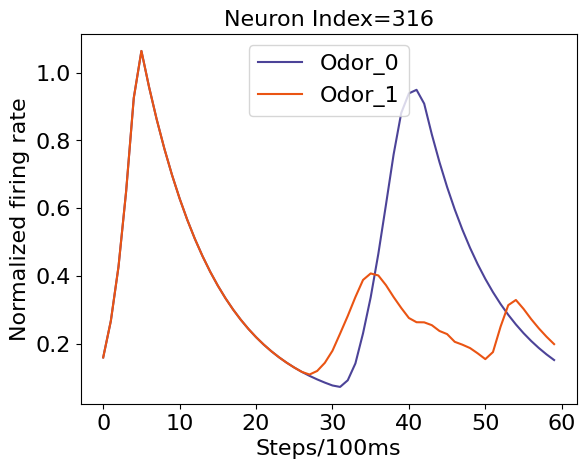

 50%|█████     | 2/4 [00:00<00:00,  2.09it/s]

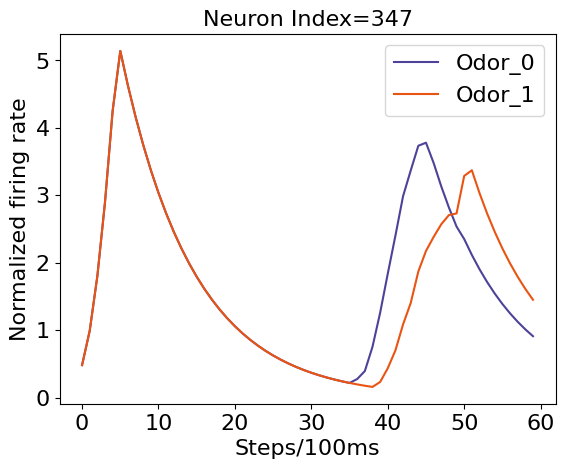

 75%|███████▌  | 3/4 [00:01<00:00,  2.09it/s]

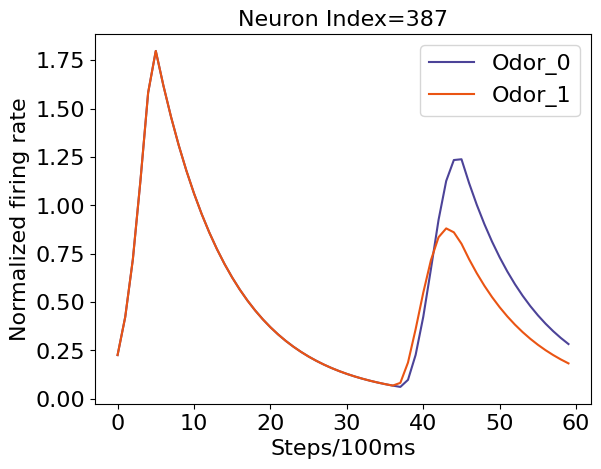

100%|██████████| 4/4 [00:01<00:00,  2.05it/s]


In [603]:
from cProfile import label
from itertools import count
import numpy as np
from torch import arange
# from parameters import *
import pickle
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def relu(inX):
    return np.maximum(0,inX)

def cal_TI(h, start=20, end=80):
    hidden_act = h
    hidden_act = hidden_act.T #600,90
    assert hidden_act.shape[0] == 600
    data = relu(normalization2(hidden_act).T) #90,600
    # data = relu(hidden_act.T[20:80,])
    ts = data.shape[0]  # number of time points
    entrpy_bins = end-start
    window_size = 1
    r_threshold = 0

    # selected_indx = np.nonzero(np.mean(data, axis=0) > r_threshold)[0]
    selected_indx = np.where(np.max(data, axis=0) > r_threshold)[0] # 大于平均发放率的神经元下标
    # selected_indx = np.array(selected_indx).squeeze()
    data = data[:, selected_indx]

    peak_times = np.argmax(data, axis=0) # 峰值时刻
    delay_peak_times = np.argmax(data[start:end,:], axis=0) #延迟时间 最大的发放率的下标
    index1 = np.where(data[start:end,:]>0.4) # 大于0.4的下标
    end_times = np.clip(delay_peak_times + window_size + 1, 0, ts)
    start_times = np.clip(delay_peak_times - window_size, 0, ts)
    # entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) 
    entrpy = entropy(np.histogram(delay_peak_times, entrpy_bins)[0]) # 延迟时间的能量
    entrpy_ori = entropy(np.histogram(delay_peak_times, entrpy_bins)[0], base=2)
    entrpy_max = entropy(np.ones(entrpy_bins)*data.shape[1]/entrpy_bins)
    # entrpy = entropy(np.histogram(peak_times, entrpy_bins)[0] + 0.1 * np.ones(entrpy_bins))
    r2b_ratio = np.zeros(len(selected_indx)) # 大于平均发放率的神经元比例
    trans_index = 0
    for nind in range(len(selected_indx)):
        # mask = np.zeros(ts)
        # mask[int(start_times[nind]):int(end_times[nind])] = 1
        data0 = data[start:end, nind]
        # ridge = np.mean(data0[int(start_times[nind]):int(end_times[nind])])
        ridge = np.sum(data0[start_times[nind]:end_times[nind]])
        # backgr = np.mean(np.ma.MaskedArray(data0, mask))
        backgr = np.sum(data0)
        # r2b_ratio[nind] = np.log(ridge) - np.log(backgr)
        if backgr == 0:
            r2b_ratio[nind] = 0
        else:
            r2b_ratio[nind] = ridge/backgr #* (end-start)/(end_times[nind]-start_times[nind]) # 窗口期间发放率
        trace_sum = ridge/(end_times[nind]-start_times[nind])
        trans_index += trace_sum

    trans_index /= len(selected_indx)
    entrpy = entrpy / entrpy_max
    r2b_ratio = np.nanmean(r2b_ratio)

    index1 = np.where(peak_times>=start)
    index2 = np.where(peak_times<end)
    index_delay = np.intersect1d(index1[0], index2[0]) # 延迟期间的下标
    trans_len = len(index_delay)/len(selected_indx)
    # transient_index = np.sum(data)/(60*500)
    SI_trial_vec = r2b_ratio + entrpy
    Total = SI_trial_vec + trans_len
    return round(Total, 3), entrpy_ori, entrpy, r2b_ratio, round(SI_trial_vec, 3), trans_index, trans_len

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_3_hidd_600_seed_1_lr0.001/20240127142627_model_1_sample_0_match_1_theta_180_noiseh_False.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
hidden_act1 = results.T

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_v5_vision2_tansient_True_connection_0.4_region_True_mode_test_delay_3_hidd_600_seed_1_lr0.001/20240127142640_model_1_sample_1_match_1_theta_180_noiseh_False.pt'
results = torch.load(netdir)['hidden_act'][:,0,:]
hidden_act2 = results.T

delta_hidden = hidden_act1 - hidden_act2

def c_mass_1(data):
    interval = 5
    mass_max = 0
    mass_loc = 0
    for i in range(len(data)-interval):
        if np.sum(abs(data[i:i+interval])) > mass_max:
            mass_max = np.sum(abs(data[i:i+interval]))
            mass_loc = i + interval/2
    return (mass_loc, mass_max)

def sorting_1(base):
    loc_all_0 = []
    for i in base[:, :]:
        loc, mass = c_mass_1(i)
        loc_all_0.append(loc) 
        # mass_all.append(mass)
    B = np.argsort(loc_all_0)  

    return B, np.sort(loc_all_0)

data0 = delta_hidden
B_mylstm, local_3 = sorting_1(data0)
data0 = data0[B_mylstm,:]
data0[np.where(data0>=0)] = 4 * data0[np.where(data0>=0)]/data0[np.where(data0>=0)].max()
data0[np.where(data0<0)] = -4 * data0[np.where(data0<0)]/data0[np.where(data0<0)].min()
print(data0.max(), data0.min())
fig=plt.imshow(data0, aspect='auto',cmap='bwr')
plt.xlabel('Steps/100ms',fontsize=16)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index',fontsize=16)
plt.title('Neural activity in trail (abs)',fontsize=16)
cb=plt.colorbar(fig)
cb.set_label("Normalized firing rate", fontdict={'size':16})
cb.ax.tick_params(labelsize=16)
plt.savefig('figure/suppfig1b.svg')
plt.show()

# from tqdm import tqdm
# for i in tqdm(range(600)):
#     fig, ax = plt.subplots()
#     plt.plot(hidden_act1[B_mylstm,:][i], color='#4c4398', label='Odor_0')
#     plt.plot(hidden_act2[B_mylstm,:][i], color='#ea5413', label='Odor_1')
#     plt.title('index={}'.format(i))
#     plt.legend()
#     plt.savefig('./figure2/{}.png'.format(i),dpi=600)
#     plt.close()

from tqdm import tqdm
neurons = [291,316,347,387]
for i in tqdm(range(len(neurons))):
    fig, ax = plt.subplots()
    plt.plot(hidden_act1[B_mylstm,:][neurons[i]], color='#4c4398', label='Odor_0')
    plt.plot(hidden_act2[B_mylstm,:][neurons[i]], color='#ea5413', label='Odor_1')
    plt.title('Neuron Index={}'.format(neurons[i]),fontsize=16)
    plt.legend(fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("Steps/100ms",fontsize=16)
    plt.ylabel("Normalized firing rate",fontsize=16)
    plt.savefig('figure/suppfig1a_{}.svg'.format(neurons[i]))
    plt.show()
# plt.show()

## Odor

### 3s output

newdata0: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0] 2
newdata1: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 1
newdata2: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 2
newdata3: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 1
newdata4: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0] 2
newdata5: [0 0 0 0 0

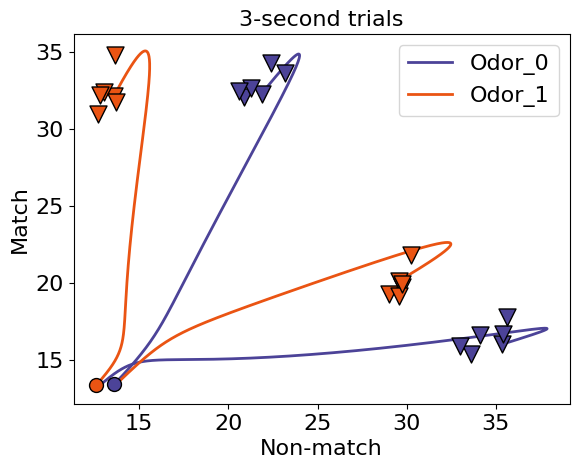

(3, 2160)
(90, 3)


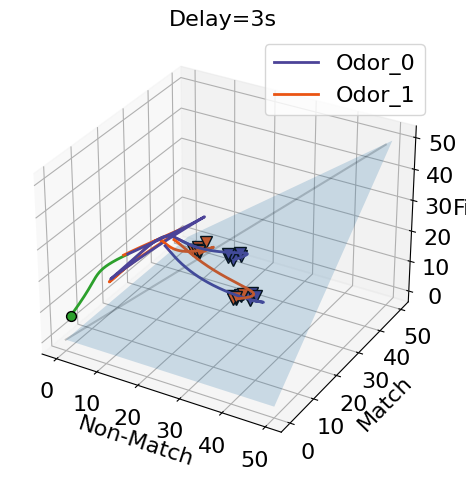

In [ ]:

import warnings
warnings.filterwarnings('ignore')
from matplotlib.patches import Polygon
%matplotlib inline
N = 0

with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/w_1output.pkl', 'rb') as handle:
    w_out = pickle.load(handle).detach().cpu().numpy()
with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/b_1output.pkl', 'rb') as handle:
    b_out = pickle.load(handle).detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata0:',label, 2)
hidden_act = temp.T
# print('output1:', hidden_act[0])
# print('output2:', hidden_act[1])
# print('output3:', hidden_act[2])
data0 = hidden_act
newdata0 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata1:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata1 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata2:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata2 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata3:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata3 = data0.copy()


netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata4:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata4 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata5:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata5 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata6:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata6 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata7:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata7 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata8:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata8 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata9:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata9 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata10:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata10 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata11:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata11 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata12:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata12 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata13:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata13 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata14:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata14 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata15:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata15 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata16:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata16 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata17:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata17 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata18:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata18 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata19:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata19 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata20:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata20 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata21:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata21 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata22:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata22 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata23:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata23 = data0.copy()

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import FastICA
from sklearn.decomposition import DictionaryLearning
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import Isomap
# from dPCA import dPCA

print(newdata0==newdata1)
data = np.hstack((newdata0, newdata1, newdata2, newdata3, newdata4, newdata5, newdata6, newdata7, newdata8, newdata9, newdata10, newdata11, newdata12, newdata13, newdata14, newdata15, newdata16, newdata17, newdata18, newdata19, newdata20, newdata21, newdata22, newdata23))
h_data = data.copy()
print(data.shape)


# N,T,S = 600,2160,6
# noise, n_samples = 0.2, 10
# data = np.expand_dims(data, 1)
# data = np.repeat(data, S, 1)
# data = np.expand_dims(data, 0)
# data = np.repeat(data, n_samples, 0)
# print(data.shape)
# # trial-average data
# R = np.mean(data,0)
# # center data
# R -= np.mean(R.reshape((N,-1)),1)[:,None,None]
# dpca = dPCA.dPCA(labels='st', n_components=2,regularizer='auto')
# dpca.protect = ['t']
# print(R.shape, data.shape)
# Z = dpca.fit_transform(R,data)
# print(Z['st'].shape)
# newdata = Z['st'][:,0,:].T

Model = PCA
pca = Model(n_components=2)
newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:90, :]
newtrace1 = newdata[90:90*2, :]
newtrace2 = newdata[90*2:90*3, :]
newtrace3 = newdata[90*3:90*4, :]
newtrace4 = newdata[90*4:90*5, :]
newtrace5 = newdata[90*5:90*6, :]
newtrace6 = newdata[90*6:90*7, :]
newtrace7 = newdata[90*7:90*8, :]
newtrace8 = newdata[90*8:90*9, :]
newtrace9 = newdata[90*9:90*10, :]
newtrace10 = newdata[90*10:90*11, :]
newtrace11 = newdata[90*11:90*12, :]
newtrace12 = newdata[90*12:90*13, :]
newtrace13 = newdata[90*13:90*14, :]
newtrace14 = newdata[90*14:90*15, :]
newtrace15 = newdata[90*15:90*16, :]
newtrace16 = newdata[90*16:90*17, :]
newtrace17 = newdata[90*17:90*18, :]
newtrace18 = newdata[90*18:90*19, :]
newtrace19 = newdata[90*19:90*20, :]
newtrace20 = newdata[90*20:90*21, :]
newtrace21 = newdata[90*21:90*22, :]
newtrace22 = newdata[90*22:90*23, :]
newtrace23 = newdata[90*23:90*24, :]
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)
bz4 = Bezier(newtrace4, 1800)
matpi4=bz4.getBezierPoints(0)
bz5 = Bezier(newtrace5, 1800)
matpi5=bz5.getBezierPoints(0)
bz6 = Bezier(newtrace6, 1800)
matpi6=bz6.getBezierPoints(0)
bz7 = Bezier(newtrace7, 1800)
matpi7=bz7.getBezierPoints(0)
bz8 = Bezier(newtrace8, 1800)
matpi8=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace9, 1800)
matpi9=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace10, 1800)
matpi10=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace11, 1800)
matpi11=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace12, 1800)
matpi12=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace13, 1800)
matpi13=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace14, 1800)
matpi14=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace15, 1800)
matpi15=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace16, 1800)
matpi16=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace17, 1800)
matpi17=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace18, 1800)
matpi18=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace19, 1800)
matpi19=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace20, 1800)
matpi20=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace21, 1800)
matpi21=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace22, 1800)
matpi22=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace23, 1800)
matpi23=bz11.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()
plt.plot(matpi0[1800*2//3//6*5-200:1800*2//3//6*6,1],matpi0[1800*2//3//6*5-200:1800*2//3//6*6,2], color='#ea5413', linewidth=2,zorder=1)
plt.scatter(matpi0[1800*2//3//6*6,1],matpi0[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.plot(matpi1[1800*2//3//6*5-200:1800*2//3//6*6,1],matpi1[1800*2//3//6*5-200:1800*2//3//6*6,2], color='#4c4398', linewidth=2,zorder=1)
plt.scatter(matpi1[1800*2//3//6*6,1],matpi1[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.plot(matpi2[1800*2//3//6*5-200:1800*2//3//6*6,1],matpi2[1800*2//3//6*5-200:1800*2//3//6*6,2], color='#4c4398', linewidth=2, label='Odor_0',zorder=1)
plt.scatter(matpi2[1800*2//3//6*6,1],matpi2[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.plot(matpi3[1800*2//3//6*5-200:1800*2//3//6*6,1],matpi3[1800*2//3//6*5-200:1800*2//3//6*6,2], color='#ea5413', linewidth=2, label='Odor_1',zorder=1)
plt.scatter(matpi3[1800*2//3//6*6,1],matpi3[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi4[1800*2//3//6*6,1],matpi4[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi5[1800*2//3//6*6,1],matpi5[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi6[1800*2//3//6*6,1],matpi6[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi7[1800*2//3//6*6,1],matpi7[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi8[1800*2//3//6*6,1],matpi8[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi9[1800*2//3//6*6,1],matpi9[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi10[1800*2//3//6*6,1],matpi10[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi11[1800*2//3//6*6,1],matpi11[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi12[1800*2//3//6*6,1],matpi12[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi13[1800*2//3//6*6,1],matpi13[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi14[1800*2//3//6*6,1],matpi14[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi15[1800*2//3//6*6,1],matpi15[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi16[1800*2//3//6*6,1],matpi16[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi17[1800*2//3//6*6,1],matpi17[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi18[1800*2//3//6*6,1],matpi18[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi19[1800*2//3//6*6,1],matpi19[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi20[1800*2//3//6*6,1],matpi20[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi21[1800*2//3//6*6,1],matpi21[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi22[1800*2//3//6*6,1],matpi22[1800*2//3//6*6,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi23[1800*2//3//6*6,1],matpi23[1800*2//3//6*6,2], c='#ea5413', marker='v', s=150, edgecolors='k')

plt.scatter(matpi0[1800*2//3//6*5-200,1],matpi0[1800*2//3//6*5-200,2], c='#ea5413', marker='o', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800*2//3//6*5-200,1],matpi2[1800*2//3//6*5-200,2], c='#4c4398', marker='o', s=100, edgecolors='k',zorder=2)
# plt.plot([0,50], [0,50])
plt.legend()

plt.xlabel('Non-match',fontsize=16)
plt.ylabel('Match',fontsize=16)
plt.title('3-second trials',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/fig3d1.svg')

plt.show()


data = np.hstack((newdata0, newdata1, newdata2, newdata3, newdata4, newdata5, newdata6, newdata7, newdata8, newdata9, newdata10, newdata11, newdata12, newdata13, newdata14, newdata15, newdata16, newdata17, newdata18, newdata19, newdata20, newdata21, newdata22, newdata23))
h_data = data.copy()
print(data.shape)

# N,T,S = 600,2160,6
# noise, n_samples = 0.2, 10
# data = np.expand_dims(data, 1)
# data = np.repeat(data, S, 1)
# data = np.expand_dims(data, 0)
# data = np.repeat(data, n_samples, 0)
# print(data.shape)
# # trial-average data
# R = np.mean(data,0)
# # center data
# R -= np.mean(R.reshape((N,-1)),1)[:,None,None]
# dpca = dPCA.dPCA(labels='st', n_components=3,regularizer='auto')
# dpca.protect = ['t']
# print(R.shape, data.shape)
# Z = dpca.fit_transform(R,data)
# print(Z['st'].shape)
# newdata = Z['st'][:,0,:].T

pca = Model(n_components=3)
newdata = data.T
NUM =90
newtrace0 = newdata[:90, :]
newtrace1 = newdata[90:90*2, :]
newtrace2 = newdata[90*2:90*3, :]
newtrace3 = newdata[90*3:90*4, :]
newtrace4 = newdata[90*4:90*5, :]
newtrace5 = newdata[90*5:90*6, :]
newtrace6 = newdata[90*6:90*7, :]
newtrace7 = newdata[90*7:90*8, :]
newtrace8 = newdata[90*8:90*9, :]
newtrace9 = newdata[90*9:90*10, :]
newtrace10 = newdata[90*10:90*11, :]
newtrace11 = newdata[90*11:90*12, :]
newtrace12 = newdata[90*12:90*13, :]
newtrace13 = newdata[90*13:90*14, :]
newtrace14 = newdata[90*14:90*15, :]
newtrace15 = newdata[90*15:90*16, :]
newtrace16 = newdata[90*16:90*17, :]
newtrace17 = newdata[90*17:90*18, :]
newtrace18 = newdata[90*18:90*19, :]
newtrace19 = newdata[90*19:90*20, :]
newtrace20 = newdata[90*20:90*21, :]
newtrace21 = newdata[90*21:90*22, :]
newtrace22 = newdata[90*22:90*23, :]
newtrace23 = newdata[90*23:90*24, :]
print(newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)
bz4 = Bezier(newtrace4, 1800)
matpi4=bz4.getBezierPoints(0)
bz5 = Bezier(newtrace5, 1800)
matpi5=bz5.getBezierPoints(0)
bz6 = Bezier(newtrace6, 1800)
matpi6=bz6.getBezierPoints(0)
bz7 = Bezier(newtrace7, 1800)
matpi7=bz7.getBezierPoints(0)
bz8 = Bezier(newtrace8, 1800)
matpi8=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace9, 1800)
matpi9=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace10, 1800)
matpi10=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace11, 1800)
matpi11=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace12, 1800)
matpi12=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace13, 1800)
matpi13=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace14, 1800)
matpi14=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace15, 1800)
matpi15=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace16, 1800)
matpi16=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace17, 1800)
matpi17=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace18, 1800)
matpi18=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace19, 1800)
matpi19=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace20, 1800)
matpi20=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace21, 1800)
matpi21=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace22, 1800)
matpi22=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace23, 1800)
matpi23=bz11.getBezierPoints(0)


fig=plt.figure()
ax = fig.add_subplot(projection='3d')
SIZE = 8
ax.plot(matpi0[1800*2//3//6*5-100:1800*2//3//6*6,1],matpi0[1800*2//3//6*5-100:1800*2//3//6*6,2],matpi0[1800*2//3//6*5-100:1800*2//3//6*6,0], color='#ea5413', linewidth=2,zorder=3)
ax.plot(matpi0[1800*2//3//6*6,1],matpi0[1800*2//3//6*6,2],matpi0[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi1[1800*2//3//6*5-100:1800*2//3//6*6,1],matpi1[1800*2//3//6*5-100:1800*2//3//6*6,2],matpi1[1800*2//3//6*5-100:1800*2//3//6*6,0], color='#4c4398', linewidth=2,zorder=3)
ax.plot(matpi1[1800*2//3//6*6,1],matpi1[1800*2//3//6*6,2],matpi1[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi2[1800*2//3//6*5-100:1800*2//3//6*6,1],matpi2[1800*2//3//6*5-100:1800*2//3//6*6,2],matpi2[1800*2//3//6*5-100:1800*2//3//6*6,0], color='#4c4398', linewidth=2, label='Odor_0',zorder=3)
ax.plot(matpi2[1800*2//3//6*6,1],matpi2[1800*2//3//6*6,2],matpi2[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi3[1800*2//3//6*5-100:1800*2//3//6*6,1],matpi3[1800*2//3//6*5-100:1800*2//3//6*6,2],matpi3[1800*2//3//6*5-100:1800*2//3//6*6,0], color='#ea5413', linewidth=2, label='Odor_1',zorder=3)
ax.plot(matpi3[1800*2//3//6*6,1],matpi3[1800*2//3//6*6,2],matpi3[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi4[1800*2//3//6*6,1],matpi4[1800*2//3//6*6,2],matpi4[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi5[1800*2//3//6*6,1],matpi5[1800*2//3//6*6,2],matpi5[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi6[1800*2//3//6*6,1],matpi6[1800*2//3//6*6,2],matpi6[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi7[1800*2//3//6*6,1],matpi7[1800*2//3//6*6,2],matpi7[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi8[1800*2//3//6*6,1],matpi8[1800*2//3//6*6,2],matpi8[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi9[1800*2//3//6*6,1],matpi9[1800*2//3//6*6,2],matpi9[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi10[1800*2//3//6*6,1],matpi10[1800*2//3//6*6,2],matpi10[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi11[1800*2//3//6*6,1],matpi11[1800*2//3//6*6,2],matpi11[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi12[1800*2//3//6*6,1],matpi12[1800*2//3//6*6,2],matpi12[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi13[1800*2//3//6*6,1],matpi13[1800*2//3//6*6,2],matpi13[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi14[1800*2//3//6*6,1],matpi14[1800*2//3//6*6,2],matpi14[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi15[1800*2//3//6*6,1],matpi15[1800*2//3//6*6,2],matpi15[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi16[1800*2//3//6*6,1],matpi16[1800*2//3//6*6,2],matpi16[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi17[1800*2//3//6*6,1],matpi17[1800*2//3//6*6,2],matpi17[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi18[1800*2//3//6*6,1],matpi18[1800*2//3//6*6,2],matpi18[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi19[1800*2//3//6*6,1],matpi19[1800*2//3//6*6,2],matpi19[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi20[1800*2//3//6*6,1],matpi20[1800*2//3//6*6,2],matpi20[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi21[1800*2//3//6*6,1],matpi21[1800*2//3//6*6,2],matpi21[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi22[1800*2//3//6*6,1],matpi22[1800*2//3//6*6,2],matpi22[1800*2//3//6*6,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, c='k',zorder=1)
ax.plot(matpi23[1800*2//3//6*6,1],matpi23[1800*2//3//6*6,2],matpi23[1800*2//3//6*6,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, c='k',zorder=1)

ax.scatter(matpi3[0,1],matpi3[0,2],matpi3[0,0], c='C2', marker='o', s=50, edgecolors='k')
ax.plot(matpi3[0:1800*2//3//6*1,1],matpi3[0:1800*2//3//6*1,2],matpi3[0:1800*2//3//6*1,0], color='C2', linewidth=2)
ax.plot(matpi0[1800*2//3//6*1:1800*2//3//6*5-100,1],matpi0[1800*2//3//6*1:1800*2//3//6*5-100,2],matpi0[1800*2//3//6*1:1800*2//3//6*5-100,0], color='#ea5413', linewidth=2)
# ax.plot(matpi1[1800*2//3//6*1:1800*2//3//6*5-100,1],matpi1[1800*2//3//6*1:1800*2//3//6*5-100,2],matpi1[1800*2//3//6*1:1800*2//3//6*5-100,0], color='#ea5413', linewidth=2)
ax.plot(matpi2[1800*2//3//6*1:1800*2//3//6*5,1],matpi2[1800*2//3//6*1:1800*2//3//6*5,2],matpi2[1800*2//3//6*1:1800*2//3//6*5,0], color='#4c4398', linewidth=2)
# ax.plot(matpi3[1800*2//3//6*1:1800*2//3//6*5,1],matpi3[1800*2//3//6*1:1800*2//3//6*5,2],matpi3[1800*2//3//6*1:1800*2//3//6*5,0], color='#4c4398', linewidth=2)

ax.plot_trisurf([0,50,50], [0,0,50], [0,0,50], antialiased=True, alpha=0.2, color='C0')
ax.plot_trisurf([0,0,50], [0,50,50], [0,0,50], antialiased=True, alpha=0.2, color='C0')

ax.plot(np.arange(0,50),np.arange(0,50),np.arange(0,50), color='k', alpha=0.2)
ax.set_xlabel('Non-Match',fontsize=16)
ax.set_ylabel('Match',fontsize=16)
ax.set_zlabel('Fix',fontsize=16)
ax.tick_params(axis='x',labelsize=16)
ax.tick_params(axis='y',labelsize=16)
ax.tick_params(axis='z',labelsize=16)
plt.title('Delay=3s',fontsize=16)
plt.legend(fontsize=16)
plt.tight_layout()
plt.savefig('figure/suppfig2d1.svg')
plt.show()

### 6s output

newdata0: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2] 2
newdata1: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 1 1 1 1 1 1 1 1 1] 1
newdata2: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2] 2
newdata3: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 1 1 1 1 1 1 1 1 1] 1
newdata4: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2] 2
newdata5: [0 0 0 0 0

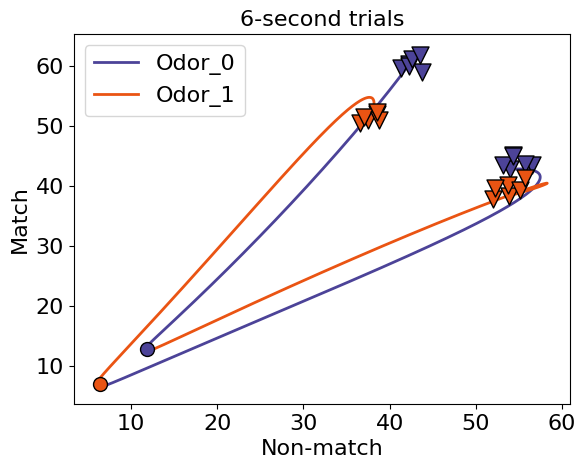

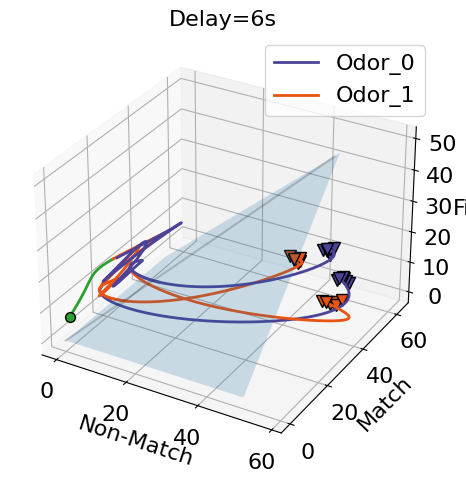

In [ ]:

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
N = 0

with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/w_1output.pkl', 'rb') as handle:
    w_out = pickle.load(handle).detach().cpu().numpy()
with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/b_1output.pkl', 'rb') as handle:
    b_out = pickle.load(handle).detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata0:',label, 2)
hidden_act = temp.T
# print('output1:', hidden_act[0])
# print('output2:', hidden_act[1])
# print('output3:', hidden_act[2])
data0 = hidden_act
newdata0 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata1:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata1 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata2:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata2 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata3:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata3 = data0.copy()


netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata4:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata4 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata5:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata5 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata6:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata6 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata7:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata7 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata8:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata8 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata9:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata9 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata10:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata10 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata11:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata11 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata12:',label, 2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata12 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata13:',label, 1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata13 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata14:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata14 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata15:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata15 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata16:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata16 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata17:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata17 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata18:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata18 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata19:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata19 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata20:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata20 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata21:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata21 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata22:',label,2)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata22 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata23:',label,1)
hidden_act = temp.T
data0 = hidden_act
TI = cal_TI(data0,1,17)[0]
newdata23 = data0.copy()

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import FastICA
from sklearn.decomposition import DictionaryLearning
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import Isomap
# from dPCA import dPCA

data = np.hstack((newdata0, newdata1, newdata2, newdata3, newdata4, newdata5, newdata6, newdata7, newdata8, newdata9, newdata10, newdata11, newdata12, newdata13, newdata14, newdata15, newdata16, newdata17, newdata18, newdata19, newdata20, newdata21, newdata22, newdata23))
h_data = data.copy()
print(data.shape)


# N,T,S = 600,2160,6
# noise, n_samples = 0.2, 10
# data = np.expand_dims(data, 1)
# data = np.repeat(data, S, 1)
# data = np.expand_dims(data, 0)
# data = np.repeat(data, n_samples, 0)
# print(data.shape)
# # trial-average data
# R = np.mean(data,0)
# # center data
# R -= np.mean(R.reshape((N,-1)),1)[:,None,None]
# dpca = dPCA.dPCA(labels='st', n_components=2,regularizer='auto')
# dpca.protect = ['t']
# print(R.shape, data.shape)
# Z = dpca.fit_transform(R,data)
# print(Z['st'].shape)
# newdata = Z['st'][:,0,:].T

Model = PCA
pca = Model(n_components=2)
newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:90, :]
newtrace1 = newdata[90:90*2, :]
newtrace2 = newdata[90*2:90*3, :]
newtrace3 = newdata[90*3:90*4, :]
newtrace4 = newdata[90*4:90*5, :]
newtrace5 = newdata[90*5:90*6, :]
newtrace6 = newdata[90*6:90*7, :]
newtrace7 = newdata[90*7:90*8, :]
newtrace8 = newdata[90*8:90*9, :]
newtrace9 = newdata[90*9:90*10, :]
newtrace10 = newdata[90*10:90*11, :]
newtrace11 = newdata[90*11:90*12, :]
newtrace12 = newdata[90*12:90*13, :]
newtrace13 = newdata[90*13:90*14, :]
newtrace14 = newdata[90*14:90*15, :]
newtrace15 = newdata[90*15:90*16, :]
newtrace16 = newdata[90*16:90*17, :]
newtrace17 = newdata[90*17:90*18, :]
newtrace18 = newdata[90*18:90*19, :]
newtrace19 = newdata[90*19:90*20, :]
newtrace20 = newdata[90*20:90*21, :]
newtrace21 = newdata[90*21:90*22, :]
newtrace22 = newdata[90*22:90*23, :]
newtrace23 = newdata[90*23:90*24, :]
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)
bz4 = Bezier(newtrace4, 1800)
matpi4=bz4.getBezierPoints(0)
bz5 = Bezier(newtrace5, 1800)
matpi5=bz5.getBezierPoints(0)
bz6 = Bezier(newtrace6, 1800)
matpi6=bz6.getBezierPoints(0)
bz7 = Bezier(newtrace7, 1800)
matpi7=bz7.getBezierPoints(0)
bz8 = Bezier(newtrace8, 1800)
matpi8=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace9, 1800)
matpi9=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace10, 1800)
matpi10=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace11, 1800)
matpi11=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace12, 1800)
matpi12=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace13, 1800)
matpi13=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace14, 1800)
matpi14=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace15, 1800)
matpi15=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace16, 1800)
matpi16=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace17, 1800)
matpi17=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace18, 1800)
matpi18=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace19, 1800)
matpi19=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace20, 1800)
matpi20=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace21, 1800)
matpi21=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace22, 1800)
matpi22=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace23, 1800)
matpi23=bz11.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()
plt.plot(matpi0[1800//9*8-100:1800//9*9,1],matpi0[1800//9*8-100:1800//9*9,2], color='#ea5413', linewidth=2,zorder=1)
plt.scatter(matpi0[1800//9*9,1],matpi0[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.plot(matpi1[1800//9*8-100:1800//9*9,1],matpi1[1800//9*8-100:1800//9*9,2], color='#4c4398', linewidth=2,zorder=1)
plt.scatter(matpi1[1800//9*9,1],matpi1[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.plot(matpi2[1800//9*8-100:1800//9*9,1],matpi2[1800//9*8-100:1800//9*9,2], color='#4c4398', linewidth=2,zorder=1, label='Odor_0')
plt.scatter(matpi2[1800//9*9,1],matpi2[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.plot(matpi3[1800//9*8-100:1800//9*9,1],matpi3[1800//9*8-100:1800//9*9,2], color='#ea5413', linewidth=2,zorder=1, label='Odor_1')
plt.scatter(matpi3[1800//9*9,1],matpi3[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi4[1800//9*9,1],matpi4[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi5[1800//9*9,1],matpi5[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi6[1800//9*9,1],matpi6[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi7[1800//9*9,1],matpi7[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi8[1800//9*9,1],matpi8[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi9[1800//9*9,1],matpi9[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi10[1800//9*9,1],matpi10[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi11[1800//9*9,1],matpi11[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi12[1800//9*9,1],matpi12[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi13[1800//9*9,1],matpi13[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi14[1800//9*9,1],matpi14[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi15[1800//9*9,1],matpi15[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi16[1800//9*9,1],matpi16[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi17[1800//9*9,1],matpi17[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi18[1800//9*9,1],matpi18[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi19[1800//9*9,1],matpi19[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi20[1800//9*9,1],matpi20[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')
plt.scatter(matpi21[1800//9*9,1],matpi21[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi22[1800//9*9,1],matpi22[1800//9*9,2], c='#4c4398', marker='v', s=150, edgecolors='k')
plt.scatter(matpi23[1800//9*9,1],matpi23[1800//9*9,2], c='#ea5413', marker='v', s=150, edgecolors='k')

plt.scatter(matpi0[1800//9*8-100,1],matpi0[1800//9*8-100,2], c='#ea5413', marker='o', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800//9*8-100,1],matpi2[1800//9*8-100,2], c='#4c4398', marker='o', s=100, edgecolors='k',zorder=2)

plt.legend()

plt.xlabel('Non-match',fontsize=16)
plt.ylabel('Match',fontsize=16)
plt.title('6-second trials',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig('figure/fig3d2.svg')


data = np.hstack((newdata0, newdata1, newdata2, newdata3, newdata4, newdata5, newdata6, newdata7, newdata8, newdata9, newdata10, newdata11, newdata12, newdata13, newdata14, newdata15, newdata16, newdata17, newdata18, newdata19, newdata20, newdata21, newdata22, newdata23))
h_data = data.copy()
print(data.shape)

# N,T,S = 600,2160,6
# noise, n_samples = 0.2, 10
# data = np.expand_dims(data, 1)
# data = np.repeat(data, S, 1)
# data = np.expand_dims(data, 0)
# data = np.repeat(data, n_samples, 0)
# print(data.shape)
# # trial-average data
# R = np.mean(data,0)
# # center data
# R -= np.mean(R.reshape((N,-1)),1)[:,None,None]
# dpca = dPCA.dPCA(labels='st', n_components=3,regularizer='auto')
# dpca.protect = ['t']
# print(R.shape, data.shape)
# Z = dpca.fit_transform(R,data)
# print(Z['st'].shape)
# newdata = Z['st'][:,0,:].T

pca = Model(n_components=3)
newdata = data.T
NUM =90
newtrace0 = newdata[:90, :]
newtrace1 = newdata[90:90*2, :]
newtrace2 = newdata[90*2:90*3, :]
newtrace3 = newdata[90*3:90*4, :]
newtrace4 = newdata[90*4:90*5, :]
newtrace5 = newdata[90*5:90*6, :]
newtrace6 = newdata[90*6:90*7, :]
newtrace7 = newdata[90*7:90*8, :]
newtrace8 = newdata[90*8:90*9, :]
newtrace9 = newdata[90*9:90*10, :]
newtrace10 = newdata[90*10:90*11, :]
newtrace11 = newdata[90*11:90*12, :]
newtrace12 = newdata[90*12:90*13, :]
newtrace13 = newdata[90*13:90*14, :]
newtrace14 = newdata[90*14:90*15, :]
newtrace15 = newdata[90*15:90*16, :]
newtrace16 = newdata[90*16:90*17, :]
newtrace17 = newdata[90*17:90*18, :]
newtrace18 = newdata[90*18:90*19, :]
newtrace19 = newdata[90*19:90*20, :]
newtrace20 = newdata[90*20:90*21, :]
newtrace21 = newdata[90*21:90*22, :]
newtrace22 = newdata[90*22:90*23, :]
newtrace23 = newdata[90*23:90*24, :]
print(newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)
bz4 = Bezier(newtrace4, 1800)
matpi4=bz4.getBezierPoints(0)
bz5 = Bezier(newtrace5, 1800)
matpi5=bz5.getBezierPoints(0)
bz6 = Bezier(newtrace6, 1800)
matpi6=bz6.getBezierPoints(0)
bz7 = Bezier(newtrace7, 1800)
matpi7=bz7.getBezierPoints(0)
bz8 = Bezier(newtrace8, 1800)
matpi8=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace9, 1800)
matpi9=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace10, 1800)
matpi10=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace11, 1800)
matpi11=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace12, 1800)
matpi12=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace13, 1800)
matpi13=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace14, 1800)
matpi14=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace15, 1800)
matpi15=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace16, 1800)
matpi16=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace17, 1800)
matpi17=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace18, 1800)
matpi18=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace19, 1800)
matpi19=bz11.getBezierPoints(0)
bz8 = Bezier(newtrace20, 1800)
matpi20=bz8.getBezierPoints(0)
bz9 = Bezier(newtrace21, 1800)
matpi21=bz9.getBezierPoints(0)
bz10 = Bezier(newtrace22, 1800)
matpi22=bz10.getBezierPoints(0)
bz11 = Bezier(newtrace23, 1800)
matpi23=bz11.getBezierPoints(0)


fig=plt.figure()
ax = fig.add_subplot(projection='3d')
SIZE = 8
ax.plot(matpi0[1800//9*8-100:1800//9*9,1],matpi0[1800//9*8-100:1800//9*9,2],matpi0[1800//9*8-100:1800//9*9,0], color='#ea5413', linewidth=2,zorder=2)
ax.plot(matpi0[1800//9*9,1],matpi0[1800//9*9,2],matpi0[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k')
ax.plot(matpi1[1800//9*8-100:1800//9*9,1],matpi1[1800//9*8-100:1800//9*9,2],matpi1[1800//9*8-100:1800//9*9,0], color='#4c4398', linewidth=2,zorder=2)
ax.plot(matpi1[1800//9*9,1],matpi1[1800//9*9,2],matpi1[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k')
ax.plot(matpi2[1800//9*8-100:1800//9*9,1],matpi2[1800//9*8-100:1800//9*9,2],matpi2[1800//9*8-100:1800//9*9,0], color='#4c4398', linewidth=2,zorder=2, label='Odor_0')
ax.plot(matpi2[1800//9*9,1],matpi2[1800//9*9,2],matpi2[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k')
ax.plot(matpi3[1800//9*8-100:1800//9*9,1],matpi3[1800//9*8-100:1800//9*9,2],matpi3[1800//9*8-100:1800//9*9,0], color='#ea5413', linewidth=2,zorder=2, label='Odor_1')
ax.plot(matpi3[1800//9*9,1],matpi3[1800//9*9,2],matpi3[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi4[1800//9*9,1],matpi4[1800//9*9,2],matpi4[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi5[1800//9*9,1],matpi5[1800//9*9,2],matpi5[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi6[1800//9*9,1],matpi6[1800//9*9,2],matpi6[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi7[1800//9*9,1],matpi7[1800//9*9,2],matpi7[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi8[1800//9*9,1],matpi8[1800//9*9,2],matpi8[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi9[1800//9*9,1],matpi9[1800//9*9,2],matpi9[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi10[1800//9*9,1],matpi10[1800//9*9,2],matpi10[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi11[1800//9*9,1],matpi11[1800//9*9,2],matpi11[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi12[1800//9*9,1],matpi12[1800//9*9,2],matpi12[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi13[1800//9*9,1],matpi13[1800//9*9,2],matpi13[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi14[1800//9*9,1],matpi14[1800//9*9,2],matpi14[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi15[1800//9*9,1],matpi15[1800//9*9,2],matpi15[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi16[1800//9*9,1],matpi16[1800//9*9,2],matpi16[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi17[1800//9*9,1],matpi17[1800//9*9,2],matpi17[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi18[1800//9*9,1],matpi18[1800//9*9,2],matpi18[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi19[1800//9*9,1],matpi19[1800//9*9,2],matpi19[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi20[1800//9*9,1],matpi20[1800//9*9,2],matpi20[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi21[1800//9*9,1],matpi21[1800//9*9,2],matpi21[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi22[1800//9*9,1],matpi22[1800//9*9,2],matpi22[1800//9*9,0], markerfacecolor='#4c4398', marker='v', markersize=SIZE, color='k',zorder=1)
ax.plot(matpi23[1800//9*9,1],matpi23[1800//9*9,2],matpi23[1800//9*9,0], markerfacecolor='#ea5413', marker='v', markersize=SIZE, color='k',zorder=1)

ax.scatter(matpi0[0,1],matpi0[0,2],matpi0[0,0], c='C2', marker='o', s=50, edgecolors='k',zorder=1)
ax.plot(matpi0[0:1800//9*1,1],matpi0[0:1800//9*1,2],matpi0[0:1800//9*1,0], color='C2', linewidth=2,zorder=2)
ax.plot(matpi0[1800//9*1:1800//9*8,1],matpi0[1800//9*1:1800//9*8,2],matpi0[1800//9*1:1800//9*8,0], color='#ea5413', linewidth=2,zorder=2)
ax.plot(matpi2[1800//9*1:1800//9*8,1],matpi2[1800//9*1:1800//9*8,2],matpi2[1800//9*1:1800//9*8,0], color='#4c4398', linewidth=2,zorder=2)


ax.plot_trisurf([0,50,50], [0,0,50], [0,0,50], antialiased=True, alpha=0.2, color='C0')
ax.plot_trisurf([0,0,50], [0,50,50], [0,0,50], antialiased=True, alpha=0.2, color='C0')

ax.plot(np.arange(0,50),np.arange(0,50),np.arange(0,50), color='k', alpha=0.2)
ax.set_xlabel('Non-Match',fontsize=16)
ax.set_ylabel('Match',fontsize=16)
ax.set_zlabel('Fix',fontsize=16)
ax.tick_params(axis='x',labelsize=16)
ax.tick_params(axis='y',labelsize=16)
ax.tick_params(axis='z',labelsize=16)
plt.title('Delay=6s',fontsize=16)
plt.legend(fontsize=16)
plt.tight_layout()
plt.savefig('figure/suppfig2d2.svg')
plt.show()

### 3s & 6s hidden

#### Load data (NSTD)

In [ ]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
N = 0

with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/w_1output.pkl', 'rb') as handle:
    w_out = pickle.load(handle).detach().cpu().numpy()
with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/b_1output.pkl', 'rb') as handle:
    b_out = pickle.load(handle).detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata0:',label, 2)
hidden_act = results.T
# print('output1:', hidden_act[0])
# print('output2:', hidden_act[1])
# print('output3:', hidden_act[2])
data0 = hidden_act
newdata0 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata1:',label, 1)
hidden_act = results.T
data0 = hidden_act
newdata1 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata2:',label, 2)
hidden_act = results.T
data0 = hidden_act
newdata2 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,N,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata3:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata3 = data0.copy()


netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata4:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata4 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata5:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata5 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata6:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata6 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata7:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata7 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata8:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata8 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata9:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata9 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata10:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata10 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,2,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata11:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata11 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata12:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata12 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata13:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata13 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata14:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata14 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata15:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata15 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata16:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata16 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata17:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata17 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata18:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata18 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata19:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata19 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata20:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata20 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata21:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata21 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata22:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata22 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/3_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata23:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata23 = data0.copy()

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import FastICA
from sklearn.decomposition import DictionaryLearning
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import Isomap
from dPCA import dPCA

data = np.hstack((newdata0, newdata1, newdata2, newdata3, newdata4, newdata5, newdata6, newdata7, newdata8, newdata9, newdata10, newdata11, newdata12, newdata13, newdata14, newdata15, newdata16, newdata17, newdata18, newdata19, newdata20, newdata21, newdata22, newdata23))
h_data = data.copy()
print(data.shape)


N,T,S,D = 600,90,2,2
noise, n_samples = 0.2, 6
data = np.zeros((n_samples,N,S,D,T))
print(data.shape)
data[0,:,0,0,:] = newdata0
data[0,:,1,0,:] = newdata2
data[0,:,0,1,:] = newdata1
data[0,:,1,1,:] = newdata3
data[1,:,0,0,:] = newdata4
data[1,:,1,0,:] = newdata6
data[1,:,0,1,:] = newdata5
data[1,:,1,1,:] = newdata7
data[2,:,0,0,:] = newdata8
data[2,:,1,0,:] = newdata10
data[2,:,0,1,:] = newdata9
data[2,:,1,1,:] = newdata11
data[3,:,0,0,:] = newdata12
data[3,:,1,0,:] = newdata14
data[3,:,0,1,:] = newdata13
data[3,:,1,1,:] = newdata15
data[4,:,0,0,:] = newdata16
data[4,:,1,0,:] = newdata18
data[4,:,0,1,:] = newdata17
data[4,:,1,1,:] = newdata19
data[5,:,0,0,:] = newdata20
data[5,:,1,0,:] = newdata22
data[5,:,0,1,:] = newdata21
data[5,:,1,1,:] = newdata23

data3 = data.copy()


import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
N = 0

with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/w_1output.pkl', 'rb') as handle:
    w_out = pickle.load(handle).detach().cpu().numpy()
with open('/home/jiashuncheng/code/Trasient/ODPA/savedir/b_1output.pkl', 'rb') as handle:
    b_out = pickle.load(handle).detach().cpu().numpy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,8,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata0:',label, 2)
hidden_act = results.T
# print('output1:', hidden_act[0])
# print('output2:', hidden_act[1])
# print('output3:', hidden_act[2])
data0 = hidden_act
newdata0 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,8,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata1:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata1 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,8,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata2:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata2 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,8,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata3:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata3 = data0.copy()


netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata4:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata4 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata5:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata5 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata6:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata6 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,1,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata7:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata7 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,9,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata8:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata8 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,9,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata9:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata9 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,9,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata10:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata10 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,9,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata11:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata11 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata12:',label, 2)
hidden_act = results.T
data0 = hidden_act

newdata12 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata13:',label, 1)
hidden_act = results.T
data0 = hidden_act

newdata13 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata14:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata14 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,3,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata15:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata15 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata16:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata16 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata17:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata17 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata18:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata18 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,4,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata19:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata19 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata20:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata20 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test180du_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
results[90:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[80:90]
print('newdata21:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata21 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_7.pkl' #mathc=1
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata22:',label,2)
hidden_act = results.T
data0 = hidden_act

newdata22 = data0.copy()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/6_1test_8.pkl' #mathc=0
results = pickle.load(open(netdir, 'rb'))['hidden_act'][0][:,5,:]
# results[60:] = 0
temp = np.zeros((90,3))
for i in range(temp.shape[0]):
    temp[i] = np.maximum(0,results[i][np.newaxis, :] @ w_out) + b_out
label = np.argmax(temp, axis=1)#[50:60]
print('newdata23:',label,1)
hidden_act = results.T
data0 = hidden_act

newdata23 = data0.copy()

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import FastICA
from sklearn.decomposition import DictionaryLearning
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import Isomap
from dPCA import dPCA


N,T,S,D = 600,90,2,2
noise, n_samples = 0.2, 6
data = np.zeros((n_samples,N,S,D,T))
print(data.shape)
data[0,:,0,0,:] = newdata0
data[0,:,1,0,:] = newdata2
data[0,:,0,1,:] = newdata1
data[0,:,1,1,:] = newdata3
data[1,:,0,0,:] = newdata4
data[1,:,1,0,:] = newdata6
data[1,:,0,1,:] = newdata5
data[1,:,1,1,:] = newdata7
data[2,:,0,0,:] = newdata8
data[2,:,1,0,:] = newdata10
data[2,:,0,1,:] = newdata9
data[2,:,1,1,:] = newdata11
data[3,:,0,0,:] = newdata12
data[3,:,1,0,:] = newdata14
data[3,:,0,1,:] = newdata13
data[3,:,1,1,:] = newdata15
data[4,:,0,0,:] = newdata16
data[4,:,1,0,:] = newdata18
data[4,:,0,1,:] = newdata17
data[4,:,1,1,:] = newdata19
data[5,:,0,0,:] = newdata20
data[5,:,1,0,:] = newdata22
data[5,:,0,1,:] = newdata21
data[5,:,1,1,:] = newdata23

data6 = data.copy()

newdata0: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0] 2
newdata1: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 1
newdata2: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 2
newdata3: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 1
newdata4: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0] 2
newdata5: [0 0 0 0 0

#### Draw

##### dpca (3s) mean

In [ ]:
data = data3
# abc
# trial-average data
R = np.mean(data,0)
# center data
R -= np.mean(R.reshape((N,-1)),1)[:,None,None,None]
dpca = dPCA.dPCA(labels='sdt',n_components=1,regularizer='auto',join =[{'s': ['s', 'st']}, {'d': ['d', 'dt']}, {'t'}, {'sd': ['sdt']}])
dpca.protect = ['t']
print(R.shape, data.shape)
Z = dpca.fit_transform(R,data)

You chose to determine the regularization parameter automatically. This can
                    take substantial time and grows linearly with the number of crossvalidation
                    folds. The latter can be set by changing self.n_trials (default = 3). Similarly,
                    use self.protect to set the list of axes that are not supposed to get to get shuffled
                    (e.g. upon splitting the data into test- and training, time-points should always
                    be drawn from the same trial, i.e. self.protect = ['t']). This can significantly
                    speed up the code.
(600, 2, 2, 90) (6, 600, 2, 2, 90)
Start optimizing regularization.
Starting trial  1 / 3
Starting trial  2 / 3
Starting trial  3 / 3
Optimized regularization, optimal lambda =  8.366825542528468e-05
Regularization will be fixed; to compute the optimal                    parameter again on the next fit, please                    set opt_regularizer_flag to True.


###### st (3s)

(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)
(1802, 2)


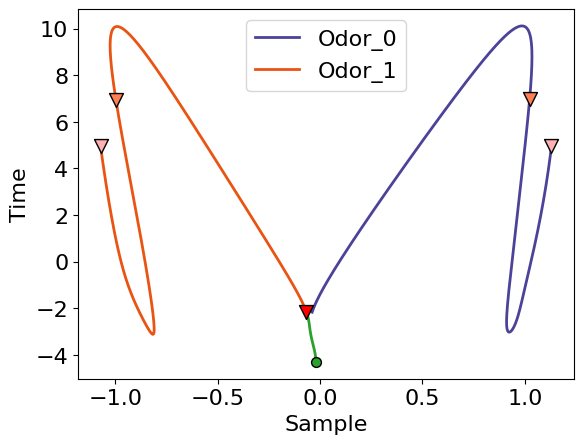

In [ ]:

print(Z['sdt'].shape)
temp1 = Z['s']
temp2 = Z['t']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:]
newtrace1 = newdata[:,1,0,:]
newtrace2 = newdata[:,0,1,:]
newtrace3 = newdata[:,1,1,:]
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800*2//3//6*1-100,0],matpi0[0:1800*2//3//6*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*1-100,0],matpi0[1800*2//3//6*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800*2//3//6*2,0],matpi0[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*2,0],matpi1[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi1[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#4c4398', linewidth=2,zorder=1, label='Odor_0')
plt.plot(matpi0[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi0[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#ea5413', linewidth=2,zorder=1, label='Odor_1')

plt.scatter(matpi0[1800*2//3//6*5,0],matpi0[1800*2//3//6*5,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*5,0],matpi1[1800*2//3//6*5,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)

plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Sample',fontsize=16)
plt.ylabel('Time',fontsize=16)

plt.legend(fontsize=16)
plt.savefig('figure/fig3c.svg')
plt.show()

##### dpca (3s) single

In [ ]:
data = data3
# abc
# trial-average data
R = np.mean(data,0)
# center data
R -= np.mean(R.reshape((N,-1)),1)[:,None,None,None]
dpca = dPCA.dPCA(labels='sdt',n_components=1,regularizer='auto',join =[{'s': ['s', 'st']}, {'d': ['d', 'dt']}, {'t'}, {'sd': ['sdt']}])
dpca.protect = ['t']
print(R.shape, data.shape)
Z = []
for i in range(data.shape[0]):
    Z.append(dpca.fit_transform(data[i],data))

###### dt (3s)

6
(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)
(1802, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)


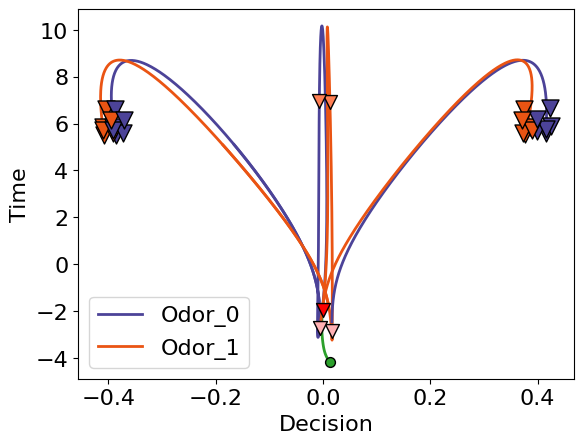

In [ ]:
print(len(Z))
print(Z[0]['sdt'].shape)
temp1 = Z[0]['d']
temp2 = Z[0]['t']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800*2//3//6*1-100,0],matpi0[0:1800*2//3//6*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*1-100,0],matpi0[1800*2//3//6*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800*2//3//6*2,0],matpi0[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*2,0],matpi1[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi1[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi0[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi0[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*5-280,0],matpi0[1800*2//3//6*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*5-280,0],matpi1[1800*2//3//6*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800*2//3//6*5-200:1800*2//3//6*6,0],matpi1[1800*2//3//6*5-200:1800*2//3//6*6,1], color='#4c4398', linewidth=2, label='Odor_0',zorder=1)
plt.plot(matpi0[1800*2//3//6*5-200:1800*2//3//6*6,0],matpi0[1800*2//3//6*5-200:1800*2//3//6*6,1], color='#ea5413', linewidth=2, label='Odor_1',zorder=1)

plt.plot(matpi2[1800*2//3//6*5-250:1800*2//3//6*6,0],matpi2[1800*2//3//6*5-250:1800*2//3//6*6,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi3[1800*2//3//6*5-250:1800*2//3//6*6,0],matpi3[1800*2//3//6*5-250:1800*2//3//6*6,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*6,0],matpi0[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*6,0],matpi1[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800*2//3//6*6,0],matpi2[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi3[1800*2//3//6*6,0],matpi3[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

for i in range(1, len(Z)):
    temp1 = Z[i]['d']
    temp2 = Z[i]['t']
    newdata = np.vstack((temp1, temp2))
    newdata = newdata.transpose(3,1,2,0)

    # Model = PCA
    # pca = Model(n_components=2)
    # newdata = data.T
    print(newdata.shape)
    NUM =90
    newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
    newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
    newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
    newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
    print('newtrace0:', newtrace0.shape)
    bz0 = Bezier(newtrace0, 1800)
    matpi0=bz0.getBezierPoints(0)
    bz1 = Bezier(newtrace1, 1800)
    matpi1=bz1.getBezierPoints(0)
    bz2 = Bezier(newtrace2, 1800)
    matpi2=bz2.getBezierPoints(0)
    bz3 = Bezier(newtrace3, 1800)
    matpi3=bz3.getBezierPoints(0)

    plt.scatter(matpi0[1800*2//3//6*6,0],matpi0[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi1[1800*2//3//6*6,0],matpi1[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi2[1800*2//3//6*6,0],matpi2[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi3[1800*2//3//6*6,0],matpi3[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Decision',fontsize=16)
plt.ylabel('Time',fontsize=16)

plt.legend(fontsize=16)
plt.savefig('figure/suppfig2_1.svg')
plt.show()

###### sd (3s)

(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)
(1802, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)


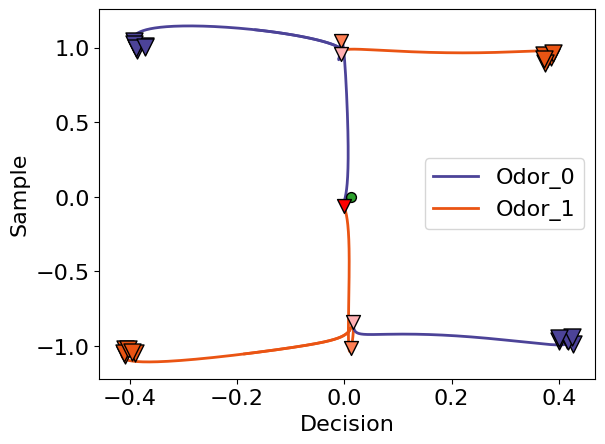

In [ ]:
print(Z[0]['sdt'].shape)
temp1 = Z[0]['s']
temp2 = Z[0]['d']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:]
newtrace1 = newdata[:,1,0,:]
newtrace2 = newdata[:,0,1,:]
newtrace3 = newdata[:,1,1,:]
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)

matpi0 = matpi0[:,[1,0]]
matpi1 = matpi1[:,[1,0]]
matpi2 = matpi2[:,[1,0]]
matpi3 = matpi3[:,[1,0]]

print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800*2//3//6*1-100,0],matpi0[0:1800*2//3//6*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*1-100,0],matpi0[1800*2//3//6*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800*2//3//6*2,0],matpi0[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*2,0],matpi1[1800*2//3//6*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi1[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi0[1800*2//3//6*1-100:1800*2//3//6*5,0],matpi0[1800*2//3//6*1-100:1800*2//3//6*5,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*5-280,0],matpi0[1800*2//3//6*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*5-280,0],matpi1[1800*2//3//6*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800*2//3//6*5-200:1800*2//3//6*6,0],matpi1[1800*2//3//6*5-200:1800*2//3//6*6,1], color='#4c4398', linewidth=2, label='Odor_0',zorder=1)
plt.plot(matpi0[1800*2//3//6*5-200:1800*2//3//6*6,0],matpi0[1800*2//3//6*5-200:1800*2//3//6*6,1], color='#ea5413', linewidth=2, label='Odor_1',zorder=1)

plt.plot(matpi2[1800*2//3//6*5-250:1800*2//3//6*6,0],matpi2[1800*2//3//6*5-250:1800*2//3//6*6,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi3[1800*2//3//6*5-250:1800*2//3//6*6,0],matpi3[1800*2//3//6*5-250:1800*2//3//6*6,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800*2//3//6*6,0],matpi0[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800*2//3//6*6,0],matpi1[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800*2//3//6*6,0],matpi2[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi3[1800*2//3//6*6,0],matpi3[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

for i in range(1, len(Z)):
    temp1 = Z[i]['s']
    temp2 = Z[i]['d']
    newdata = np.vstack((temp1, temp2))
    newdata = newdata.transpose(3,1,2,0)

    # Model = PCA
    # pca = Model(n_components=2)
    # newdata = data.T
    print(newdata.shape)
    NUM =90
    newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
    newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
    newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
    newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
    print('newtrace0:', newtrace0.shape)
    bz0 = Bezier(newtrace0, 1800)
    matpi0=bz0.getBezierPoints(0)
    bz1 = Bezier(newtrace1, 1800)
    matpi1=bz1.getBezierPoints(0)
    bz2 = Bezier(newtrace2, 1800)
    matpi2=bz2.getBezierPoints(0)
    bz3 = Bezier(newtrace3, 1800)
    matpi3=bz3.getBezierPoints(0)

    matpi0 = matpi0[:,[1,0]]
    matpi1 = matpi1[:,[1,0]]
    matpi2 = matpi2[:,[1,0]]
    matpi3 = matpi3[:,[1,0]]

    plt.scatter(matpi0[1800*2//3//6*6,0],matpi0[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi1[1800*2//3//6*6,0],matpi1[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi2[1800*2//3//6*6,0],matpi2[1800*2//3//6*6,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi3[1800*2//3//6*6,0],matpi3[1800*2//3//6*6,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Decision',fontsize=16)
plt.ylabel('Sample',fontsize=16)

plt.legend(fontsize=16)
plt.savefig('figure/suppfig2_2.svg')
plt.show()

##### dpca (6s) mean

In [ ]:
data = data6
# abc
# trial-average data
R = np.mean(data,0)
# center data
R -= np.mean(R.reshape((N,-1)),1)[:,None,None,None]
dpca = dPCA.dPCA(labels='sdt',n_components=1,regularizer='auto',join =[{'s': ['s', 'st']}, {'d': ['d', 'dt']}, {'t'}, {'sd': ['sdt']}])
dpca.protect = ['t']
print(R.shape, data.shape)
Z6 = dpca.fit_transform(R,data)

###### st (6s)

(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)
(1802, 2)


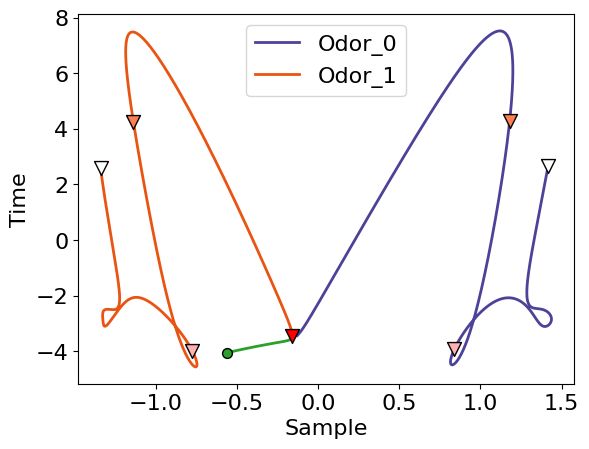

In [ ]:

print(Z6['sdt'].shape)
temp1 = Z6['s']
temp2 = Z6['t']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800//9*1-100,0],matpi0[0:1800//9*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800//9*1-100,0],matpi0[1800//9*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800//9*2,0],matpi0[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*2,0],matpi1[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800//9*1-100:1800//9*8,0],matpi1[1800//9*1-100:1800//9*8,1], color='#4c4398', linewidth=2,zorder=1,label="Odor_0")
plt.plot(matpi0[1800//9*1-100:1800//9*8,0],matpi0[1800//9*1-100:1800//9*8,1], color='#ea5413', linewidth=2,zorder=1,label="Odor_1")

plt.scatter(matpi0[1800//9*5-280,0],matpi0[1800//9*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*5-280,0],matpi1[1800//9*5-280,1], c='#ffb0b3', marker='v', s=100, edgecolors='k',zorder=2)

plt.scatter(matpi0[1800//9*8,0],matpi0[1800//9*8,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*8,0],matpi1[1800//9*8,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)

plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Sample',fontsize=16)
plt.ylabel('Time',fontsize=16)

plt.legend(fontsize=16)
plt.savefig('figure/fig3c.svg')
plt.show()

##### dpca (6s) single

In [ ]:
data = data6
# abc
# trial-average data
R = np.mean(data,0)
# center data
R -= np.mean(R.reshape((N,-1)),1)[:,None,None,None]
dpca = dPCA.dPCA(labels='sdt',n_components=1,regularizer='auto',join =[{'s': ['s', 'st']}, {'d': ['d', 'dt']}, {'t'}, {'sd': ['sdt']}])
dpca.protect = ['t']
print(R.shape, data.shape)
Z6 = []
for i in range(data.shape[0]):
    Z6.append(dpca.fit_transform(data[i],data))

You chose to determine the regularization parameter automatically. This can
                    take substantial time and grows linearly with the number of crossvalidation
                    folds. The latter can be set by changing self.n_trials (default = 3). Similarly,
                    use self.protect to set the list of axes that are not supposed to get to get shuffled
                    (e.g. upon splitting the data into test- and training, time-points should always
                    be drawn from the same trial, i.e. self.protect = ['t']). This can significantly
                    speed up the code.
(600, 2, 2, 90) (6, 600, 2, 2, 90)
Start optimizing regularization.
Starting trial  1 / 3
Starting trial  2 / 3
Starting trial  3 / 3
Optimized regularization, optimal lambda =  8.366825542528468e-05
Regularization will be fixed; to compute the optimal                    parameter again on the next fit, please                    set opt_regularizer_flag to True.


###### dt (6s)

(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)
(1802, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)


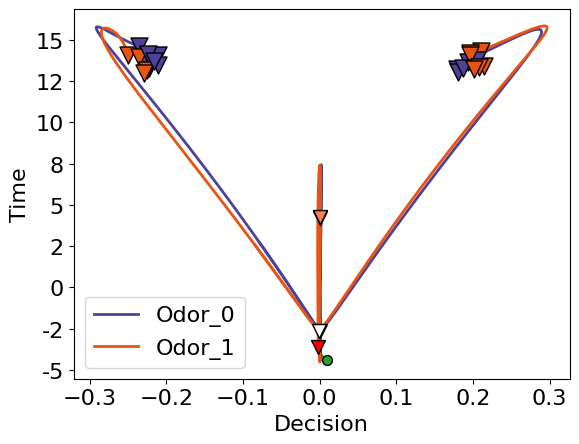

In [ ]:
print(Z6[0]['sdt'].shape)
temp1 = Z6[0]['d']
temp2 = Z6[0]['t']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)


print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800//9*1-100,0],matpi0[0:1800//9*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800//9*1-100,0],matpi0[1800//9*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800//9*2,0],matpi0[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*2,0],matpi1[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800//9*1-100:1800//9*8,0],matpi1[1800//9*1-100:1800//9*8,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi0[1800//9*1-100:1800//9*8,0],matpi0[1800//9*1-100:1800//9*8,1], color='#ea5413', linewidth=2,zorder=1)

plt.plot(matpi1[1800//9*8-200:1800//9*9,0],matpi1[1800//9*8-200:1800//9*9,1], color='#4c4398', linewidth=2, label='Odor_0',zorder=1)
plt.plot(matpi0[1800//9*8-200:1800//9*9,0],matpi0[1800//9*8-200:1800//9*9,1], color='#ea5413', linewidth=2, label='Odor_1',zorder=1)

plt.plot(matpi2[1800//9*8-250:1800//9*9,0],matpi2[1800//9*8-250:1800//9*9,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi3[1800//9*8-250:1800//9*9,0],matpi3[1800//9*8-250:1800//9*9,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800//9*8-200,0],matpi0[1800//9*8-200,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*8-200,0],matpi1[1800//9*8-200,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800//9*9,0],matpi0[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*9,0],matpi1[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800//9*9,0],matpi2[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi3[1800//9*9,0],matpi3[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

for i in range(1, len(Z6)):
    temp1 = Z6[i]['d']
    temp2 = Z6[i]['t']
    newdata = np.vstack((temp1, temp2))
    newdata = newdata.transpose(3,1,2,0)

    # Model = PCA
    # pca = Model(n_components=2)
    # newdata = data.T
    print(newdata.shape)
    NUM =90
    newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
    newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
    newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
    newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
    print('newtrace0:', newtrace0.shape)
    bz0 = Bezier(newtrace0, 1800)
    matpi0=bz0.getBezierPoints(0)
    bz1 = Bezier(newtrace1, 1800)
    matpi1=bz1.getBezierPoints(0)
    bz2 = Bezier(newtrace2, 1800)
    matpi2=bz2.getBezierPoints(0)
    bz3 = Bezier(newtrace3, 1800)
    matpi3=bz3.getBezierPoints(0)

    plt.scatter(matpi0[1800//9*9,0],matpi0[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi1[1800//9*9,0],matpi1[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi2[1800//9*9,0],matpi2[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi3[1800//9*9,0],matpi3[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Decision',fontsize=16)
plt.ylabel('Time',fontsize=16)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
plt.legend(fontsize=16)
plt.savefig('figure/suppfig2_3.svg')
plt.show()

###### sd (6s)

(1, 2, 2, 90)
(90, 2, 2, 2)
newtrace0: (90, 2)


(1802, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)
(90, 2, 2, 2)
newtrace0: (90, 2)


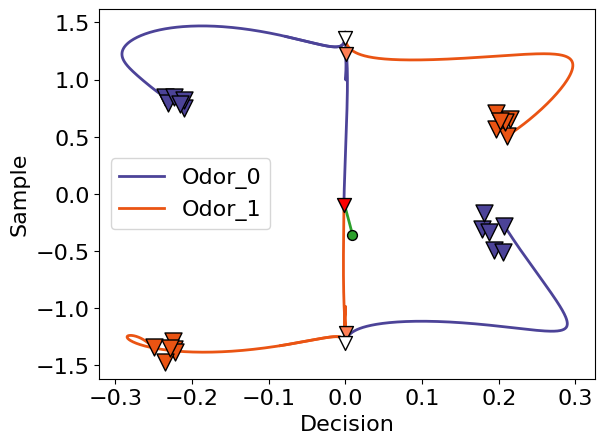

In [ ]:
print(Z6[0]['sdt'].shape)
temp1 = Z6[0]['s']
temp2 = Z6[0]['d']
newdata = np.vstack((temp1, temp2))
newdata = newdata.transpose(3,1,2,0)

# Model = PCA
# pca = Model(n_components=2)
# newdata = data.T
print(newdata.shape)
NUM =90
newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
print('newtrace0:', newtrace0.shape)
bz0 = Bezier(newtrace0, 1800)
matpi0=bz0.getBezierPoints(0)
bz1 = Bezier(newtrace1, 1800)
matpi1=bz1.getBezierPoints(0)
bz2 = Bezier(newtrace2, 1800)
matpi2=bz2.getBezierPoints(0)
bz3 = Bezier(newtrace3, 1800)
matpi3=bz3.getBezierPoints(0)

matpi0 = matpi0[:,[1,0]]
matpi1 = matpi1[:,[1,0]]
matpi2 = matpi2[:,[1,0]]
matpi3 = matpi3[:,[1,0]]

print(matpi0.shape)

fig=plt.figure()
ax = fig.gca()

plt.scatter(matpi0[0,0],matpi0[0,1], c='C2', marker='o', s=50, edgecolors='k',zorder=2)

plt.plot(matpi0[0:1800//9*1-100,0],matpi0[0:1800//9*1-100,1], color='C2', linewidth=2,zorder=1)

plt.scatter(matpi0[1800//9*1-100,0],matpi0[1800//9*1-100,1], c='#FF0000', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800//9*2,0],matpi0[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*2,0],matpi1[1800//9*2,1], c='#ff7f54', marker='v', s=100, edgecolors='k',zorder=2)

plt.plot(matpi1[1800//9*1-100:1800//9*8,0],matpi1[1800//9*1-100:1800//9*8,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi0[1800//9*1-100:1800//9*8,0],matpi0[1800//9*1-100:1800//9*8,1], color='#ea5413', linewidth=2,zorder=1)

plt.plot(matpi1[1800//9*8-200:1800//9*9,0],matpi1[1800//9*8-200:1800//9*9,1], color='#4c4398', linewidth=2, label='Odor_0',zorder=1)
plt.plot(matpi0[1800//9*8-200:1800//9*9,0],matpi0[1800//9*8-200:1800//9*9,1], color='#ea5413', linewidth=2, label='Odor_1',zorder=1)

plt.plot(matpi2[1800//9*8-250:1800//9*9,0],matpi2[1800//9*8-250:1800//9*9,1], color='#4c4398', linewidth=2,zorder=1)
plt.plot(matpi3[1800//9*8-250:1800//9*9,0],matpi3[1800//9*8-250:1800//9*9,1], color='#ea5413', linewidth=2,zorder=1)

plt.scatter(matpi0[1800//9*8-200,0],matpi0[1800//9*8-200,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*8-200,0],matpi1[1800//9*8-200,1], c='#FFFFFF', marker='v', s=100, edgecolors='k',zorder=2)
plt.scatter(matpi0[1800//9*9,0],matpi0[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi1[1800//9*9,0],matpi1[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi2[1800//9*9,0],matpi2[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
plt.scatter(matpi3[1800//9*9,0],matpi3[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)

for i in range(1, len(Z6)):
    temp1 = Z6[i]['s']
    temp2 = Z6[i]['d']
    newdata = np.vstack((temp1, temp2))
    newdata = newdata.transpose(3,1,2,0)

    # Model = PCA
    # pca = Model(n_components=2)
    # newdata = data.T
    print(newdata.shape)
    NUM =90
    newtrace0 = newdata[:,0,0,:] # odor1 odor1 match
    newtrace1 = newdata[:,1,0,:] # odor0 odor0 match
    newtrace2 = newdata[:,0,1,:] # odor1 odor0 non-match
    newtrace3 = newdata[:,1,1,:] # odor0 odor1 non-match
    print('newtrace0:', newtrace0.shape)
    bz0 = Bezier(newtrace0, 1800)
    matpi0=bz0.getBezierPoints(0)
    bz1 = Bezier(newtrace1, 1800)
    matpi1=bz1.getBezierPoints(0)
    bz2 = Bezier(newtrace2, 1800)
    matpi2=bz2.getBezierPoints(0)
    bz3 = Bezier(newtrace3, 1800)
    matpi3=bz3.getBezierPoints(0)

    matpi0 = matpi0[:,[1,0]]
    matpi1 = matpi1[:,[1,0]]
    matpi2 = matpi2[:,[1,0]]
    matpi3 = matpi3[:,[1,0]]

    plt.scatter(matpi0[1800//9*9,0],matpi0[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi1[1800//9*9,0],matpi1[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi2[1800//9*9,0],matpi2[1800//9*9,1], c='#4c4398', marker='v', s=150, edgecolors='k',zorder=2)
    plt.scatter(matpi3[1800//9*9,0],matpi3[1800//9*9,1], c='#ea5413', marker='v', s=150, edgecolors='k',zorder=2)
    
plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

plt.xlabel('Decision',fontsize=16)
plt.ylabel('Sample',fontsize=16)

plt.legend(fontsize=16)
plt.savefig('figure/suppfig2_4.svg')
plt.show()

## 9 TI

Sparsity: 0.9679166666666666
2.618766 -2.7255585
True
(1.401, 2.8239913927299654, 0.5755154588645874, 0.5886556169501057, 1.164, 0.3012603828794096, 0.2366255144032922)
10.317278 0.0
True


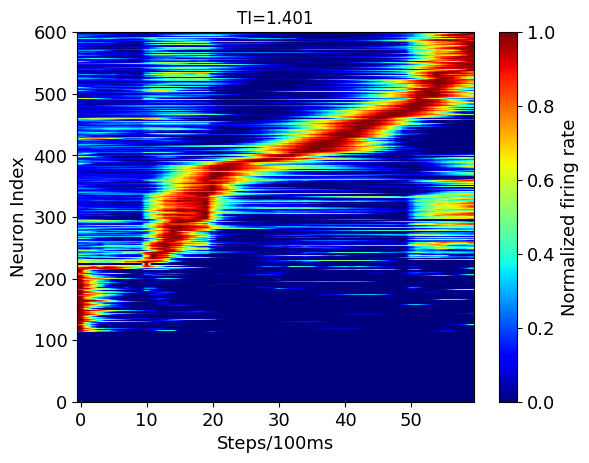

True
(1.867, 3.63262459353182, 0.7403109001009482, 0.680096006363022, 1.42, 0.4267619049897312, 0.44693877551020406)
5.0805693 0.0
True


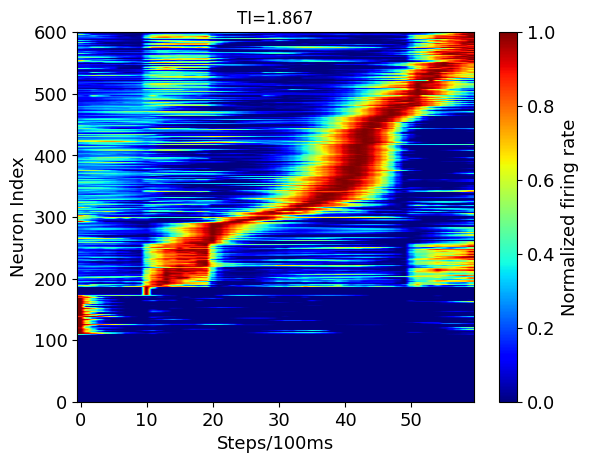

True
(1.955, 3.958008163084136, 0.8066224599803395, 0.6965992962004468, 1.503, 0.4205259574819901, 0.4517453798767967)
4.3882513 0.0
True


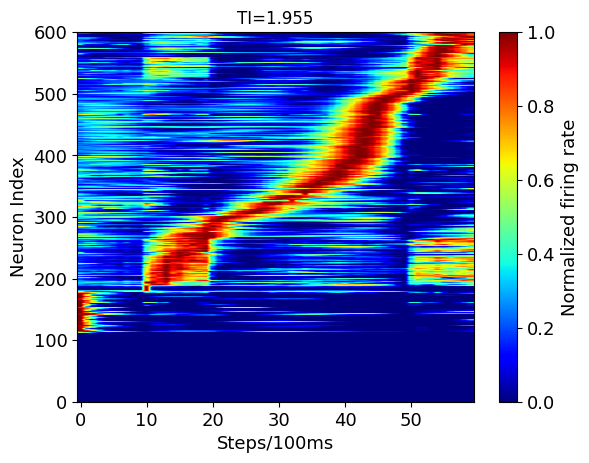

In [ ]:
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.01_m0.0'
results = pickle.load(open(netdir+'.pkl', 'rb'))['hidden_act'][-1][:,0,:]
import sys
sys.path.insert(0, "/home/jiashuncheng/code/Trasient/ODPA/")
from model_torch import Model
A = torch.load(netdir+'.pth').w_rnn.cpu().detach().numpy()
print("Sparsity:", A.nonzero()[0].shape[0]/(A.shape[0]*A.shape[1]))
print(A.max(), A.min())
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.01_m0.1.pkl'
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.01_m0.2.pkl'
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

250
True
(1.368, 2.729444110825891, 0.5562471910966675, 0.5902590116546038, 1.147, 0.28168018491462443, 0.2217741935483871)
9.425003 0.0
True


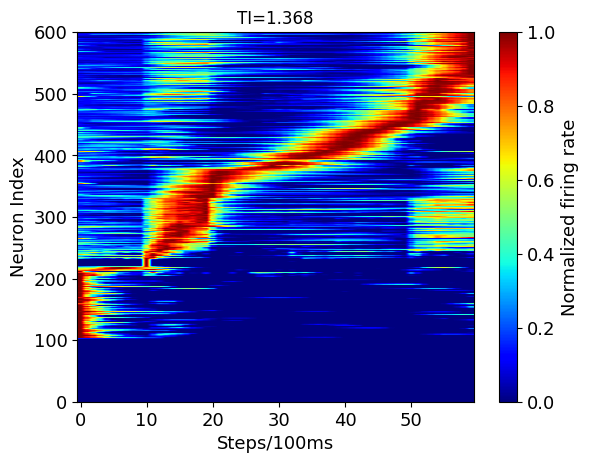

250
True
(1.835, 3.5632217134562185, 0.7261669368877245, 0.693409777036117, 1.42, 0.39844709966528064, 0.4153225806451613)
3.6830637 0.0
True


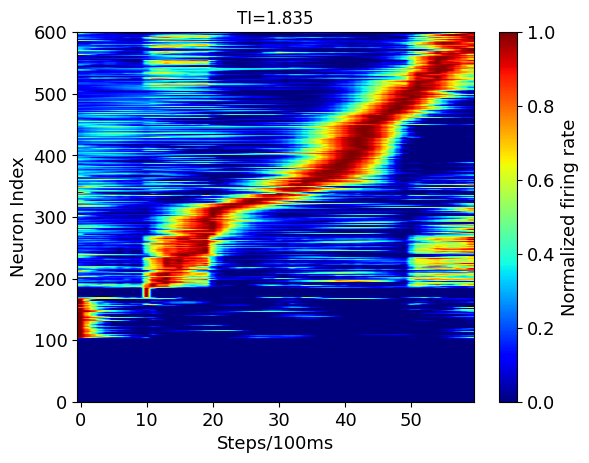

250
True
(1.885, 3.8268949233649, 0.7799022311175691, 0.6135283026785131, 1.393, 0.44549957144946317, 0.49206349206349204)
5.2304163 0.0
True


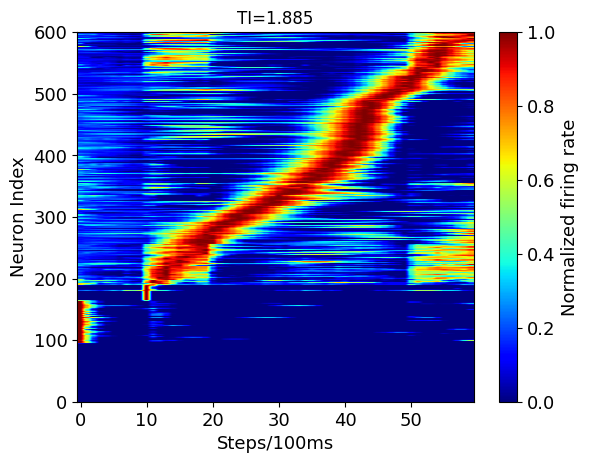

In [ ]:
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.1_m0.0.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.1_m0.1.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.1_m0.2.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

250
Sparsity: 0.969025
2.5943186 -2.690254
True
(1.16, 2.2967625241134604, 0.46806882675741257, 0.48075996563444295, 0.949, 0.2657503345831008, 0.21138211382113822)
10.657034 0.0
True


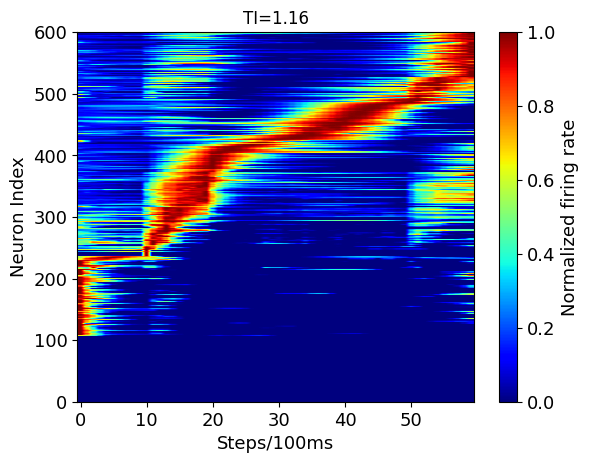

250
True
(1.685, 3.3592632578644492, 0.6846012138258927, 0.6076135350099163, 1.292, 0.39012814575403243, 0.39307535641547864)
4.74579 0.0
True


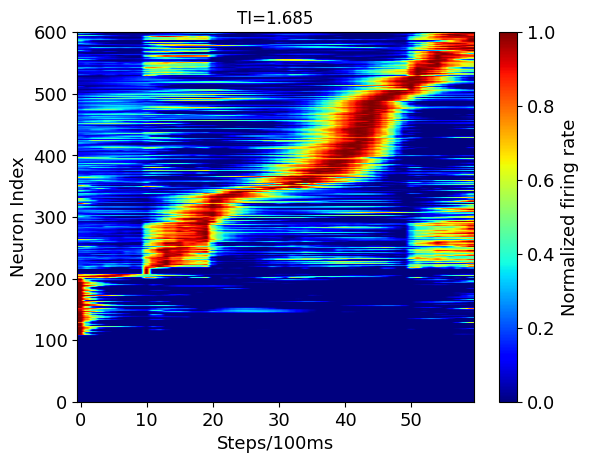

250
True
(1.864, 3.690521214005238, 0.7521099445967098, 0.6422417883070246, 1.394, 0.4289565743857019, 0.46975806451612906)
5.47719 0.0
True


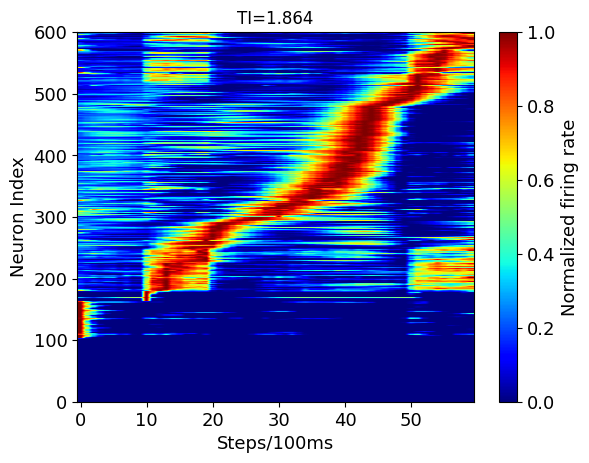

In [ ]:
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L21.0_m0.0'
print(len(pickle.load(open(netdir+'.pkl', 'rb'))['hidden_act']))
import sys
sys.path.insert(0, "/home/jiashuncheng/code/Trasient/ODPA/")
from model_torch import Model
A = torch.load(netdir+'.pth').w_rnn.cpu().detach().numpy()
print("Sparsity:", A.nonzero()[0].shape[0]/(A.shape[0]*A.shape[1]))
print(A.max(), A.min())
results = pickle.load(open(netdir+'.pkl', 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L21.0_m0.1.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L21.0_m0.2.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

250
True
(1.345, 3.0592232456336492, 0.6234545454042808, 0.39873973741129976, 1.022, 0.4540623506486096, 0.3225152129817444)
6.4155574 0.0
True


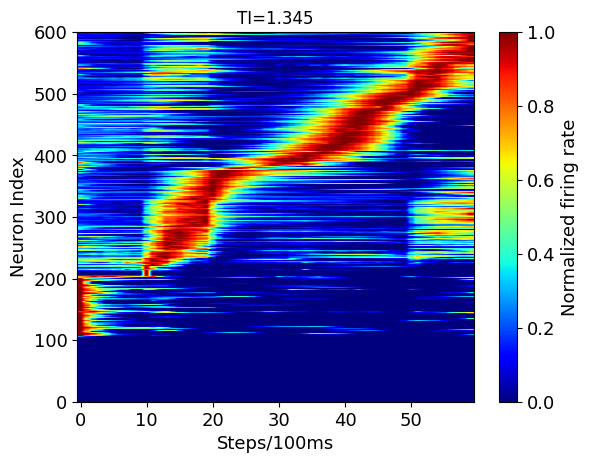

250
True
(1.548, 3.5004815397713736, 0.7133808002371549, 0.4230537101924419, 1.136, 0.534114172814647, 0.412)
4.3179646 0.0
True


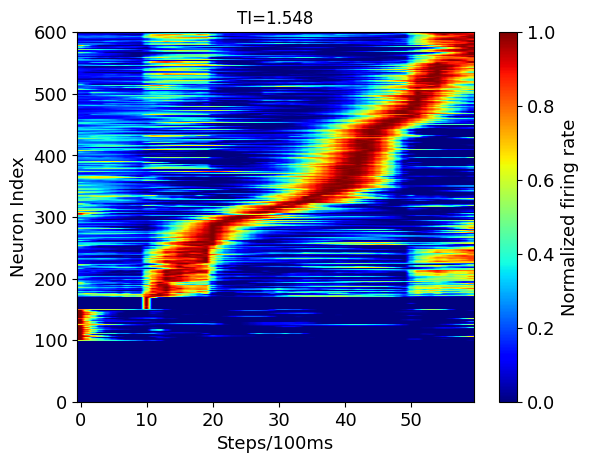

250
True
(1.595, 3.7278137701547105, 0.7597099828333167, 0.4066439467764092, 1.166, 0.5350589214662149, 0.4288577154308617)
4.156237 0.0
True


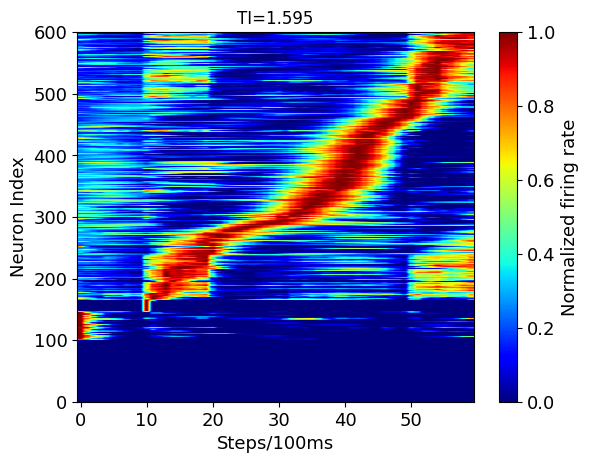

In [ ]:
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.0_m0.0.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.0_m0.1.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/max_delay_3000_delay_3_seed_0_L20.0_m0.2.pkl'
print(len(pickle.load(open(netdir, 'rb'))['hidden_act']))
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results,20,50))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

In [ ]:
import torch
a = torch.rand(20,20)>0.5
print(a)
w_h = torch.nn.Parameter(torch.Tensor(20,20), requires_grad=a)
# w_h.data.uniform_(-9, 9)
# w_h.data *= 10.0
w_h.requires_grad

tensor([[False,  True,  True, False,  True,  True,  True, False,  True, False,
          True,  True, False,  True,  True,  True, False, False, False,  True],
        [ True, False,  True,  True,  True, False,  True,  True, False, False,
         False, False,  True, False,  True, False, False, False,  True,  True],
        [False, False,  True,  True, False,  True,  True,  True,  True, False,
          True, False,  True, False, False,  True,  True, False,  True,  True],
        [False,  True,  True, False,  True, False, False,  True, False,  True,
         False, False, False, False, False, False,  True, False, False,  True],
        [False,  True,  True, False,  True, False, False, False,  True,  True,
          True,  True,  True,  True, False,  True, False,  True,  True, False],
        [ True,  True, False, False, False,  True,  True, False,  True,  True,
         False, False,  True, False, False, False,  True, False, False, False],
        [False, False, False,  True,  True, Fa

TypeError: _make_subclass(): argument 'require_grad' (position 3) must be bool, not Tensor

## Grid search

0
{'4, 0.2:': 1.552}
[1.442 1.552 1.361 1.441 1.363 1.32  1.246 1.31  1.282 1.088]
[3.16836619 3.90702748 2.98145914 5.754879   3.60877156 3.5504427
 2.5290432  2.76553202 2.17398548 6.31781149]
[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


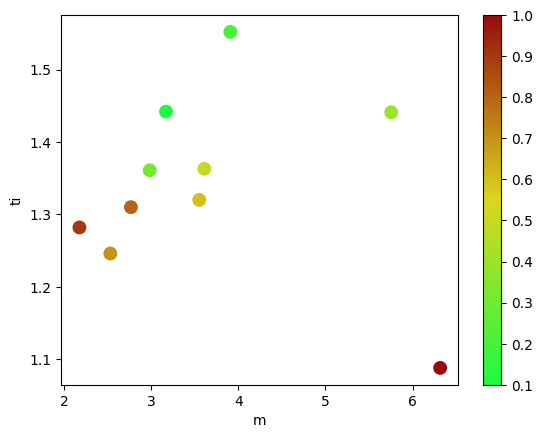

In [ ]:
import os
import matplotlib.colors as mcolors

def get_files_in_folder(folder_path):
    file_list = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append(file_path)
    return file_list

max_ = {" ":0}
for j in range(4,5):
    CON = np.zeros(10)
    TI = np.zeros(10)
    M = np.zeros(10)
    DOT = np.zeros((10,2)) #m, ti
    print(list(max_.values())[0])
    for i in range(1,11):
        netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_0125_auto_noise_trasient_sparse_con__hie{:.1f}_tansient_True_connection_{:.1f}_region_True_mode_train_delay_6_hidd_120_seed_0_lr0.01'.format(i*0.1, i*0.1)
        files = get_files_in_folder(netdir)
        # print(files)
        for file in files:
            # print(file)
            if file[-3:] == '.pt':
                # print(file)
                read = torch.load(file)
                hidden_act = read['hidden_act'][:,j,:]
                m = read['m'].mean(1)[j].cpu().detach().numpy()
        ti = cal_TI(hidden_act)[0]
        TI[i-1]=ti
        CON[i-1]=0.1*i
        M[i-1]=m
        DOT[i-1,:]=np.array([m, ti])
        if ti > list(max_.values())[0]:
            max_ = {'{}, {:.1f}:'.format(j, i*0.1): ti}
    print(max_)

    print(TI)
    print(M)
    print(CON)

    colors = ["#1CFB41", "#DCD61D", "#960C0C"] 
    cmap_1 = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors)

    sc = plt.scatter(M, TI, c=CON, cmap=cmap_1, marker='o', s=80)
    cbar = plt.colorbar(sc)
    plt.xlabel('m')
    plt.ylabel('ti')
    plt.show()
    plt.close()

0
[1.415 1.33  1.374 1.216 1.206 1.233 1.099 0.959 1.115 0.932]
[2.47572803 4.0501976  3.36601901 1.57783699 0.87578666 1.95506275
 0.94591165 2.31349325 1.76189744 0.92732894]
[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


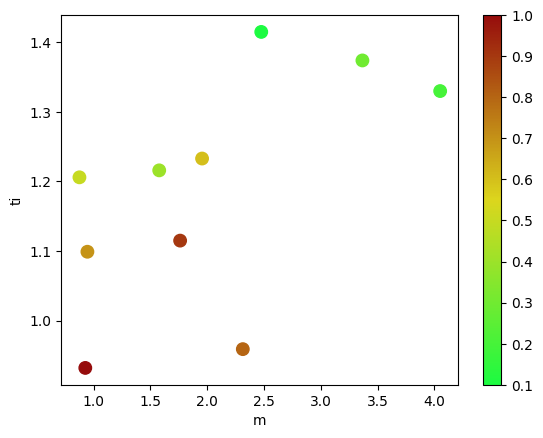

In [ ]:
import os
import matplotlib.colors as mcolors

def get_files_in_folder(folder_path):
    file_list = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append(file_path)
    return file_list

max_ = {" ":0}
CON = np.zeros(10)
TI = np.zeros(10)
M = np.zeros(10)
DOT = np.zeros((10,2)) #m, ti
print(list(max_.values())[0])
for i in range(1,11):
    netdir  = '/home/jiashuncheng/code/Trasient/ODPA/new/savedir/exp_0125_auto_noise_trasient_sparse_con_{:.1f}_tansient_True_connection_{:.1f}_region_False_mode_train_delay_6_hidd_120_seed_0_lr0.01'.format(i*0.1, i*0.1)
    files = get_files_in_folder(netdir)
    for file in files:
        if file[-3:] == '.pt':
            # print(file)
            read = torch.load(file)
            hidden_act = read['hidden_act'][:,4,:]
            m = read['m'].mean(1)[4].cpu().detach().numpy()
    ti = cal_TI(hidden_act)[0]
    TI[i-1]=ti
    CON[i-1]=0.1*i
    M[i-1]=m
    DOT[i-1,:]=np.array([m, ti])

print(TI)
print(M)
print(CON)

sc = plt.scatter(M, TI, c=CON, cmap=cmap_1, marker='o', s=80)
cbar = plt.colorbar(sc)
plt.xlabel('m')
plt.ylabel('ti')
plt.show()

# x = np.arange(0.1, 1.1, 0.1)
# y = np.arange(0.1, 1.1, 0.1)
# X, Y = np.meshgrid(x, y)
# Z = z
# plt.imshow(Z, vmin=0, vmax=2.2)
# # plt.zlim(0,2.2)
# plt.colorbar()
# plt.xlabel('x')
# plt.ylabel('y')
# plt.show()

# fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
# x1 = np.arange(0.1, 1.1, 0.01)
# y1 = np.arange(0.1, 1.1, 0.01)
# X1, Y1 = np.meshgrid(x1,y1)
# f1 = RGI((x, y), Z.T, method='cubic',bounds_error=False)
# Z1 = f1((X1, Y1))
# surf = ax.plot_surface(X1, Y1, Z1, cmap=cm.jet, linewidth=0, antialiased=False, vmin=0, vmax=2.3)
# fig.colorbar(surf, shrink=0.5, aspect=5)
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_zlim([0,2.3])
# plt.show()

(1.788, 4.4676837425292195, 0.7563511919199457, 0.5644483971643736, 1.321, 0.5116134228396578, 0.46680080482897385)


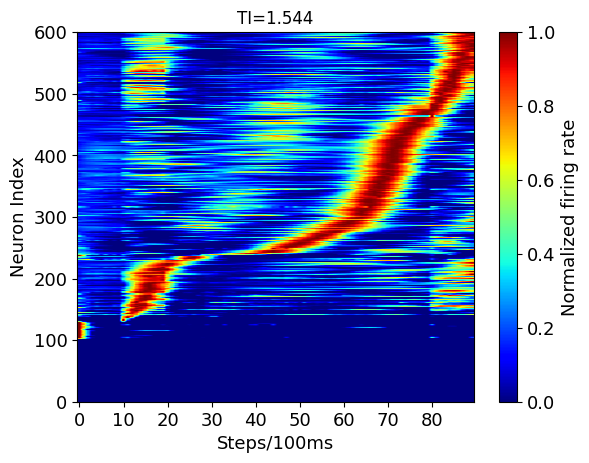

(0.038, 0.0, 0.0, 0.03780353148251969, 0.038, 0.02410081561334085, 0.0)


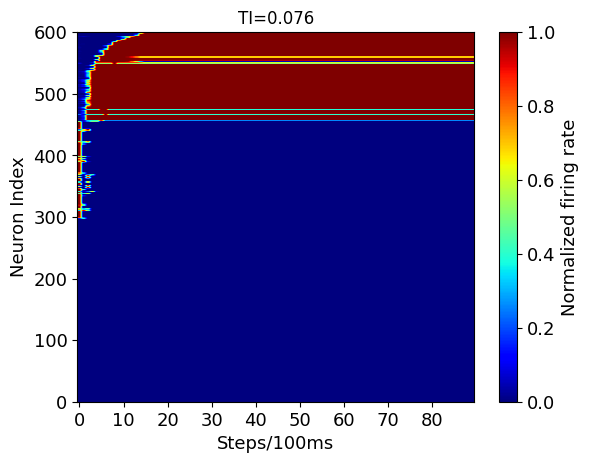

(1.215, 2.9247898767562206, 0.4951488146624314, 0.3489584056222999, 0.844, 0.2801337410838855, 0.37080536912751677)


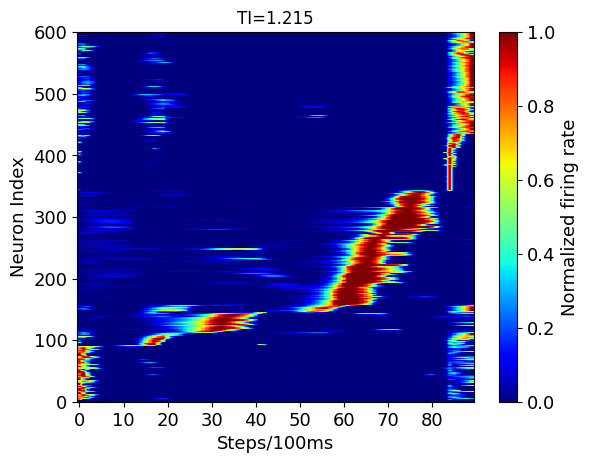

In [ ]:
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/train/trasient_sparse_heirachical_v5.pkl'
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/savedir/train/control_v2.pkl'
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,50)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/trasient_sparse_v6.pkl'
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
print(cal_TI(results))
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
plt.title('TI={}'.format(cal_TI(results,20,80)[0]))
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
plt.show()

0
{'0.2 0.5:': 2.127}


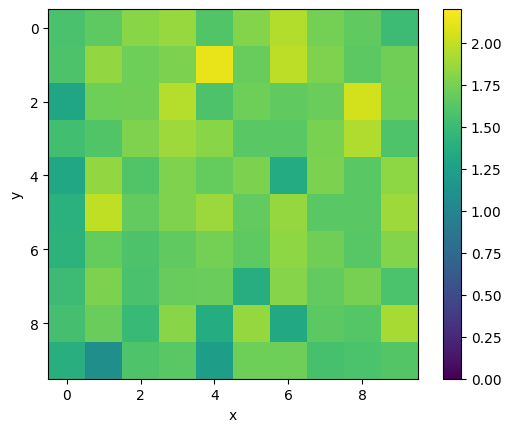

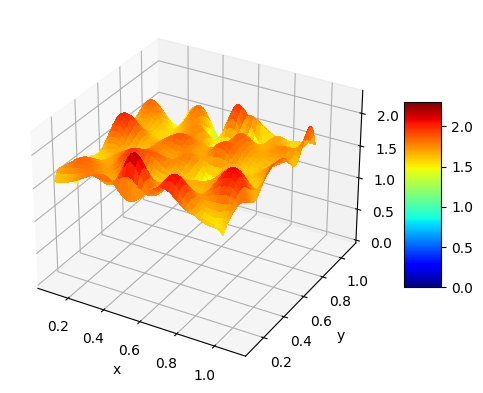

In [ ]:
max_ = {" ":0}
z = np.zeros((10,10))
print(list(max_.values())[0])
for i in range(1,11):
    for j in range(1,11):
        netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/0.2_seed_1_old_auto_trasient_sparse_heirachical_con_{:.1f}_m_{:.1f}.pkl'.format(i*0.1, j*0.1)
        results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
        hidden_act = results.T
        # print(pickle.load(open(netdir, 'rb'))['m'][-1])
        data0 = hidden_act
        TI = cal_TI(results)[0]
        z[i-1,j-1]=TI
        # print('{:.1f} {:.1f}:'.format(i*0.1, j*0.1), TI)
        if TI > list(max_.values())[0]:
            max_ = {'{:.1f} {:.1f}:'.format(i*0.1, j*0.1): TI}
print(max_)

x = np.arange(0.1, 1.1, 0.1)
y = np.arange(0.1, 1.1, 0.1)
X, Y = np.meshgrid(x, y)
Z = z
plt.imshow(Z, vmin=0, vmax=2.2)
# plt.zlim(0,2.2)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
x1 = np.arange(0.1, 1.1, 0.01)
y1 = np.arange(0.1, 1.1, 0.01)
X1, Y1 = np.meshgrid(x1,y1)
f1 = RGI((x, y), Z.T, method='cubic',bounds_error=False)
Z1 = f1((X1, Y1))
surf = ax.plot_surface(X1, Y1, Z1, cmap=cm.jet, linewidth=0, antialiased=False, vmin=0, vmax=2.3)
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlim([0,2.3])
plt.show()

0
{'0.4 0.5:': 2.051}
0.065


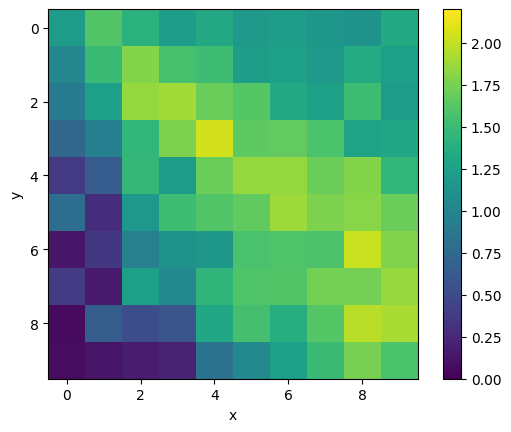

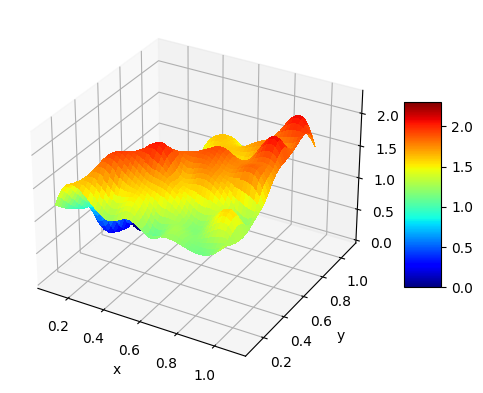

In [ ]:
max_ = {" ":0}
z = np.zeros((10,10))
print(list(max_.values())[0])
for i in range(1,11):
    for j in range(1,11):
        netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/0.2_seed_1_old_auto_trasient_sparse_con_{:.1f}_m_{:.1f}.pkl'.format(i*0.1, j*0.1)
        results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
        hidden_act = results.T
        # print(pickle.load(open(netdir, 'rb'))['m'][-1])
        data0 = hidden_act
        TI = cal_TI(results)[0]
        z[i-1,j-1]=TI
        # print('{:.1f} {:.1f}:'.format(i*0.1, j*0.1), TI)
        if TI > list(max_.values())[0]:
            max_ = {'{:.1f} {:.1f}:'.format(i*0.1, j*0.1): TI}
print(max_)

x = np.arange(0.1, 1.1, 0.1)
y = np.arange(0.1, 1.1, 0.1)
X, Y = np.meshgrid(x, y)
Z = z
print(Z.min())
plt.imshow(Z, vmin=0, vmax=2.2)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
x1 = np.arange(0.1, 1.1, 0.01)
y1 = np.arange(0.1, 1.1, 0.01)
X1, Y1 = np.meshgrid(x1,y1)
f1 = RGI((x, y), Z.T, method='cubic',bounds_error=False)
Z1 = f1((X1, Y1))
surf = ax.plot_surface(X1, Y1, Z1, cmap=cm.jet, linewidth=0, antialiased=False, vmin=0, vmax=2.3)
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlim([0,2.3])
plt.show()

1.0 0.5: 0.834
12:


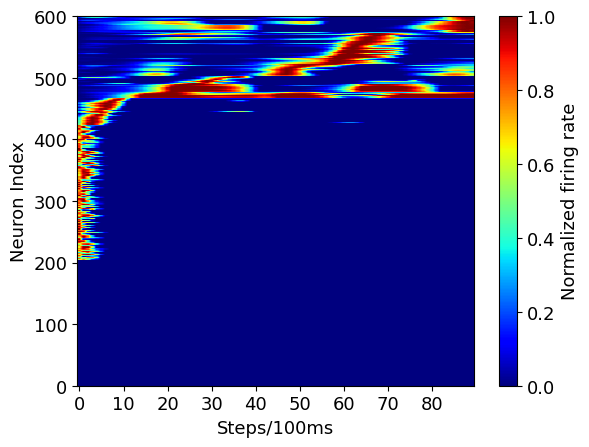

In [ ]:
i=10
j=5
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/0.2_seed_1_old_auto_trasient_sparse_con_{:.1f}_m_{:.1f}.pkl'.format(i*0.1, j*0.1)
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
TI = cal_TI(results)[0]
print('{:.1f} {:.1f}:'.format(i*0.1, j*0.1), TI)
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
print('12:')
plt.show()

0.2 0.5: 1.516


12:


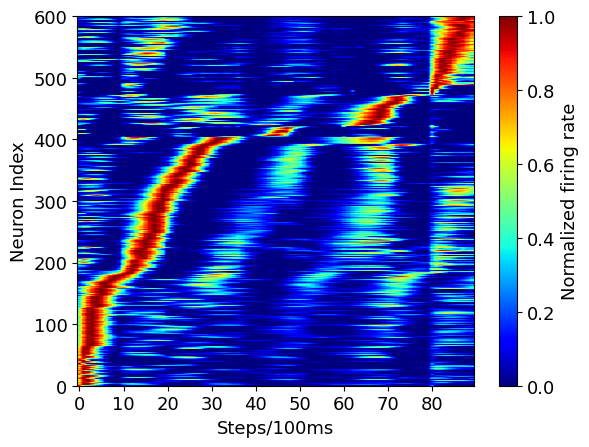

In [ ]:
i=2
j=5
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/0.2_seed_1_old_auto_trasient_sparse_con_{:.1f}_m_{:.1f}.pkl'.format(i*0.1, j*0.1)
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
TI = cal_TI(results)[0]
print('{:.1f} {:.1f}:'.format(i*0.1, j*0.1), TI)
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
print('12:')
plt.show()

0.2 0.5: 2.127
123:


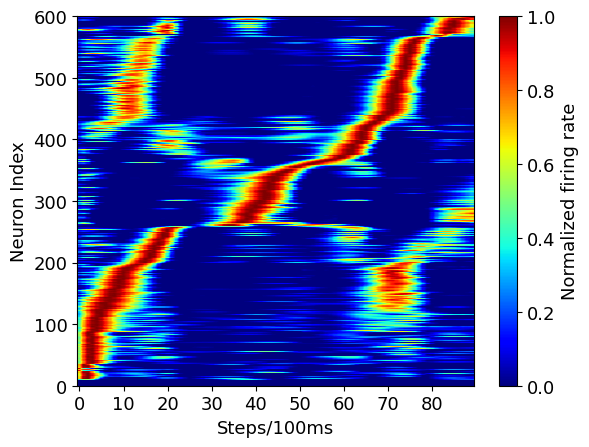

In [ ]:
i=2
j=5
netdir  = '/home/jiashuncheng/code/Trasient/ODPA/old/savedir/0.2_seed_1_old_auto_trasient_sparse_heirachical_con_{:.1f}_m_{:.1f}.pkl'.format(i*0.1, j*0.1)
results = pickle.load(open(netdir, 'rb'))['hidden_act'][-1][:,0,:]
hidden_act = results.T
# print(pickle.load(open(netdir, 'rb'))['m'][-1])
data0 = hidden_act
TI = cal_TI(results)[0]
print('{:.1f} {:.1f}:'.format(i*0.1, j*0.1), TI)
newdata0 = data0.copy()
data0 = normalization1(data0)
B_mylstm= sorting(data0)
data0 = data0[B_mylstm,:]
fig=plt.imshow(data0, aspect='auto',cmap='jet')
# plt.vlines(x=10,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=20,ymin=0,ymax=600,linewidth=2,color='white')
# plt.vlines(x=50,ymin=0,ymax=600,linewidth=2,color='white')
plt.xlabel('Steps/100ms', fontsize=13)
plt.gca().invert_yaxis()
plt.ylabel('Neuron Index', fontsize=13)
font = {"size":13}
cb = plt.colorbar(fig)
cb.set_label('Normalized firing rate',fontdict=font)
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
cb.ax.tick_params(labelsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(0,600)
# plt.savefig('figure/fig3a1.svg')
print('123:')
plt.show()

In [ ]:
np.arange(0,360,360/2)

array([  0., 180.])

In [ ]:
{'0.3 1.0:': 2.181}

In [ ]:
import numpy as np
import torch
s = np.random.poisson(size=(4, 3))
s.shape

torch.arange(3).tolist()

s[[2, 3, 0], np.arange(3)] = 9
b = torch.zeros((4,3))
b[([[2,3,0],[1,2,0]], [[0,1,2], [0,1,2]])] = 9
a = torch.ones((1,3))
a.type(torch.int)
torch.tensor((1))
torch.inf

x = 1
b = {}
b[0] = x
b[0] = 2
print(x)
a = [x]
a[0] = 2
import ctypes
# ctypes.cast(a[0], ctypes.py_object) = 1
print(id(x))
print(id(a[0]))

1
7618240
7618272


In [ ]:
a = 1
b = [a]
b[0] = 2
print(b[0] is a)



False


In [ ]:
# a = torch.nn.Module()
# b = a
# a = 2
# print(id(a))


from ctypes import *
x = 0
a = c_int(x)
b = pointer(a)
b.contents.value = 1
print(x)

0


In [ ]:
import torch
b = 2
a = {}
a[0] = b
b = 1
print(a[0])

index = torch.arange(10).unsqueeze(0).unsqueeze(0)
index.repeat(2,3,1).shape

torch.arange(3).unsqueeze(1).unsqueeze(0).repeat(3,1,1)

import torch

# 创建一个2x3的张量
x = torch.tensor([[[1, 2, 3], [4, 5, 6], [7,8,9]], [[1, 2, 3], [4, 5, 6], [7,8,2]]])
print("Original tensor:")
print(x)

# 使用torch.index_select()函数获取第0行（索引为0）
row_0 = torch.index_select(x, 0, torch.tensor([0]))
print("Row 0 with same dimension:")
print(row_0.shape)

from torch.autograd import Function, Variable

torch.tensor(2, dtype=torch.float)
Variable(torch.zeros(0)).grad

2
Original tensor:
tensor([[[1, 2, 3],
         [4, 5, 6],
         [7, 8, 9]],

        [[1, 2, 3],
         [4, 5, 6],
         [7, 8, 2]]])
Row 0 with same dimension:
torch.Size([1, 3, 3])


TypeError: tensor() got an unexpected keyword argument 'type'

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class ActionFun(Function):
	@staticmethod
	def forward(ctx, v):
		ctx.save_for_backward(v)
		return v.gt(5)

	@staticmethod
	def backward(ctx, grad_output):
		v = ctx.saved_tensors
		grad_input = grad_output.clone()
		temp = abs(v - 5) < 5
		return grad_input * temp.float()

# 定义一个简单的线性模型
class SimpleModel(nn.Module):
    def __init__(self):
        super(SimpleModel, self).__init__()
        self.linear = nn.Linear(1, 1)

    def forward(self, x):
        X = []
        for i in range(2):
            X.append(self.linear(x[i]))
        X = torch.stack(X, dim=0)
        return X

# 创建模型、损失函数和优化器
model = SimpleModel()
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# 输入数据和目标值
input_data = torch.rand((2,2,1))
target_data = torch.rand((2, 1))

# 前向传播
output = model(input_data)

# 计算损失
print(output.shape, target_data.shape)
loss = criterion(output.mean(0), target_data)

# 反向传播
loss.backward()
print(model.linear.weight.grad)
# 更新模型参数
# optimizer.step()

# 清空梯度
optimizer.zero_grad()


torch.Size([2, 2, 1]) torch.Size([2, 1])
tensor([[-0.8714]])


In [ ]:
eval("1,2")

(1, 2)